In [3]:
#%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=True, use_cache=True)
%config IPCompleter.greedy=True

import libpysal as lp

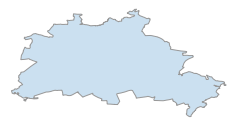

{'init': 'epsg:4326'}


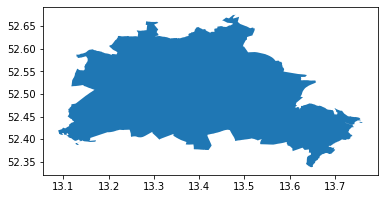

time: 430 ms


In [4]:
city = ox.gdf_from_place('Berlin, Germany', which_result=2)
#city = ox.project_gdf(city)
fig, ax = ox.plot_shape(city, figsize=(4,4))
ox.save_gdf_shapefile(city)
crs = {'init': 'epsg:4326'}
city = city.to_crs(crs)
print(city.crs)
city.plot()

14922
data max index: 14921
number of NA prices: 0
average bedroom price 53.36594127026819
pointinpoly length: 14922
check contains: True
check if there are NAs: False


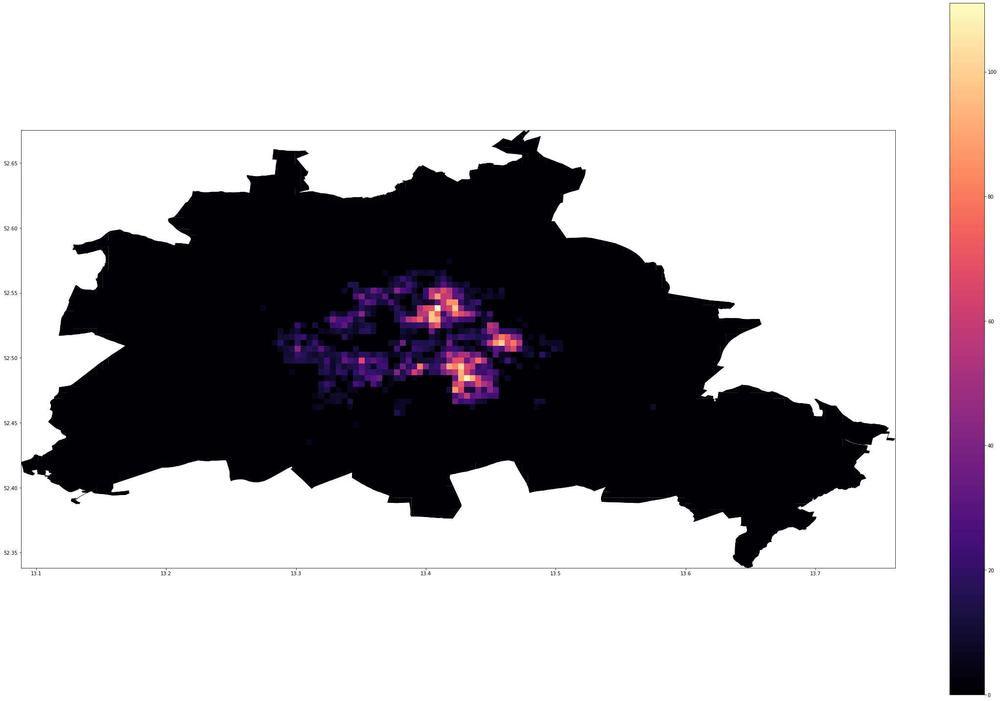

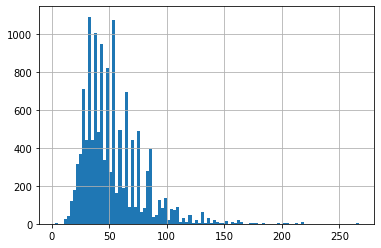

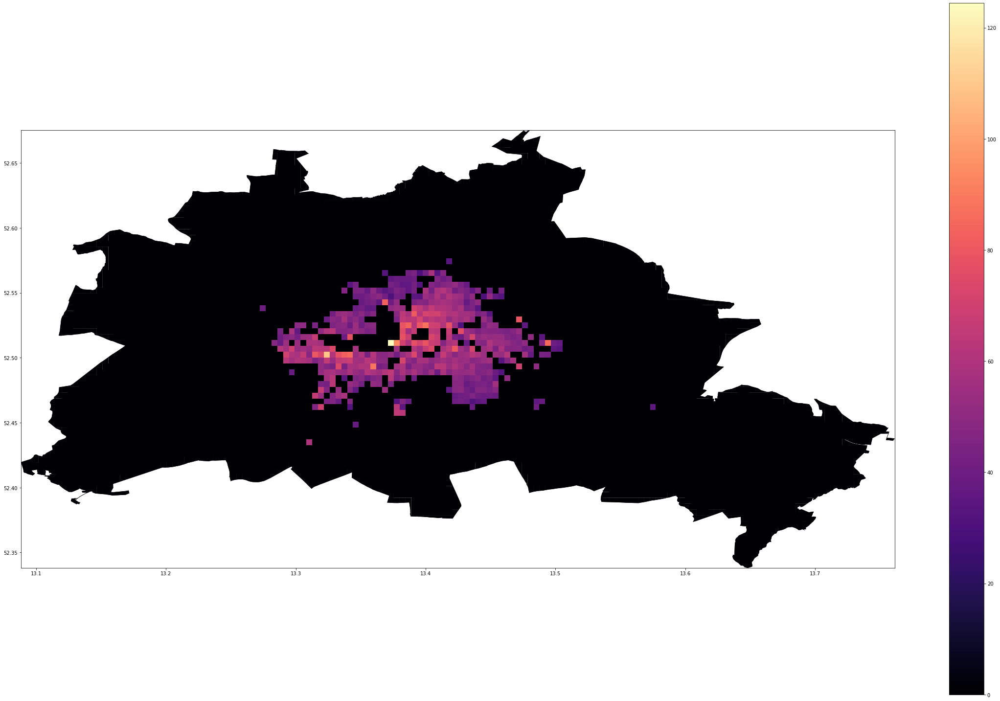

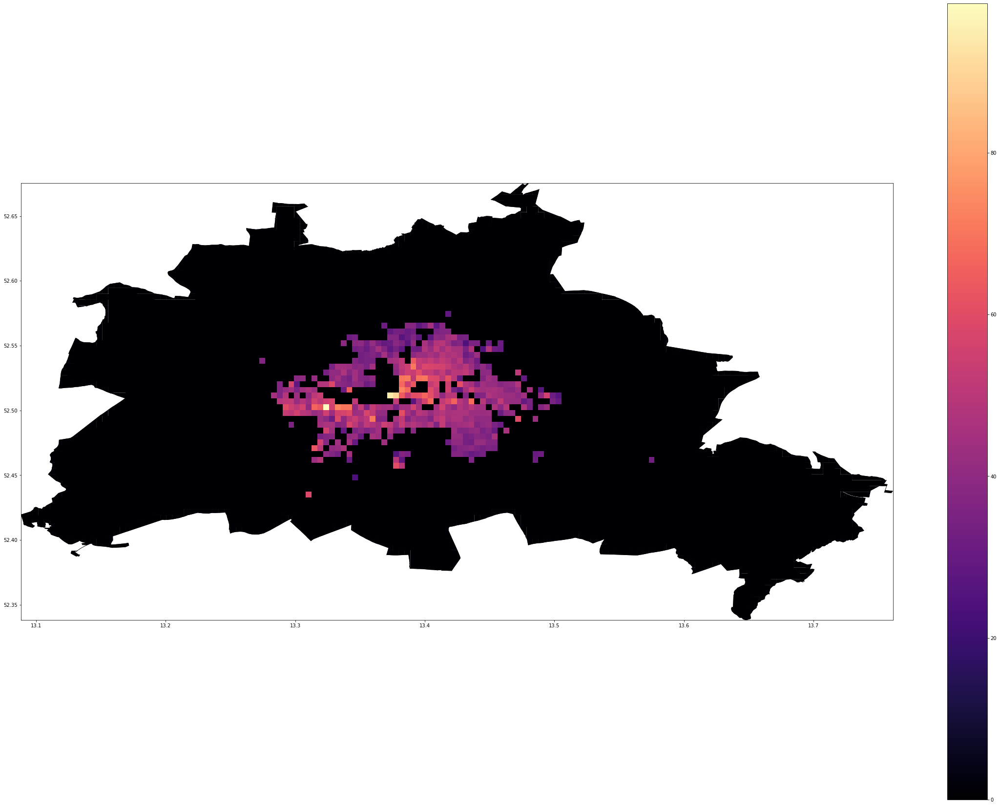

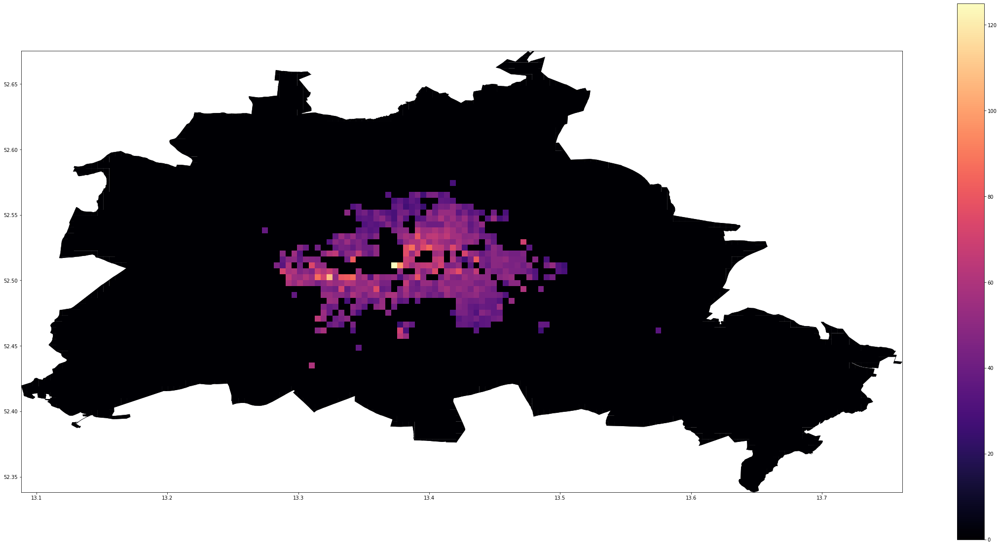

time: 21.5 s


In [5]:
data = pd.read_csv('data/Airbnb_Berlin.csv', header=0, index_col=0)
data = data[['room_id','latitude', 'longitude', 'bedrooms', 'price']]
print(len(data))

data.reset_index(drop=True, inplace=True)
print("data max index:", data.index.max())
print("number of NA prices:", data.price.isna().sum())

data.loc[data.bedrooms == 0, 'bedrooms'] = 1

price_proom = np.divide(np.array(data[pd.notnull(data['bedrooms'])].price),np.array(data[pd.notnull(data['bedrooms'])].bedrooms))
mean_bed = np.mean(price_proom)
print("average bedroom price",mean_bed)

nan_list = data[data.bedrooms.isna()].index.tolist()
data.loc[data.bedrooms.isna(), 'bedrooms'] = np.ceil(data.loc[data.bedrooms.isna(), 'price']/mean_bed)

geometry = [Point(xy) for xy in zip(data.longitude, data.latitude)]
#data = data.drop(['longitude', 'latitude'], axis=1)
crs = {'init': 'epsg:4326'}
gdf = gpd.GeoDataFrame(data, crs=crs, geometry=geometry)

meter_500 = 0.00899928/2


# make the geometry a multipolygon if it's not already
geometry = city['geometry'].iloc[0]
if isinstance(geometry, Polygon):
    geometry = MultiPolygon([geometry])
    
# quadrat_width is in the units the geometry is in, so we'll do a tenth of a degree
geometry_cut = ox.quadrat_cut_geometry(geometry, quadrat_width=meter_500)

city['coords'] = city['geometry'].apply(lambda x: x.representative_point().coords[:])
city['coords'] = [coords[0] for coords in city['coords']]

polylist = [p for p in geometry_cut]

polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.geometry.crs
polyframe['center_lon'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][0])
polyframe['center_lat'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][1])


pointInPoly = gpd.sjoin(polyframe, gdf, op='contains')
print("pointinpoly length:",len(pointInPoly))

#pointInPoly.sort_values(['PlateID', 'Time'], inplace=True)
pointInPoly['index'] = pointInPoly.index
pointInPoly.reset_index(drop=True, inplace=True)


present_ind = list(pointInPoly['index_right'])
gdf_test_dropped = gdf.iloc[present_ind,:]
gdf_dropped = gdf_test_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)

print("check contains:",polyframe.iloc[pointInPoly.loc[len(pointInPoly)-1, 'index']].geometry.contains(gdf_dropped.loc[len(pointInPoly)-1,'geometry']))
gdf_dropped['pindex'] = pointInPoly['index']

print("check if there are NAs:", gdf_dropped.isna().values.any())

pindex = gdf_dropped.pindex.unique()
airbnb_dict = dict(gdf_dropped.pindex.value_counts())
counts = pd.DataFrame(list(airbnb_dict.items()), columns=['key', 'count'])
counts = counts[counts['count']>5]
counts = counts.copy()
airbnb_dict = dict(zip(list(counts['key']), list(counts['count'])))
polyair = polyframe.copy()
polyair['count'] = 0
polyair['count'].update(pd.Series(airbnb_dict))

# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='count',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


gdf_dropped = gdf_dropped[gdf_dropped.pindex.isin(airbnb_dict.keys())]
gdf_dropped = gdf_dropped.copy()
gdf_dropped = gdf_dropped[gdf_dropped['price'] > 0]
gdf_dropped = gdf_dropped.copy()
gdf_dropped['price_normalized'] = gdf_dropped.price.divide(gdf_dropped.bedrooms)
gdf_dropped = gdf_dropped[gdf_dropped.price_normalized<270]
gdf_dropped = gdf_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)
gdf_dropped.price_normalized.hist(bins=100)

prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].mean())
from scipy import stats
hmean_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].apply(lambda x: stats.hmean(x)))
median_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].median())

polyair['prices'] = 0
polyair['hmean_prices'] = 0
polyair['median_prices'] = 0
polyair['prices'].update(pd.Series(prices_dict))
polyair['hmean_prices'].update(pd.Series(hmean_prices_dict))
polyair['median_prices'].update(pd.Series(median_prices_dict))


# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()



# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,30))


polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))


polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)

plt.show()


In [6]:
polyair[polyair.median_prices==polyair.median_prices.max()]

,geometry,center_lon,center_lat,count,prices,hmean_prices,median_prices
2113,"POLYGON ((13.3709276780045 52.5136220279955, 1...",13.37317,52.511374,10,124.416667,94.561443,125.0


time: 16 ms


In [7]:
gdf_dropped[gdf_dropped.pindex==5535]

,room_id,latitude,longitude,bedrooms,price,geometry,pindex,price_normalized
12571,7104231,52.501601,13.324160,1.0,141.0,POINT (13.32416 52.501601),5535,141.0
12572,5598445,52.501822,13.323791,1.0,97.0,POINT (13.323791 52.501822),5535,97.0
12573,5668715,52.501872,13.325992,1.0,98.0,POINT (13.325992 52.501872),5535,98.0
12574,5397926,52.502260,13.323350,1.0,108.0,POINT (13.32335 52.50226),5535,108.0
12575,1685839,52.503239,13.323176,1.0,108.0,POINT (13.323176 52.503239),5535,108.0
12576,7037153,52.503262,13.321807,1.0,55.0,POINT (13.321807 52.503262),5535,55.0
12577,7251349,52.504468,13.323975,1.0,62.0,POINT (13.323975 52.504468),5535,62.0
12578,6177251,52.500933,13.325014,1.0,141.0,POINT (13.325014 52.500933),5535,141.0
12579,6769379,52.500987,13.323376,1.0,97.0,POINT (13.323376 52.500987),5535,97.0
12580,7000139,52.500992,13.323532,1.0,162.0,POINT (13.323532 52.500992),5535,162.0


time: 19 ms


In [8]:
polyair.loc[polyair.index==5535, 'median_prices'] = 98
polyair.loc[polyair.index==5535, 'hmean_prices'] = 95
polyair.loc[polyair.index==5535, 'prices'] = 99

time: 6 ms


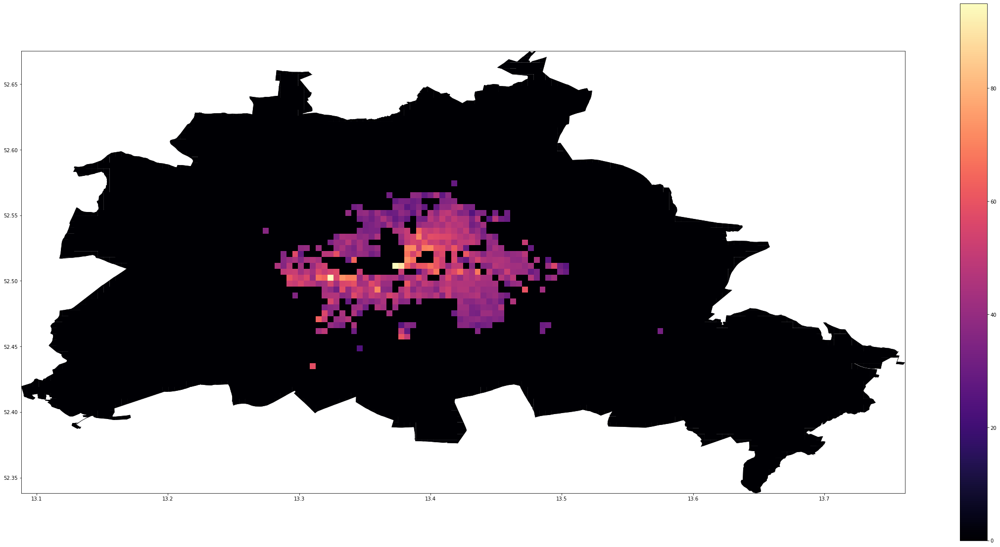

time: 4.01 s


In [9]:
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))
# for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
#     p = polygon.representative_point().coords[:][0]
#     patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', zorder=2)
#     ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

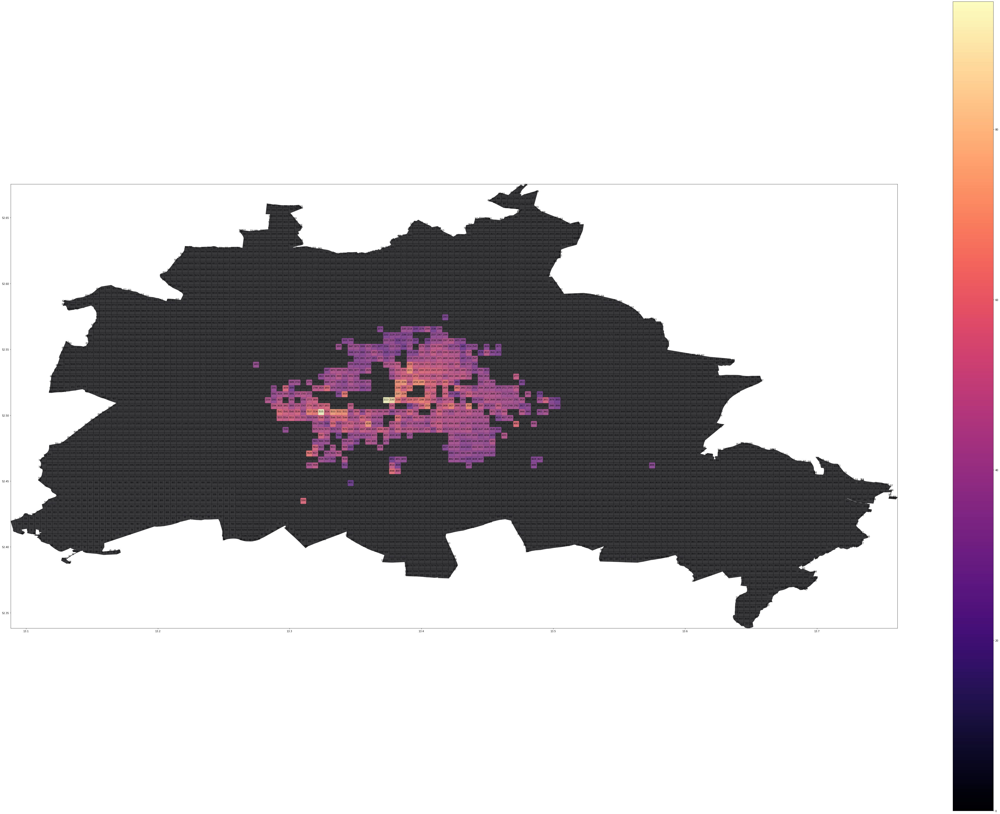

time: 1min


In [10]:
# plot the city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(80,60))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p,
                 horizontalalignment='center', size=8)
polyframe.plot(ax=ax, color='#000004', alpha=0.5)
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax, alpha=0.7, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

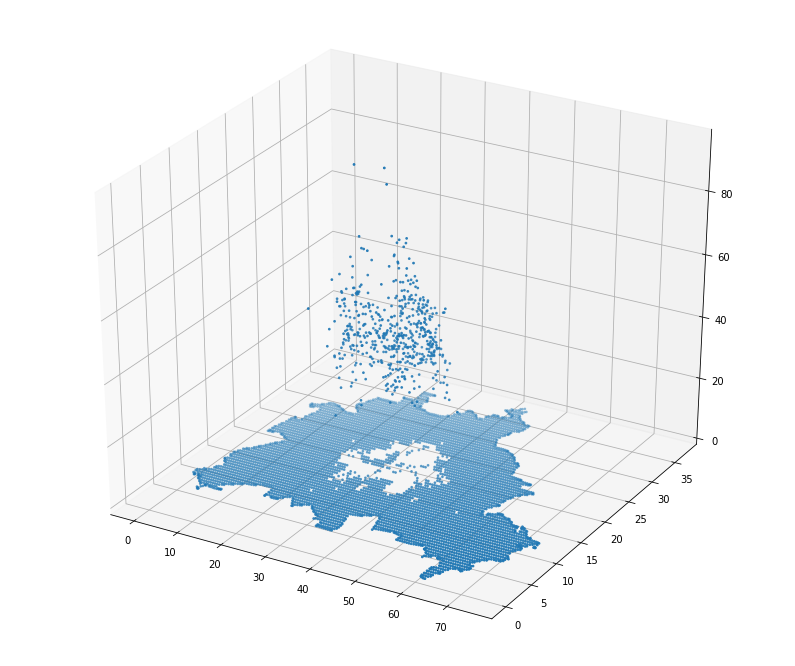

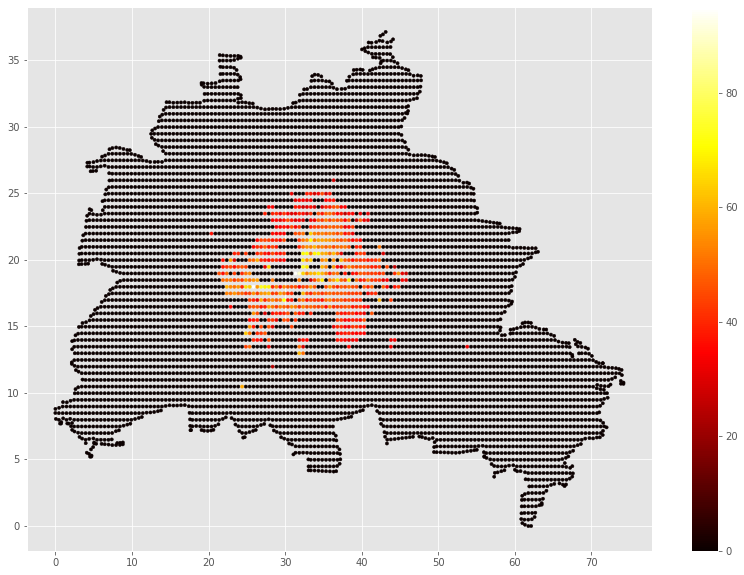

time: 2.48 s


In [11]:
import plotly.plotly as py
import plotly.graph_objs as go

# MatPlotlib
import matplotlib.pyplot as plt
from matplotlib import pylab
from mpl_toolkits.mplot3d import Axes3D
#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

y = np.array(polyair.center_lat)*500/meter_500 
y = y-y.min()
y = y/1000


# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, np.array(polyair.hmean_prices), cmap='plasma', s=3)
ax.set_zlim(0,np.max(np.array(polyair.hmean_prices))+2)
ax.view_init(30, 300)
plt.show()


plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(14,10))
scat = ax.scatter(x, y, c=np.array(polyair.hmean_prices), s=10, cmap='hot')
cbar = fig.colorbar(scat)
#cbar.set_clim(0, 250)
plt.savefig('images/Berlin_observed.jpg')
plt.show()

In [12]:
cdf = polyair[polyair.index.isin([5535, 2140, 4108, 2221, 2524, 4568, 2951, 4083])]
cdf["cen_lon_km"] = cdf['center_lon'].apply(lambda x: (x*500/meter_500 - (polyair.center_lon*500/meter_500).min())/1000)
cdf["cen_lat_km"] = cdf['center_lat'].apply(lambda x: (x*500/meter_500 - (polyair.center_lat*500/meter_500).min())/1000)
cdf

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,geometry,center_lon,center_lat,count,prices,hmean_prices,median_prices,cen_lon_km,cen_lat_km
2140,"POLYGON ((13.37541311733783 52.5136220279955, ...",13.377656,52.511374,10,93.733333,89.724700,97.75,31.855563,18.970438
2221,"POLYGON ((13.38886943533783 52.5361062879955, ...",13.391112,52.533858,11,81.325000,70.783063,79.00,33.350829,21.468889
2524,"POLYGON ((13.43372382867117 52.5091251759955, ...",13.435967,52.506877,10,72.050000,68.103794,65.00,38.335049,18.470748
2951,"POLYGON ((13.4920345400045 52.5136220279955, 1...",13.494277,52.511374,8,85.500000,55.401177,52.00,44.814535,18.970438
4083,"POLYGON ((13.47409278266217 52.4956346199955, ...",13.471850,52.493386,9,69.555556,59.573569,60.00,42.322425,16.971677
4108,"POLYGON ((13.36195679932883 52.4956346199955, ...",13.359714,52.493386,8,88.427083,70.879832,75.00,29.861875,16.971677
4568,"POLYGON ((13.37989855666217 52.4596598039955, ...",13.377656,52.457411,16,65.062500,60.169563,64.00,31.855563,12.974156
5535,"POLYGON ((13.32607328466217 52.5046283239955, ...",13.323831,52.502380,11,99.000000,95.000000,98.00,25.874499,17.971058


time: 527 ms


Fitted parameters:
[44.64447319 35.80448714 19.80526193  5.39163378  3.23309481  0.41001645
  1.77001488 62.32868452 26.42524169 17.55740487  3.2912811   1.19928713
  0.34312651  0.88619234]
RMS residual = 7.687334289777579


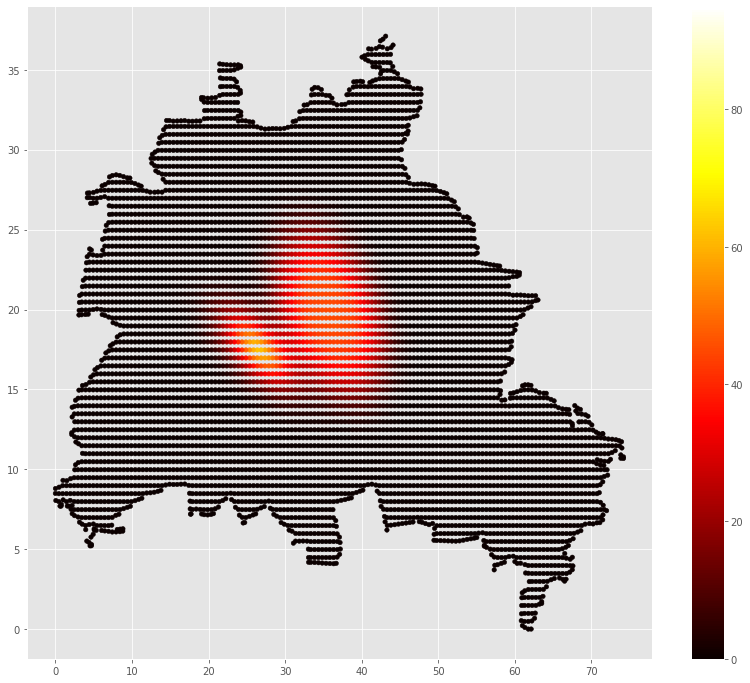

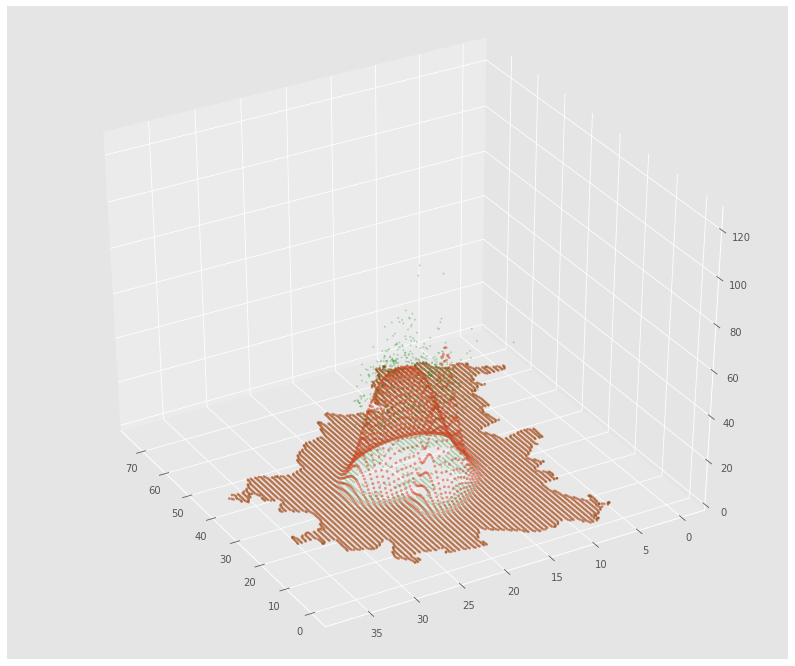

{'Berlin': 1.3281036059479567}
time: 2.49 s


In [13]:
alphas = {}
xy = np.vstack([x, y])
zobs = np.array(polyair.hmean_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//7):
        arr += twoD_Gaussian_alpha(xy, *args[i*7:i*7+7])
    return arr

guess_prms = [(89.72,31.855563,18.970438, 4, 3,0.9, 1.5),
              #(70,33.350829,21.468889, 1, 2,1, 1.5),
              #(68,38.335049,18.470748, 3, 4,0.542, 1.5),
              #(55,44.814535,18.970438, 1,1,0.49),
              #(59,42.322425,16.971677, 2, 1,0.2),
              #(70,29.861875,16.971677, 1, 0.5,0.8, 1.5),
              #(60,31.855563,12.974156, 0.5, 0.9,0.4, 1.5),
              (95,25.874499,17.971058, 0.5, 1,0.3, 1.5)
             ]
# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian_alpha(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, alpha):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2))**alpha)
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//7):
    zpred += twoD_Gaussian_alpha(xy, *popt[i*7:i*7+7])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=20, cmap='hot')
fig.colorbar(scat)
plt.savefig('Arezzo_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=5, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=2, alpha=0.2)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(35, 150)
plt.show()

alphas['Berlin'] = np.mean(popt[6::7])
print(alphas)

In [14]:
import pickle
pickle_in = open("alphas.pickle","rb")
alphas_dict = pickle.load(pickle_in)
#prices_params_dict = {}
alphas_dict['Berlin'] = alphas['Berlin']
print(alphas_dict)
pickle_out = open("alphas.pickle","wb")
pickle.dump(alphas_dict, pickle_out)
pickle_out.close()

{'Paris': 1.9119263949210794, 'Amsterdam': 1.6077156181165682, 'Stockholm': 1.4869621148124246, 'Arezzo': 1.5291330654483044, 'Berlin': 1.3281036059479567, 'Bordeaux': 1.387341915093677, 'Denver': 0.9886695315944182, 'Edinburgh': 1.7431661910906637, 'Lyon': 1.840995035260712, 'Madrid': 1.561423826026336, 'Buenos_Aires': 2.0626361633770363, 'Los_Angeles': 1.7386638625850566, 'Beijing': 1.77233254047711, 'Florence': 1.052999973906332, 'Moscow': 1.822610958759147, 'Porto': 1.4172416677632145, 'Prague': 1.3671832768992007, 'Reykjavik': 1.4194582940670377, 'Riga': 1.4587192546215861, 'Rome': 1.8608390724186512, 'Seoul': 1.3208669147673713, 'Siena': 0.6212787996336754, 'Sydney': 2.584174464016137, 'Tallin': 2.014994948135572, 'Treviso': 1.07320426583068, 'Valencia': 1.5432619, 'Venezia': 1.3156028460923, 'Verona': 1.4364606330705336, 'Vicenza': 1.20971848439062, 'Vienna': 1.3399164167136137, 'Wellington': 1.46363348, 'Zurich': 1.72383878, 'Aarhus': 1.87621535, 'Milan': 2.1468310347956194, 'B

Fitted parameters:
[ 4.02280235e+01  2.84192942e+01  2.16209511e+01  3.95497040e+00
  8.11763565e-01  2.59302978e+00  6.22845123e+01  3.52566571e+01
  2.15984734e+01  1.61270708e+00  2.78822480e+00  1.26693604e+00
  4.72929518e+01  3.86271291e+01  1.53114409e+01  1.47578507e+00
  1.14226197e+00 -4.16068560e-01  4.64722035e+01  3.54947026e+01
  1.76717319e+01  6.46713599e+00  1.19777021e+00 -2.04856676e-01
  8.49600800e+01  3.20694123e+01  1.32820692e+01  2.61381737e-01
  4.67362603e-01  4.16405716e-02  5.93025753e+01  2.57329095e+01
  1.78375272e+01  2.83892138e+00  7.14587080e-01 -2.92610853e+00]
RMS residual = 6.874283952767538


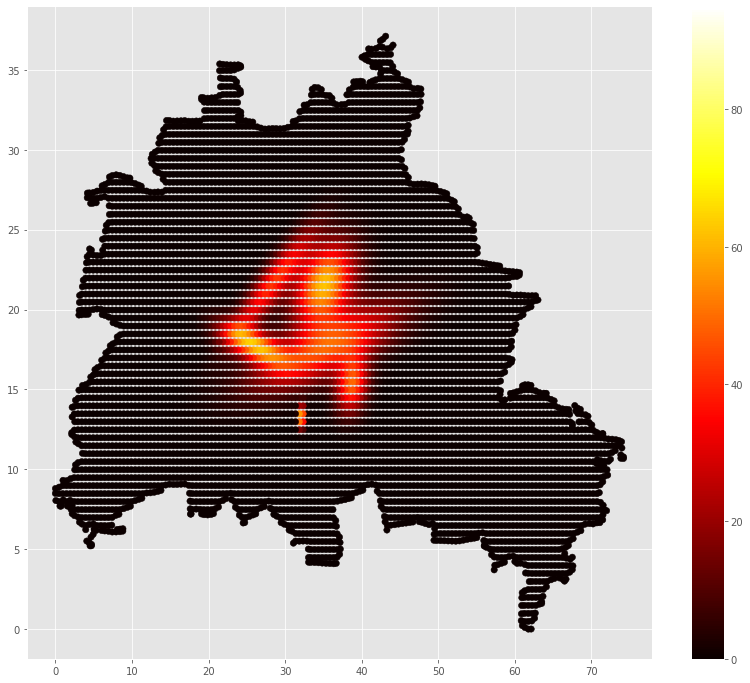

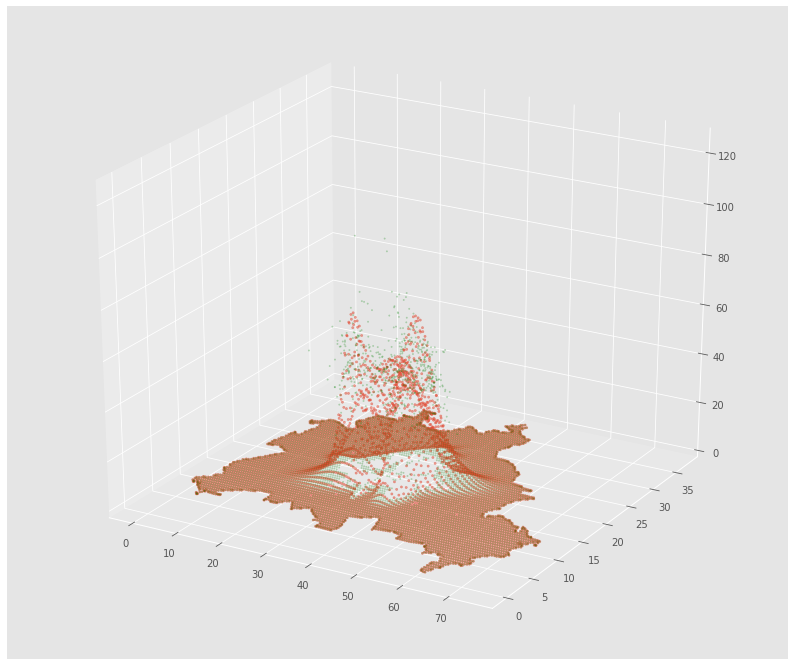

[40.22802351 62.28451225 47.29295179 46.47220353 84.96007999 59.30257533]
time: 4.31 s


In [15]:
xy = np.vstack([x, y])
zobs = np.array(polyair.hmean_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//6):
        arr += twoD_Gaussian(xy, *args[i*6:i*6+6])
    return arr

guess_prms = [(89.72,31.855563,18.970438, 4, 3,0.9),
              (70,33.350829,21.468889, 1, 2,1),
              (68,38.335049,18.470748, 3, 4,0.542),
              #(55,44.814535,18.970438, 1,1,0.49),
              #(59,42.322425,16.971677, 2, 1,0.2),
              (70,29.861875,16.971677, 1, 0.5,0.8),
              (60,31.855563,12.974156, 0.5, 0.9,0.4),
              (95,25.874499,17.971058, 0.5, 1,0.3)
             ]

# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//6):
    zpred += twoD_Gaussian(xy, *popt[i*6:i*6+6])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=40, cmap='hot')
fig.colorbar(scat)
plt.savefig('Berlin_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=5, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=2, alpha=0.2)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(25, 300)
plt.show()
print(popt[::6])

In [16]:
def is_pos_def(x):
    return np.all(np.linalg.eigvals(x) > 0)

sqrt_eigs_long = np.array([])
sqrt_eigs_short = np.array([])
for i in range(0, len(popt), 6):
    a = (np.cos(popt[i+5])**2)/(2*popt[i+3]**2) + (np.sin(popt[i+5])**2)/(2*popt[i+4]**2)
    b = -(np.sin(2*popt[i+5]))/(4*popt[i+3]**2) + (np.sin(2*popt[i+5]))/(4*popt[i+4]**2)
    c = (np.sin(popt[i+5])**2)/(2*popt[i+3]**2) + (np.cos(popt[i+5])**2)/(2*popt[i+4]**2)
    cov = np.array([a, b, b, c]).reshape(-1, 2)
    print("Is cov_{} positive definite?: ".format(i//6+1), is_pos_def(cov))
    eigenvalues = np.linalg.eigvals(cov)
    eigenvalues = eigenvalues[eigenvalues>0]
    if eigenvalues.size!=0:
        stds = np.sqrt(eigenvalues)/popt[i]
        #stds = stds[stds>=0]
        sqrt_eigs_long = np.append(sqrt_eigs_long,max(stds))
        sqrt_eigs_short = np.append(sqrt_eigs_short,min(stds))

print('long stds: ', sqrt_eigs_long, 'mean: ', np.mean(sqrt_eigs_long))
print('short stds: ', sqrt_eigs_short, 'mean: ', np.mean(sqrt_eigs_short))

Is cov_1 positive definite?:  True
Is cov_2 positive definite?:  True
Is cov_3 positive definite?:  True
Is cov_4 positive definite?:  True
Is cov_5 positive definite?:  True
Is cov_6 positive definite?:  True
long stds:  [0.02165343 0.00703962 0.01308949 0.01270335 0.0318416  0.01668616] mean:  0.017168942092868542
short stds:  [0.0044444  0.00407171 0.01013131 0.00235277 0.01780804 0.00420009] mean:  0.007168052637480604
time: 8 ms


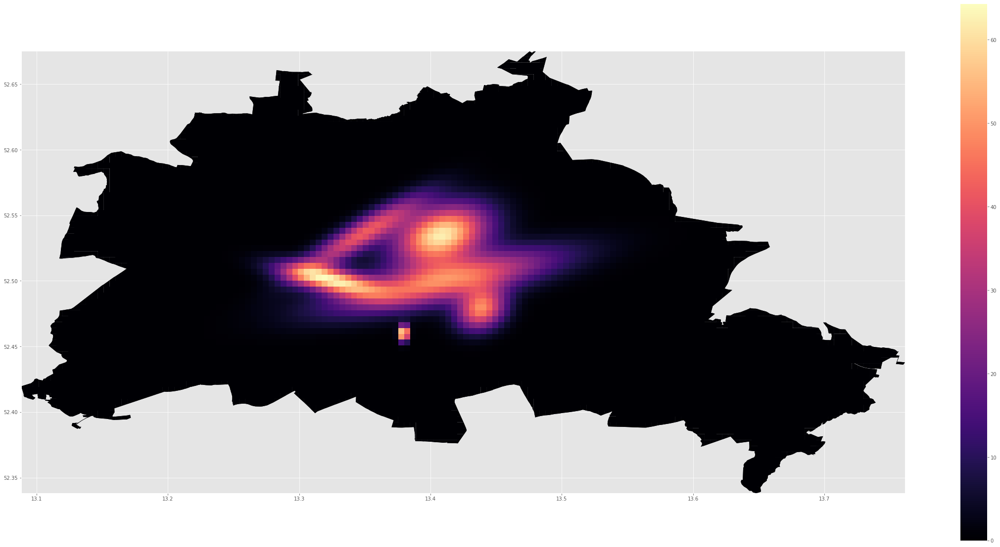

time: 2.99 s


In [20]:
polyair['zpred'] = zpred
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='zpred',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


In [21]:
polyair_proj2 = polyair.to_crs(epsg=3857)
polyframe_proj2 = polyframe.to_crs(epsg=3857)
city2 = city.to_crs(epsg=3857)

time: 1.3 s


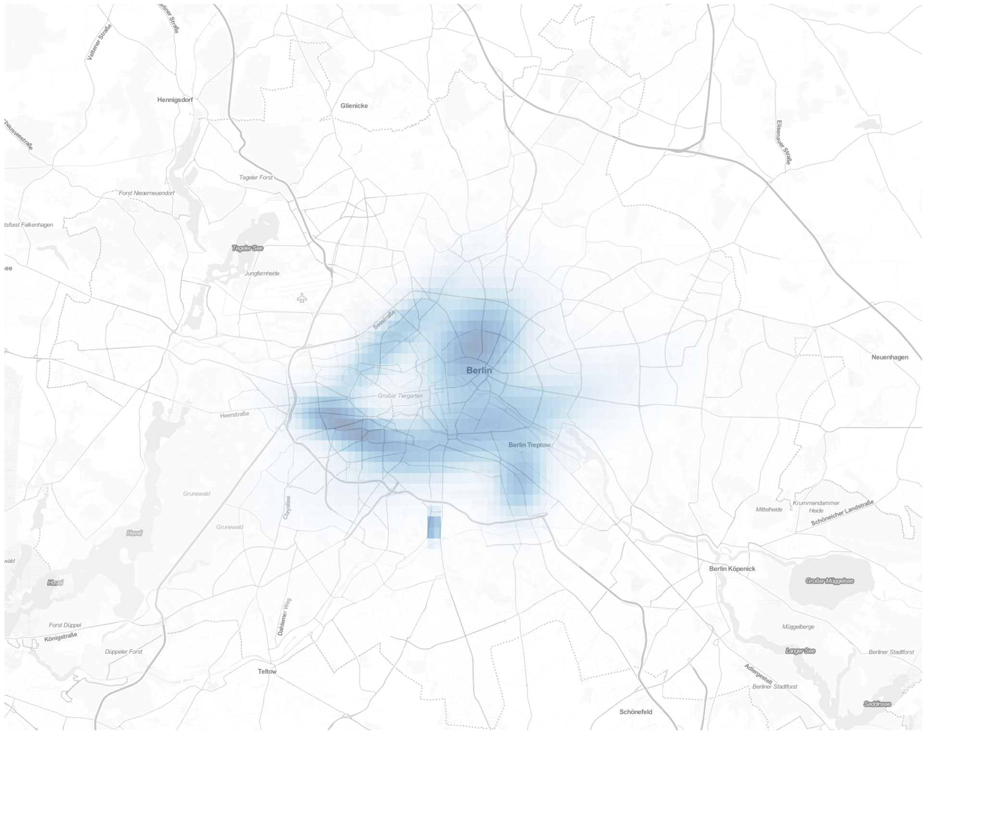

time: 9.33 s


In [23]:
import contextily as ctx
west, south, east, north = city2.unary_union.bounds
style = "dark_all"
cartodb_url = 'https://a.basemaps.cartocdn.com/%s/tileZ/tileX/tileY.png' % style
west, south, east, north = city2.unary_union.bounds
fig, ax = plt.subplots(figsize=(30,25), dpi=90)
#polyframe_proj2.plot(ax=ax, color='white', edgecolor='grey')
polyair_proj2[polyair_proj2.zpred>np.percentile(zpred,50)].plot(column='zpred', cmap='Blues', ax=ax, alpha=0.4) 

ctx.add_basemap(ax, url=ctx.tile_providers.ST_TONER_LITE, attribution="",zoom='auto', alpha=0.5)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
#plt.title('Munich',fontsize= 30, color='grey')
fig.savefig('Berlin_airbnb.jpg', dpi=fig.dpi)
plt.show()

In [16]:
import pickle
pickle_in = open("Prices_params.pickle","rb")
prices_params_dict = pickle.load(pickle_in)
#prices_params_dict = {}
prices_params_dict['Berlin'] = popt
pickle_out = open("Prices_params.pickle","wb")
pickle.dump(prices_params_dict, pickle_out)
pickle_out.close()

#average_slopes = {}
pickle_in_long = open("Average_price_slopes_long.pickle","rb")
average_slopes_long = pickle.load(pickle_in_long)
average_slopes_long['Berlin'] = np.mean(sqrt_eigs_long)
pickle_out_long = open("Average_price_slopes_long.pickle","wb")
pickle.dump(average_slopes_long, pickle_out_long)
pickle_out_long.close()

pickle_in_short = open("Average_price_slopes_short.pickle","rb")
average_slopes_short = pickle.load(pickle_in_short)
average_slopes_short['Berlin'] = np.mean(sqrt_eigs_short)
pickle_out_short = open("Average_price_slopes_short.pickle","wb")
pickle.dump(average_slopes_short, pickle_out_short)
pickle_out_short.close()

print('long: ', average_slopes_long, ' short: ', average_slopes_short)

long:  {'Paris': 0.010453121182320417, 'Amsterdam': 0.017790862401138207, 'Stockholm': 0.01160078748441716, 'Arezzo': 0.012661960610292892, 'Berlin': 0.017168942092868542, 'Bordeaux': 0.0057209390468692745, 'Denver': 0.00873766709683174, 'Edinburgh': 0.012921100209712873, 'Lyon': 0.00594530194011358, 'Madrid': 0.01315080289968449, 'Buenos_Aires': 0.00938788752473718, 'Palermo': 0.02659431146972356, 'Los_Angeles': 0.0056655377791732745, 'Beijing': 0.03548021455387483, 'Florence': 0.011913882705309832, 'Moscow': 0.026524810524746, 'Porto': 0.03745056113103571, 'Prague': 0.01850581507565583, 'Reykjavik': 0.04000475004839031, 'Riga': 0.02150786435094239, 'Rome': 0.009635062558537275, 'Seoul': 0.013154650694260608, 'Siena': 0.013838139160990736, 'Sydney': 0.009200022664460229, 'Tallin': 0.024848430854086192, 'Treviso': 0.015264513943951563, 'Valencia': 0.01982718757582555, 'Venezia': 0.013133572970121148, 'Verona': 0.01119208328282184, 'Vicenza': 0.029546407262138693, 'Vienna': 0.0120270170

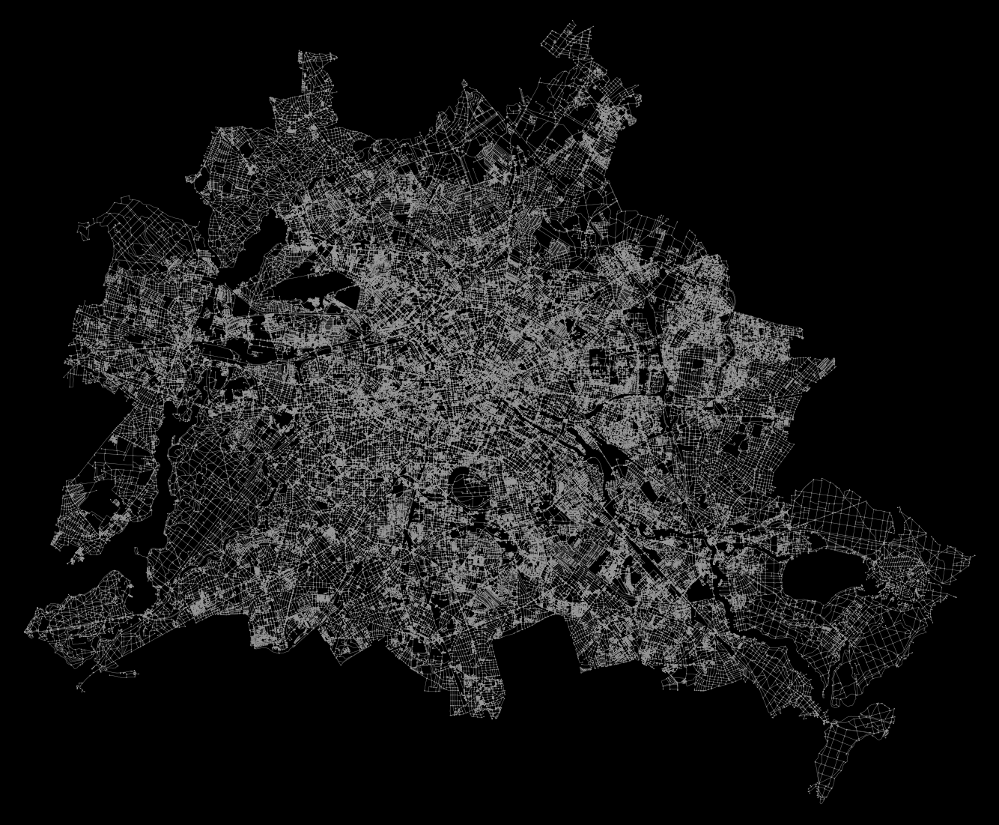

time: 5min 40s


In [17]:
# download and project a street network
G = ox.graph_from_place('Berlin, Germany',which_result=2, network_type="walk")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, fig_height=20, bgcolor='k', node_size=2, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=0.5, edge_alpha=1)

In [18]:
centers = {}
for i in range(0, len(popt), 6):
    lon = popt[i+1]*1000 + (np.array(polyair.center_lon)*500/meter_500).min()
    lon = lon*meter_500/500
    lat = popt[i+2]*1000 + (np.array(polyair.center_lat)*500/meter_500).min()
    lat = lat*meter_500/500
    centers['center_node_{}'.format(i//6+1)] = ox.get_nearest_node(G, (lat,lon))

centers

{'center_node_1': 26726534,
 'center_node_2': 1799364311,
 'center_node_3': 27554996,
 'center_node_4': 4779346227,
 'center_node_5': 26876306,
 'center_node_6': 5887825088}

time: 4.18 s


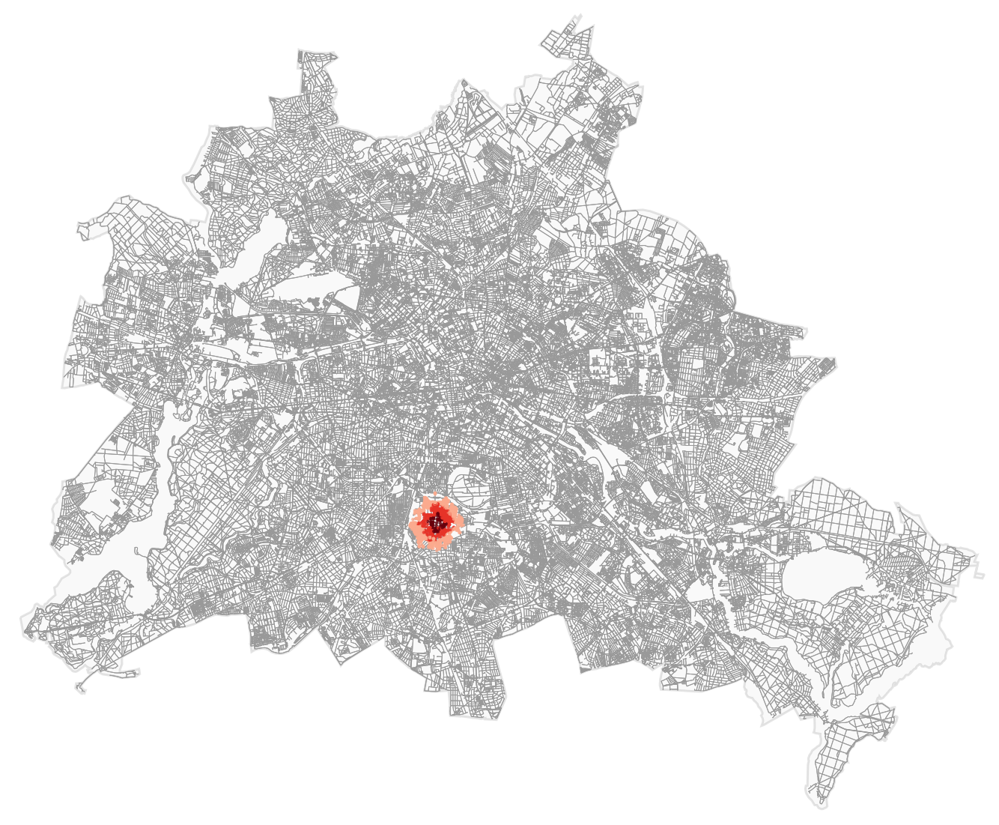

time: 1min 33s


In [19]:
import networkx as nx
#center_node = ox.get_nearest_node(G, (popt[8],popt[7]))
center_node = centers['center_node_5']
# list of distances from center
dists = np.arange(500, 2000, 500)
dists

# get one color for each isochrone
iso_colors = ox.get_colors(n=len(dists), cmap='Reds', start=0.3, return_hex=True)
# color the nodes according to isochrone then plot the street network
node_colors = {}
for dist, color in zip(sorted(dists, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=dist, distance='length')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, fig_height=20,show=False, close=False, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2)
plt.close()
# to this matplotlib axis, add the place shape as descartes polygon patches
for geometry in city['geometry'].tolist():
    if isinstance(geometry, (Polygon, MultiPolygon)):
        if isinstance(geometry, Polygon):
            geometry = MultiPolygon([geometry])
        for polygon in geometry:
            patch = PolygonPatch(polygon, fc='#cccccc', ec='k', linewidth=3, alpha=0.1, zorder=-1)
            ax.add_patch(patch)
            
fig

6230
6230 857
Number of cells with price above 5th percentile:  857



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Yes


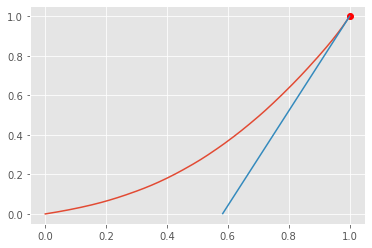

Loubar price:  29.78443193523884
Average price:  27.027499295479974
average city distance:  8495.253652229821
eta =  0.7499866909236614
time: 40.2 s


In [20]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.1*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.1*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))



mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)
    
print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True

  
if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No") 
    
    
L1= L
F1 = np.arange(1, len(L1)+1)/len(L1)

L1 = (L1 - L1.min())/(L1.max()-L1.min())

from scipy import interpolate
tck = interpolate.splrep(F1,L1)
x0_1 =1
y0_1 = interpolate.splev(x0_1,tck)
dydx = interpolate.splev(x0_1,tck,der=1)
tngnt1 = lambda x: dydx*x + (y0_1-dydx*x0_1)
plt.plot(F1, L1)
plt.plot(x0_1,y0_1, "or")
plt.plot(F1[tngnt1(F1)>0],tngnt1(F1[tngnt1(F1)>0]), label="tangent")
plt.show()

indlist = poly_prices.index.tolist()

loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

print('Loubar price: ', loubar_val)
print('Average price: ', np.mean(vals_cut))

if loubar_val > np.mean(vals_cut):
    loubar_keys = keys[vals_cut>loubar_val]
else:
    loubar_keys = keys[vals_cut>np.mean(vals_cut)]
#loubar_keys = keys[vals_cut>loubar_val]
dist_mat = mat[keys.reshape(-1,1), keys]

total_dist = dist_mat.sum()
dist_corr = dist_mat[dist_mat>0]

loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]
loubar_dist = loubar_dist_mat.sum()

loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
eta_loubar = loubar_dist_corr.mean()/dist_corr.mean()

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

avg_dist_meters = (dist_corr.mean()/0.00899928)*1000
print('average city distance: ', avg_dist_meters)
print('eta = ', eta_loubar)

In [21]:
pickle_in = open("City_spreading_index.pickle","rb")
spreading_index_dict = pickle.load(pickle_in)
#spreading_index_dict = {}
spreading_index_dict['Berlin'] = eta_loubar


pickle_out = open("City_spreading_index.pickle","wb")
pickle.dump(spreading_index_dict, pickle_out)
pickle_out.close()

spreading_index_dict

{'Paris': 0.7251609142253275,
 'Amsterdam': 0.6513935879350918,
 'Stockholm': 0.6839327295656318,
 'Arezzo': 0.5574311537992848,
 'Berlin': 0.7499866909236614,
 'Bordeaux': 0.5818334466519048,
 'Denver': 0.6312111392217781,
 'Edinburgh': 0.6813298654934006,
 'Lyon': 0.6138305864151811,
 'Madrid': 0.6426066210787698,
 'Buenos_Aires': 0.8337988194080271,
 'Palermo': 0.8841435007903967,
 'Los_Angeles': 0.7889452782510832,
 'Beijing': 0.6425383574699105,
 'Florence': 0.5049117106731263,
 'Moscow': 0.6925493573699144,
 'Porto': 0.7058843952576399,
 'Prague': 0.5522963433539414,
 'Reykjavik': 0.8276260142343259,
 'Riga': 0.6850021296374689,
 'Rome': 0.5803964773671335,
 'Seoul': 0.8924742030382572,
 'Siena': 0.5646389917673048,
 'Sydney': 0.7909301400958108,
 'Tallin': 0.5690189423395199,
 'Treviso': 0.5345662066021125,
 'Valencia': 0.6956994914059091,
 'Venezia': 0.656650370883064,
 'Verona': 0.5707647012625697,
 'Vicenza': 0.5117751186840898,
 'Vienna': 0.6189242538490607,
 'Wellington': 0

time: 7.99 ms


In [22]:
pickle_in = open("avg_distances_dict.pickle","rb")
avg_distances_dict = pickle.load(pickle_in)
#avg_distances_dict = {}
avg_distances_dict['Berlin'] = avg_dist_meters


pickle_out = open("avg_distances_dict.pickle","wb")
pickle.dump(avg_distances_dict, pickle_out)
pickle_out.close()

avg_distances_dict

{'Venezia': 2398.636425932576,
 'Verona': 3141.8502884813342,
 'Vicenza': 1988.2224372858566,
 'Vienna': 5125.89366602888,
 'Wellington': 2806.4963410749997,
 'Zurich': 2068.4583585914684,
 'Aarhus': 2857.919349359045,
 'Milan': 6008.128043000454,
 'Busan': 7348.804402235624,
 'Valencia': 4090.433301180094,
 'Bologna': 2104.4589605649485,
 'Barcelona': 4218.232625020259,
 'Bremen': 3772.1380465457137,
 'Brno': 2231.9772664038364,
 'Budapest': 3463.3335339061914,
 'Dublin': 4138.1465107736385,
 'Boston': 5610.60832524716,
 'Rio': 8357.334811118957,
 'NY': 8563.096975538809,
 'Ottawa': 2220.3476963993976,
 'Nashville': 5606.900406329212,
 'New_Orleans': 5048.047130029565,
 'Shanghai': 5452.583570486633,
 'Portland': 5406.388840795854,
 'Amsterdam': 7020.480387015727,
 'Arezzo': 1662.0178383704194,
 'Beijing': 6586.560663166117,
 'Berlin': 8495.253652229821}

time: 7 ms


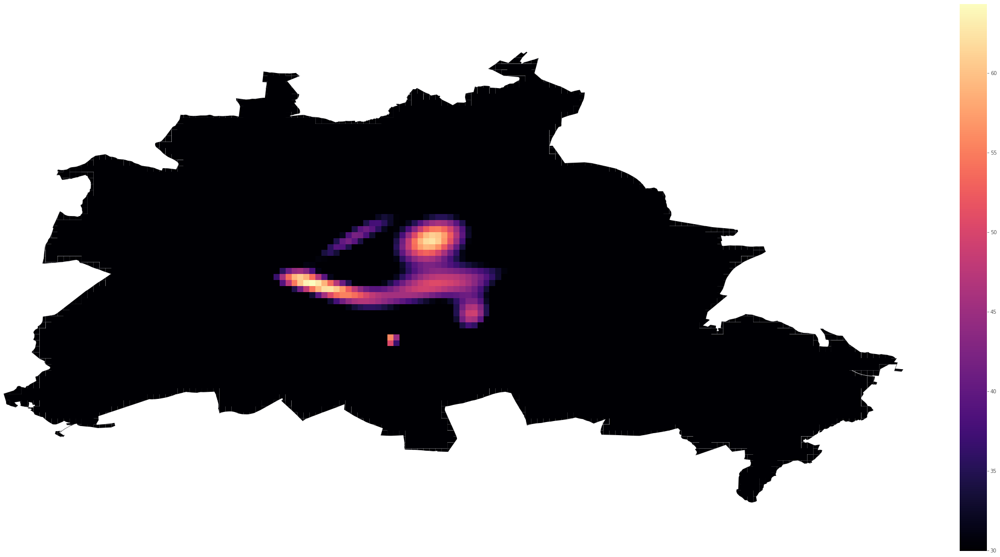

time: 1.93 s


In [23]:
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
poly_prices[poly_prices.index.isin(loubar_keys)].plot(ax=ax, column='zpred', cmap='magma', legend=True)    
ax.set_aspect(aspect=1)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [24]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    
print(len(keys))
vals = np.array(vals)
keys = np.array(keys)
keys = keys[vals>=0.01*vals.max()]
print(len(keys))

indlist = poly_prices.index.tolist()
mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)

print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True


if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No")

6230
1404



[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.00449685 0.0089937 ]
 [0.         0.         0.         ... 0.         0.         0.00449685]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Yes
time: 1min 19s


6230


6230 1404
Number of cells with price above 1.0th percentile:  1404
Loubar price:  16.00490801250772
Average price:  17.497626681165183
eta =  0.6348333147250127
6230 1243
Number of cells with price above 2.0th percentile:  1243
Loubar price:  20.025916667131174
Average price:  19.640072313417622
eta =  0.6559878055480398
6230 1159
Number of cells with price above 3.0th percentile:  1159
Loubar price:  22.191639077781502
Average price:  20.94985256426999
eta =  0.6695502284422796
6230 1084
Number of cells with price above 4.0th percentile:  1084
Loubar price:  23.539672763644955
Average price:  22.244608404437226
eta =  0.6861963270898364
6230 1025
Number of cells with price above 5.0th percentile:  1025
Loubar price:  25.15803283604682
Average price:  23.35939645979384
eta =  0.7003918664071294
6230 988
Number of cells with price above 6.000000000000001th percentile:  988
Loubar price:  26.402373499810412
Average price:  24.102270367226428
eta =  0.7089789684545089
6230 945
Number of c

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning:

Mean of empty slice.

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning:

invalid value encountered in double_scalars



eta =  nan
6230 2
Number of cells with price above 98.0th percentile:  2
Loubar price:  64.37036259369773
Average price:  63.964648838055744
eta =  nan
6230 1
Number of cells with price above 99.0th percentile:  1


C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:37: RuntimeWarning:

invalid value encountered in true_divide



Loubar price:  64.37036259369773
Average price:  64.37036259369773
eta =  nan
6230 1
Number of cells with price above 100.0th percentile:  1
Loubar price:  64.37036259369773
Average price:  64.37036259369773
eta =  nan



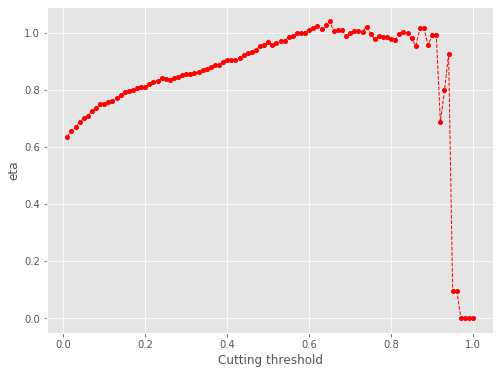

time: 2.14 s


In [25]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_cut = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    
    
        
    L1= L
    F1 = np.arange(1, len(L1)+1)/len(L1)

    L1 = (L1 - L1.min())/(L1.max()-L1.min())
    

    loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

    print('Loubar price: ', loubar_val)
    print('Average price: ', np.mean(vals_cut))
    
    
    loubar_keys = keys[vals_cut>loubar_val]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas_cut.append(eta)
    print('eta = ', eta)
etas_cut = np.array(etas_cut)
etas_cut = np.where(np.isnan(etas_cut), 0, etas_cut)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(perc_vals, etas_cut, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Cutting threshold")
plt.ylabel("eta")
plt.show()

In [26]:
pickle_in = open("etas_cut_dict.pickle","rb")
etas_cut_dict = pickle.load(pickle_in)
#etas_cut_dict = {}
etas_cut_dict['Berlin'] = etas_cut


pickle_out = open("etas_cut_dict.pickle","wb")
pickle.dump(etas_cut_dict, pickle_out)
pickle_out.close()

etas_cut_dict

{'Boston': array([0.54176111, 0.69697859, 0.70601119, 0.71142664, 0.72735905,
        0.71723297, 0.69152614, 0.68969459, 0.69338651, 0.68627389,
        0.68571239, 0.68565242, 0.66080855, 0.68568495, 0.66662135,
        0.65169235, 0.66853925, 0.64080339, 0.6392735 , 0.64870117,
        0.66369008, 0.64936606, 0.65513408, 0.65817401, 0.54708479,
        0.54484174, 0.5177247 , 0.54225619, 0.54660686, 0.55128317,
        0.55836993, 0.56571414, 0.52792612, 0.52759205, 0.55096732,
        0.46941853, 0.48021089, 0.47484233, 0.46129546, 0.46439344,
        0.4699713 , 0.50255475, 0.51573036, 0.52765377, 0.52765377,
        0.53943229, 0.54404083, 0.54813213, 0.6100999 , 0.50092562,
        0.52536404, 0.56707558, 0.56150998, 0.61316219, 0.66467806,
        0.74541769, 0.74541769, 0.77652679, 0.74895419, 0.92876367,
        0.92876367, 0.90963119, 0.90963119, 1.05344906, 1.15130075,
        1.15130075, 1.22651104, 1.26738008, 0.62257449, 0.62257449,
        0.64231201, 0.64231201, 0.6240

time: 20 ms


100
100
100
100
100
100
100
100
100
100
100
100
100
100
100


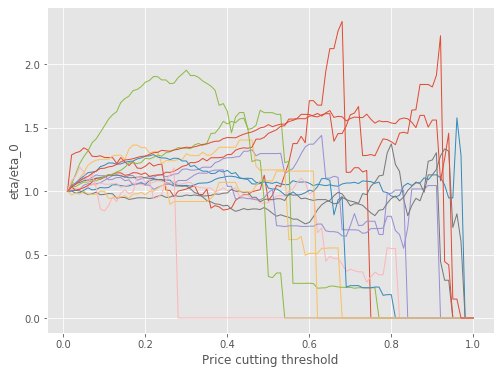

time: 246 ms


In [27]:
fig, ax = plt.subplots(figsize=(8, 6))
for key in etas_cut_dict:
    print(len(etas_cut_dict[key]))
    etas = etas_cut_dict[key]#[1:]
    vals = etas/etas[0]
    plt.plot(np.linspace(0.01, 1, 100), vals, linestyle='-', linewidth=1)
plt.xlabel("Price cutting threshold")
plt.ylabel("eta/eta_0")
plt.show()

6230 857
Number of cells with price above 5th percentile:  857


eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  0.9998558173244609
eta =  0.9839031164184964
eta =  0.9695240268894959
eta =  0.9561060980327385
eta =  0.9429519182303009
eta =  0.9294593126554895
eta =  0.9197154069462067
eta =  0.9122074262766698
eta =  0.9068362411451236
eta =  0.8982349967687184
eta =  0.8891071910259383
eta =  0.8785819055894204
eta =  0.8712089716681571
eta =  0.8619638987599277
eta =  0.854412256521514
eta =  0.8494345662601196
eta =  0.8456152482495488
eta =  0.8400545041077303
eta =  0.8340220366476184
eta =  0.8266764571519042
eta =  0.8215389519521644
eta =  0.8166089508452389
eta =  0.8135805425283528
eta =  0.8064656226777173
eta =  0.8013469584581812
eta =  0.7982896130031767
eta =  0.7940839798148202
eta =  0.785786495161326
eta =  0.7817226091088996
eta =  0.7786177427740258
eta =  0.7750639392989104
eta =  0.7707862970633322
eta =  0.7687230312916684
eta =  0.765499175836275
eta =  0.

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan



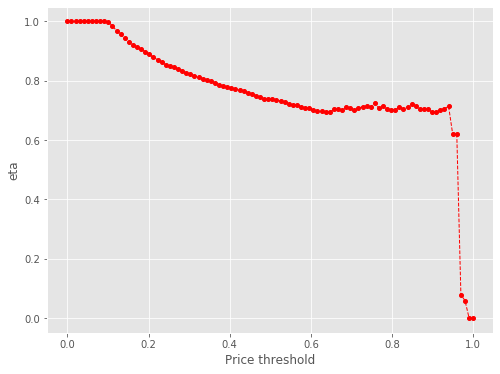

time: 2.57 s


In [28]:
lval = np.linspace(0, max(vals_cut), 100)
etas = []

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)
vals_cut = vals[vals>0.1*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.1*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

for i in tqdm_notebook(lval):
    loubar_keys = keys[vals_cut>=i]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas.append(eta)
    print('eta = ', eta)
etas = np.array(etas)
etas = np.where(np.isnan(etas), 0, etas)
lval = lval/lval.max()
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lval, etas, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Price threshold")
plt.ylabel("eta")
plt.show()

etas_cut_threshold = etas

In [29]:
pickle_in = open("etas_cut_threshold_dict.pickle","rb")
etas_cut_threshold_dict = pickle.load(pickle_in)
#etas_cut_threshold_dict = {}
etas_cut_threshold_dict['Berlin'] = etas_cut_threshold


pickle_out = open("etas_cut_threshold_dict.pickle","wb")
pickle.dump(etas_cut_threshold_dict, pickle_out)
pickle_out.close()

etas_cut_threshold_dict

{'NY': array([1.        , 1.        , 1.        , 1.        , 1.        ,
        0.99991145, 0.98955316, 0.97868522, 0.96344498, 0.95205618,
        0.94615067, 0.93194961, 0.92540239, 0.92150344, 0.91822455,
        0.91569734, 0.91218202, 0.90337978, 0.898264  , 0.89376519,
        0.89441924, 0.88573077, 0.88617046, 0.87902683, 0.87195329,
        0.87101443, 0.87158631, 0.86935351, 0.86321974, 0.86053312,
        0.86079304, 0.86069179, 0.86140605, 0.85888874, 0.8617884 ,
        0.85709178, 0.8579834 , 0.85179248, 0.84947743, 0.84847717,
        0.84228408, 0.82983947, 0.82767187, 0.82334824, 0.81678545,
        0.81788964, 0.81304395, 0.807866  , 0.79902867, 0.79698224,
        0.78820712, 0.76853775, 0.76312442, 0.75071909, 0.7481045 ,
        0.73389742, 0.71700231, 0.70245218, 0.68328343, 0.67990807,
        0.66811743, 0.61552082, 0.58620924, 0.57826542, 0.57372339,
        0.55441141, 0.5326264 , 0.53706259, 0.53126932, 0.52772792,
        0.5331439 , 0.51700595, 0.49034259

time: 21 ms


6230 1404
Number of cells with price above 1.0th percentile:  1404


eta =  1.0
eta =  0.9287503254929002
eta =  0.8915965864851509
eta =  0.8562700023543894
eta =  0.8305262353039705
eta =  0.8119700875548124
eta =  0.7888577657768108
eta =  0.7698718378255054
eta =  0.7562371736390618
eta =  0.7458610753099529
eta =  0.7335827124758193
eta =  0.7250210741362577
eta =  0.7162681669926243
eta =  0.7041898745407281
eta =  0.6941077900564688
eta =  0.6885007907433579
eta =  0.6817668162809963
eta =  0.6767283928083274
eta =  0.6699585205709485
eta =  0.6664643875254941
eta =  0.6557527441812697
eta =  0.6505490639277703
eta =  0.6441912262609788
eta =  0.6380680940364006
eta =  0.6336441108495492
eta =  0.6307811133311495
eta =  0.6284519166013299
eta =  0.6245079166372622
eta =  0.6196367905062422
eta =  0.6143428481672567
eta =  0.609567634439643
eta =  0.608610932569189
eta =  0.6040168970674523
eta =  0.5980973132436299
eta =  0.595433294821399
eta =  0.5924292854648414
eta =  0.5857730242178413
eta =  0.5851784628876241
eta =  0.5818992265586058
eta 

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan


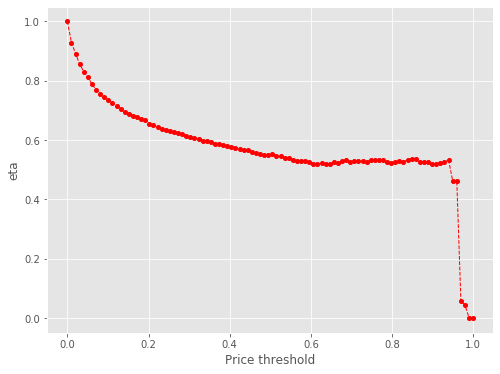

6230 1243
Number of cells with price above 2.0th percentile:  1243


eta =  1.0
eta =  0.9599959881704148
eta =  0.921959302571394
eta =  0.8942405859865504
eta =  0.8742608915091244
eta =  0.8517396190678136
eta =  0.8296566710436876
eta =  0.8151984432126603
eta =  0.8032914408261632
eta =  0.7925085846222375
eta =  0.7825332735908429
eta =  0.7720851294038653
eta =  0.7584126047095961
eta =  0.749102951553565
eta =  0.7433981614171684
eta =  0.7343266739112727
eta =  0.729326484460686
eta =  0.7231150838651275
eta =  0.7191223750513139
eta =  0.7095832497764405
eta =  0.7025560311738986
eta =  0.6971606881520289
eta =  0.6870178954691288
eta =  0.6840153277730371
eta =  0.6793175905942711
eta =  0.6779022976630327
eta =  0.6726766413336892
eta =  0.6671726227147137
eta =  0.6619913080054581
eta =  0.6589293223299166
eta =  0.6560225483198949
eta =  0.6523931270960887
eta =  0.6472373473068805
eta =  0.6429066102053056
eta =  0.640026333954561
eta =  0.6326450871507977
eta =  0.6300731428668889
eta =  0.627645907191653
eta =  0.6251622214233072
eta = 

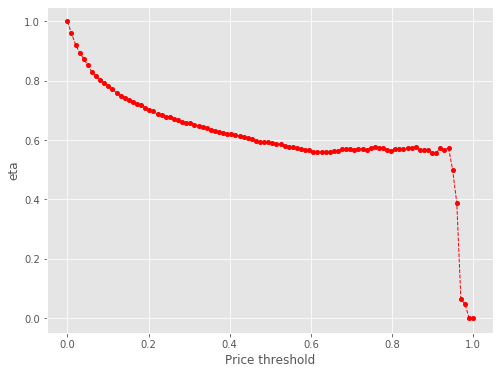

6230 1159
Number of cells with price above 3.0th percentile:  1159


eta =  1.0
eta =  0.960378286922311
eta =  0.9315045031498698
eta =  0.9106922344283058
eta =  0.8872324775972045
eta =  0.8649270274075849
eta =  0.8491685936795285
eta =  0.8376253371749102
eta =  0.82616456578165
eta =  0.8151422331276771
eta =  0.8056476304224854
eta =  0.7904026733817199
eta =  0.7803188354789116
eta =  0.7743763209197946
eta =  0.7654332665239598
eta =  0.7604293202352501
eta =  0.7573450045560813
eta =  0.7499411060668938
eta =  0.7393468777764399
eta =  0.7323595826045471
eta =  0.7268556184420866
eta =  0.7184001189245499
eta =  0.7130211680943153
eta =  0.7071242581299084
eta =  0.7069117400771557
eta =  0.7017080508204148
eta =  0.6949743862849141
eta =  0.6918348573944928
eta =  0.6858167207525367
eta =  0.6827760682018169
eta =  0.6811759161539953
eta =  0.6746451541522707
eta =  0.6703631588454196
eta =  0.6677801382121812
eta =  0.6642873470455495
eta =  0.6561110937256478
eta =  0.6559217106740326
eta =  0.652008688870569
eta =  0.6486526001798694
eta =

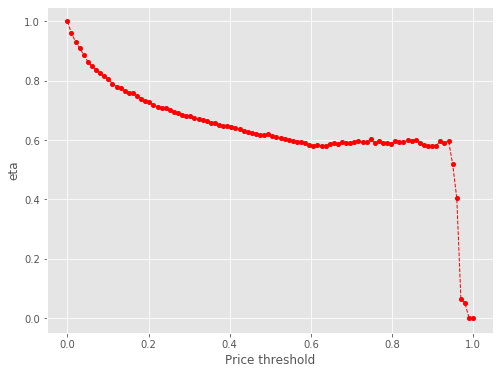

6230 1084
Number of cells with price above 4.0th percentile:  1084


eta =  1.0
eta =  0.9699349889875457
eta =  0.9482640817992333
eta =  0.9249953211037363
eta =  0.902110403970134
eta =  0.8852259878481984
eta =  0.8721827102726544
eta =  0.8620463131138403
eta =  0.8491651098598214
eta =  0.8402056074433962
eta =  0.825112110684765
eta =  0.8139440752384712
eta =  0.8080636579040158
eta =  0.8002782957107211
eta =  0.7916226583025188
eta =  0.7881581723976534
eta =  0.7806334817837841
eta =  0.7707590458537807
eta =  0.7640880182321395
eta =  0.7571253098568935
eta =  0.7497035585994287
eta =  0.7442428704204307
eta =  0.7400801919588552
eta =  0.7365801635275144
eta =  0.7317364313008379
eta =  0.7264818005719792
eta =  0.7209148898778087
eta =  0.7174352221823582
eta =  0.7115149266550644
eta =  0.7098784826248417
eta =  0.7054047151093171
eta =  0.6978629742289508
eta =  0.6953803043248076
eta =  0.691592747561761
eta =  0.684098500014256
eta =  0.683404138038965
eta =  0.6798136110649309
eta =  0.6757388679655395
eta =  0.6723310841105498
eta = 

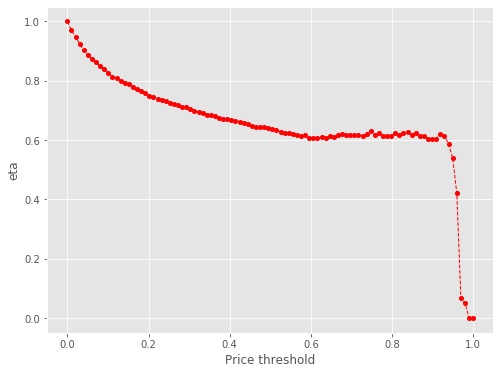

6230 1025
Number of cells with price above 5.0th percentile:  1025


eta =  1.0
eta =  0.9776573611279521
eta =  0.9536673401887283
eta =  0.9300730607850227
eta =  0.912665279527889
eta =  0.8992177003358454
eta =  0.8888102299293358
eta =  0.875486624878036
eta =  0.8660012727410991
eta =  0.851955363309549
eta =  0.8417347626813634
eta =  0.8339387968839682
eta =  0.8249170090922092
eta =  0.8166345477339609
eta =  0.8131455061427384
eta =  0.8043913034020583
eta =  0.7959670701321278
eta =  0.7884588059139522
eta =  0.782396549087055
eta =  0.7740939335554372
eta =  0.7669332101295574
eta =  0.7629429196991436
eta =  0.759411890374616
eta =  0.7566912276664182
eta =  0.7519424313052482
eta =  0.7460773232280336
eta =  0.7397031208079884
eta =  0.7339534966243937
eta =  0.7322505587888251
eta =  0.728845644695686
eta =  0.7222840859396586
eta =  0.7187832305033207
eta =  0.715814069609272
eta =  0.707466309475147
eta =  0.7045901883012557
eta =  0.701875890031559
eta =  0.6990984654690117
eta =  0.6960397176104107
eta =  0.6922520429887744
eta =  0.6

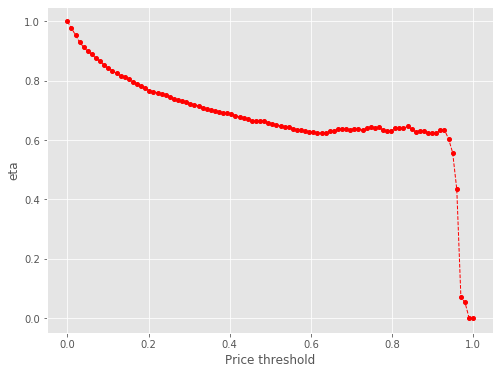

6230 988
Number of cells with price above 6.000000000000001th percentile:  988


eta =  1.0
eta =  0.9718476423247677
eta =  0.9497467911874198
eta =  0.9335226387237756
eta =  0.9197677387693286
eta =  0.9091224239378604
eta =  0.8954943313350203
eta =  0.8873891281172431
eta =  0.873468028626744
eta =  0.8613046158230412
eta =  0.852997000832509
eta =  0.8437690359539443
eta =  0.8352972935137374
eta =  0.8317285160156607
eta =  0.8239130391407036
eta =  0.8167178270833183
eta =  0.8070494897468208
eta =  0.8011791446508325
eta =  0.7915626599363371
eta =  0.7843080609844051
eta =  0.7803786377866719
eta =  0.7767236033916481
eta =  0.773984074331933
eta =  0.7691267525850878
eta =  0.7631276077819965
eta =  0.7572010991624565
eta =  0.753698728525408
eta =  0.7503738926117207
eta =  0.748201645261648
eta =  0.7403251747766478
eta =  0.7352102094760862
eta =  0.7332944381687238
eta =  0.7294312193872621
eta =  0.7210561142697077
eta =  0.720245200164458
eta =  0.7159484447343207
eta =  0.7126062042584116
eta =  0.7089789684545089
eta =  0.7061781332033801
eta =  

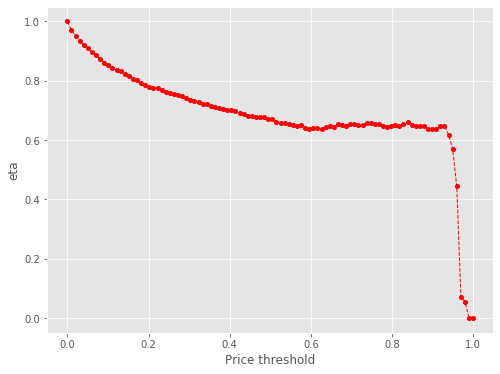

6230 945
Number of cells with price above 6.999999999999999th percentile:  945


eta =  1.0
eta =  0.9763964307844889
eta =  0.9597621425828395
eta =  0.9467155218320056
eta =  0.9357583156146793
eta =  0.9217309408153244
eta =  0.9133882675833414
eta =  0.8989246054519853
eta =  0.8868161320394802
eta =  0.8779885037550891
eta =  0.8684901736689011
eta =  0.86096955132357
eta =  0.8574091341859239
eta =  0.8492767006118285
eta =  0.8409565454964867
eta =  0.8304040776623226
eta =  0.8250756173083293
eta =  0.8166126445197953
eta =  0.8088506213893664
eta =  0.8047500351345014
eta =  0.7997847783829579
eta =  0.7981185036404368
eta =  0.7932626351483246
eta =  0.7854860754220606
eta =  0.7809441772012362
eta =  0.7751357389190027
eta =  0.7716990795457637
eta =  0.7692363371791124
eta =  0.7625092160163849
eta =  0.7574992051927528
eta =  0.7548043774850322
eta =  0.7511529192674811
eta =  0.7425584809208461
eta =  0.7416401385698776
eta =  0.7379074246342746
eta =  0.7334844723167887
eta =  0.7297854745809144
eta =  0.7274125610700987
eta =  0.7234147819999746
eta

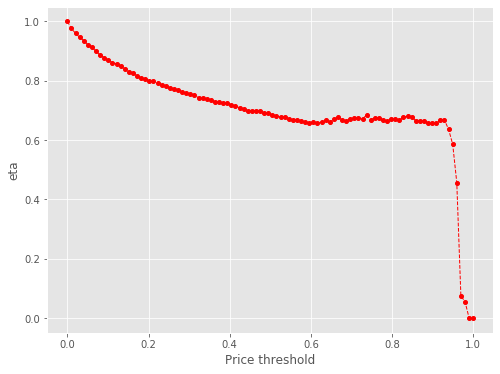

6230 905
Number of cells with price above 8.0th percentile:  905


eta =  1.0
eta =  0.9834309845824847
eta =  0.9700626191081615
eta =  0.9588351955409223
eta =  0.9444618894914534
eta =  0.9359134763101419
eta =  0.9214781488852299
eta =  0.9086860412395789
eta =  0.8996407134546297
eta =  0.8902568177404753
eta =  0.882202054016313
eta =  0.8785538328833384
eta =  0.8702208441124941
eta =  0.8632748569575878
eta =  0.850882800502085
eta =  0.8465535106465356
eta =  0.8379031740873243
eta =  0.8287978111247932
eta =  0.825175603390924
eta =  0.8195083939678824
eta =  0.8186818421352957
eta =  0.8126553954587369
eta =  0.8048570684912953
eta =  0.8008940721955505
eta =  0.7959167955055609
eta =  0.7913640400757249
eta =  0.789543947607387
eta =  0.7845681156145307
eta =  0.776749068588438
eta =  0.7754126090852727
eta =  0.7695203586608711
eta =  0.7614951888867184
eta =  0.7608985082428446
eta =  0.7571732228119987
eta =  0.7541769786939017
eta =  0.7508772472075245
eta =  0.7467470143935011
eta =  0.7447480977537523
eta =  0.7416247879007835
eta = 

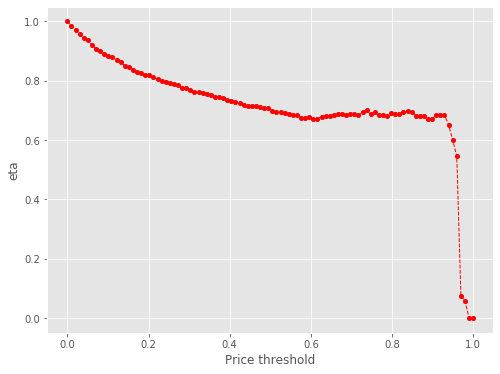

6230 881
Number of cells with price above 9.0th percentile:  881


eta =  1.0
eta =  0.9865386325071601
eta =  0.9740403307355456
eta =  0.9614901726134573
eta =  0.9510730256185349
eta =  0.9377000768770803
eta =  0.9250692996340198
eta =  0.9158608880823594
eta =  0.9063078043524831
eta =  0.8981078163490758
eta =  0.8943938191979949
eta =  0.8859105898577625
eta =  0.8788393692369519
eta =  0.8693697598657811
eta =  0.8618165435095952
eta =  0.8561972865289024
eta =  0.8437407155826208
eta =  0.840507452488446
eta =  0.8336929163844341
eta =  0.8334423595789692
eta =  0.8285283738931994
eta =  0.8224805133225914
eta =  0.816275390804328
eta =  0.8123354429022193
eta =  0.8060535182452939
eta =  0.8047884364643357
eta =  0.800443895787268
eta =  0.7932377614139132
eta =  0.7895874999939891
eta =  0.7860294186860936
eta =  0.7769643586619343
eta =  0.7738057013331291
eta =  0.7709968329358377
eta =  0.7687121734022503
eta =  0.7655890384139662
eta =  0.761664217167282
eta =  0.7582218127247387
eta =  0.7547485561934826
eta =  0.7513028069843068
eta =

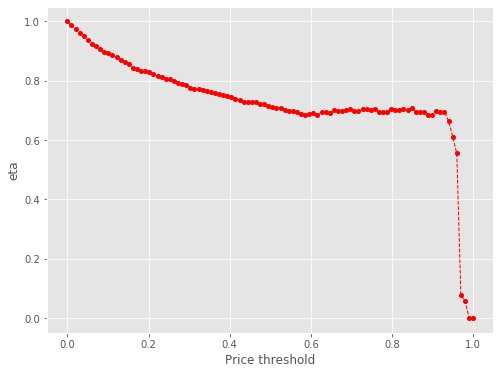

6230 857
Number of cells with price above 10.0th percentile:  857


eta =  1.0
eta =  0.9856662575731953
eta =  0.9744147490931837
eta =  0.9645802432641408
eta =  0.948663637182655
eta =  0.9376459068206136
eta =  0.9286019506543384
eta =  0.9189159685343882
eta =  0.9106019058264047
eta =  0.9068362411451236
eta =  0.8982349967687184
eta =  0.8935502998980549
eta =  0.8814640578675537
eta =  0.8743583235336453
eta =  0.8688387360300153
eta =  0.8587699706644122
eta =  0.8523400142585015
eta =  0.8467186252716249
eta =  0.8448318076996912
eta =  0.8400545041077303
eta =  0.8340220366476184
eta =  0.8306340716625727
eta =  0.8236692709992379
eta =  0.8172669879391798
eta =  0.8153707439919492
eta =  0.8119197692762474
eta =  0.8059435153290738
eta =  0.8003751877136247
eta =  0.7973050286759418
eta =  0.7940839798148202
eta =  0.7843101495512784
eta =  0.7849722660887363
eta =  0.7798956659628653
eta =  0.7757676881359621
eta =  0.7718554540938214
eta =  0.7693457491199484
eta =  0.7651175098811372
eta =  0.7652112653594849
eta =  0.760632351323241
eta

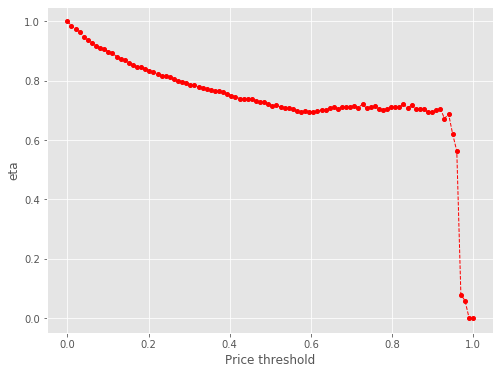

6230 827
Number of cells with price above 11.0th percentile:  827


eta =  1.0
eta =  0.9907240454231347
eta =  0.9791843032536237
eta =  0.9631071410805193
eta =  0.9529706625921576
eta =  0.9441444538850072
eta =  0.9342963523464133
eta =  0.9258431327624316
eta =  0.9220144401546713
eta =  0.9132692321904082
eta =  0.9085061250642033
eta =  0.8962175891922199
eta =  0.8894690830807528
eta =  0.8840116742161128
eta =  0.8731436590182303
eta =  0.8666060810225291
eta =  0.8625637781145515
eta =  0.8597687590391399
eta =  0.8537336814225627
eta =  0.8513122051766556
eta =  0.8446720185307897
eta =  0.838112229646914
eta =  0.8332104848495102
eta =  0.8305554982702344
eta =  0.8281511342618781
eta =  0.8197127715359617
eta =  0.8147595274086842
eta =  0.8116201235756201
eta =  0.8077518779719148
eta =  0.7985098534299904
eta =  0.7976993635968664
eta =  0.7946293317507112
eta =  0.7887521232759115
eta =  0.784856499848923
eta =  0.7837336858778557
eta =  0.7820667663193333
eta =  0.7783117414410812
eta =  0.7731547960342166
eta =  0.7679824194218392
eta

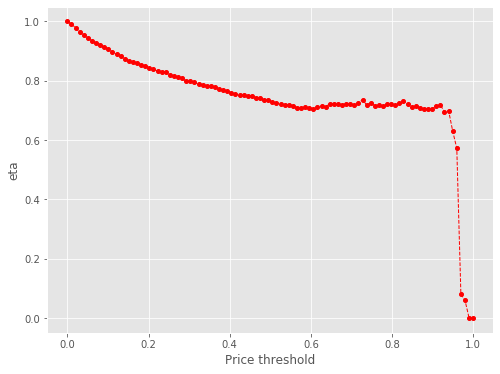

6230 803
Number of cells with price above 12.0th percentile:  803


eta =  1.0
eta =  0.9890392718533635
eta =  0.9722981523965245
eta =  0.9612905335904813
eta =  0.9552936792562785
eta =  0.9449590397296587
eta =  0.9367762412535496
eta =  0.9329023363304645
eta =  0.9240538578400537
eta =  0.9192345040721414
eta =  0.9068008551770863
eta =  0.8999726572184166
eta =  0.8938526222049146
eta =  0.8842253704442049
eta =  0.8789714770240914
eta =  0.8740552382784244
eta =  0.8699216076019437
eta =  0.8649178818518629
eta =  0.8613651918756426
eta =  0.8546465925068959
eta =  0.8480093403022821
eta =  0.844086943706843
eta =  0.8403633728973211
eta =  0.8376778873115316
eta =  0.8296466654400548
eta =  0.8241955329339322
eta =  0.8212634309020036
eta =  0.8167902212890625
eta =  0.8086022896119568
eta =  0.8077857862671034
eta =  0.8040129609928847
eta =  0.8008313652461385
eta =  0.797342372272629
eta =  0.7944580032225973
eta =  0.7903187983120136
eta =  0.7871273135253821
eta =  0.783650477991661
eta =  0.782221231394585
eta =  0.7743312689976147
eta =

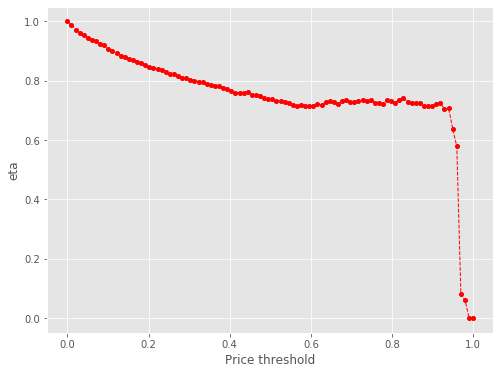

6230 782
Number of cells with price above 13.0th percentile:  782


eta =  1.0
eta =  0.9833969816631665
eta =  0.9713256042135819
eta =  0.9660078475372103
eta =  0.956506584504709
eta =  0.9469029168172305
eta =  0.9443025463359767
eta =  0.9353459380777525
eta =  0.927880131075729
eta =  0.917882101069191
eta =  0.9109704614814712
eta =  0.9053811291859688
eta =  0.895030740441365
eta =  0.8897126436357488
eta =  0.8844002840020506
eta =  0.8805521834176332
eta =  0.8773975245053733
eta =  0.8718912069754078
eta =  0.8650905052892331
eta =  0.8583721448420463
eta =  0.8544018159570507
eta =  0.8506327425396503
eta =  0.8471939509042857
eta =  0.8397850752693118
eta =  0.8342673290857252
eta =  0.8312993963160872
eta =  0.8283613076566665
eta =  0.8203203181286122
eta =  0.8169854022396941
eta =  0.8140197941116512
eta =  0.8107866489714086
eta =  0.8083102352714032
eta =  0.8037069656572579
eta =  0.8009640672389278
eta =  0.7967286485095113
eta =  0.795529615960651
eta =  0.7916483493096533
eta =  0.7870906066657681
eta =  0.7809726936618637
eta = 

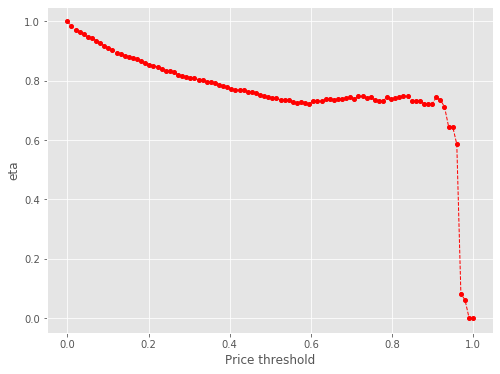

6230 756
Number of cells with price above 14.000000000000002th percentile:  756


eta =  1.0
eta =  0.9857228030040573
eta =  0.9804618176842107
eta =  0.9731101268664335
eta =  0.9631442329258031
eta =  0.9590292339996017
eta =  0.9513890284319902
eta =  0.9420685039363977
eta =  0.9318124048917089
eta =  0.9255141697175702
eta =  0.9205672044428906
eta =  0.909588616538123
eta =  0.9027781604771967
eta =  0.8999113600211163
eta =  0.8956554491347247
eta =  0.8924466813886036
eta =  0.8868459192835818
eta =  0.879928571694344
eta =  0.8744663026433829
eta =  0.869056549541925
eta =  0.8644839037759889
eta =  0.8617250549040033
eta =  0.8572802153219818
eta =  0.84919885187705
eta =  0.8477377366706544
eta =  0.8442358885065433
eta =  0.8343904845209533
eta =  0.8309983680234138
eta =  0.8288585157133126
eta =  0.8255283729190229
eta =  0.8216745837778155
eta =  0.8175308390364724
eta =  0.8148726195445427
eta =  0.8103941696557478
eta =  0.8104934732163709
eta =  0.8042497248636039
eta =  0.8000379538837449
eta =  0.795838242183357
eta =  0.7915271972662227
eta =  

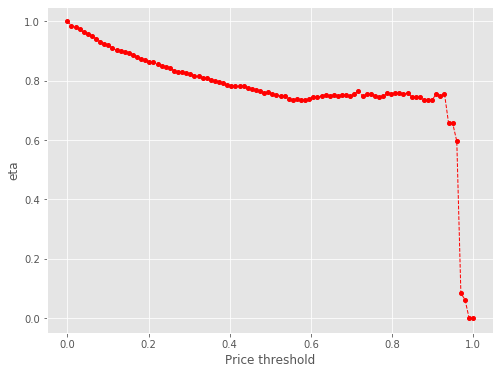

6230 735
Number of cells with price above 15.000000000000002th percentile:  735


eta =  1.0
eta =  0.9942759547456056
eta =  0.9829517659105432
eta =  0.9765669614993662
eta =  0.9729593668962111
eta =  0.9638167905797499
eta =  0.9557522781033377
eta =  0.9437593336092079
eta =  0.9389574881533314
eta =  0.9336201137773819
eta =  0.9228006124402461
eta =  0.9158912328484704
eta =  0.9129827914184493
eta =  0.9086650623912318
eta =  0.9054096865131026
eta =  0.8997275719761849
eta =  0.8927097482306486
eta =  0.8875478530117897
eta =  0.8809465272355691
eta =  0.8770407427540426
eta =  0.875725152053188
eta =  0.8702061923527941
eta =  0.8616778572604291
eta =  0.8600513334981917
eta =  0.8558971853202547
eta =  0.8522885954082755
eta =  0.8427200447920078
eta =  0.8435004863233185
eta =  0.8383412992833082
eta =  0.833609606970024
eta =  0.8294056733283948
eta =  0.8267088425517637
eta =  0.8265440440123215
eta =  0.8225754653923087
eta =  0.817652786762797
eta =  0.8124926771845665
eta =  0.8073137625780464
eta =  0.8030243223363472
eta =  0.800287732242977
eta =

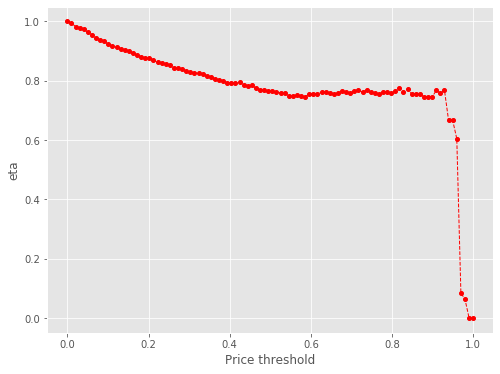

6230 721
Number of cells with price above 16.0th percentile:  721


eta =  1.0
eta =  0.9905669631502783
eta =  0.9847427850488834
eta =  0.9802112201003025
eta =  0.970322895641802
eta =  0.9631803688248931
eta =  0.9514451024658792
eta =  0.9466041518346205
eta =  0.9404320586806785
eta =  0.9303156980721804
eta =  0.9233500500096259
eta =  0.920417922871005
eta =  0.9160650312063362
eta =  0.9127831442616142
eta =  0.9070547558311384
eta =  0.8999797804694387
eta =  0.8947758479089593
eta =  0.8881207623846156
eta =  0.884892067101802
eta =  0.882856865468847
eta =  0.8773918999777299
eta =  0.8712784223061857
eta =  0.8672462421503399
eta =  0.8636611368620124
eta =  0.8602405967197541
eta =  0.8497940703426573
eta =  0.8503494326517024
eta =  0.845465989543208
eta =  0.8403983406309354
eta =  0.8362476380627234
eta =  0.8350019405803855
eta =  0.8327667802903852
eta =  0.8288790630407347
eta =  0.8252178050332719
eta =  0.8235756874738672
eta =  0.8188341301466271
eta =  0.8124694804729561
eta =  0.8062939950999313
eta =  0.8018438968917772
eta = 

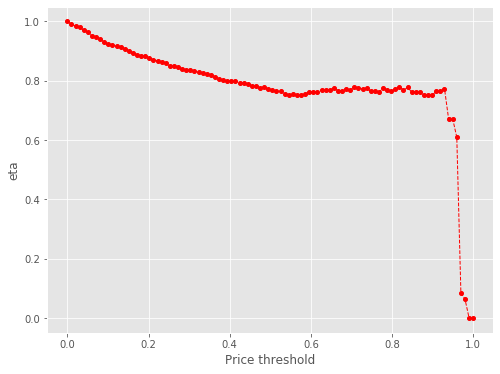

6230 703
Number of cells with price above 17.0th percentile:  703


eta =  1.0
eta =  0.9935394238288561
eta =  0.9901379215540379
eta =  0.9804423115386938
eta =  0.9674838581466101
eta =  0.9611791439563183
eta =  0.9546773068498992
eta =  0.9460351566177595
eta =  0.9359037119422003
eta =  0.9324702000493461
eta =  0.9281206725260517
eta =  0.9251132253669968
eta =  0.9197920414498969
eta =  0.9160139533395324
eta =  0.9088690967482543
eta =  0.9036137636969777
eta =  0.8968929442957488
eta =  0.8936323584147688
eta =  0.8915770546068549
eta =  0.8860581103400391
eta =  0.8798842483823529
eta =  0.8750831153283107
eta =  0.8722612656365611
eta =  0.8693891719187953
eta =  0.8591984975349836
eta =  0.8583264085508636
eta =  0.8550230469977523
eta =  0.8516395969519488
eta =  0.8479134397335534
eta =  0.8448618810675451
eta =  0.840460066959443
eta =  0.837190812626284
eta =  0.8333686793384972
eta =  0.8317103421898648
eta =  0.8269219513629721
eta =  0.8204944365170151
eta =  0.8183911165577248
eta =  0.8097639014967596
eta =  0.8091487318345431
eta

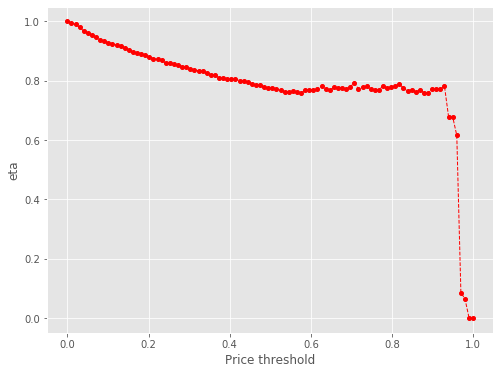

6230 691
Number of cells with price above 18.000000000000004th percentile:  691


eta =  1.0
eta =  0.9901652801428621
eta =  0.9880550858215936
eta =  0.9752477611720543
eta =  0.9676492529750418
eta =  0.960209246920331
eta =  0.9516302183572956
eta =  0.9428717648279956
eta =  0.9392586258346347
eta =  0.9329496322136692
eta =  0.9320009402007466
eta =  0.9254588346011893
eta =  0.9228339216648535
eta =  0.9156358697096141
eta =  0.91034140930136
eta =  0.9035705516062061
eta =  0.900253292402135
eta =  0.8982150837000078
eta =  0.8926550494203688
eta =  0.8882764538485749
eta =  0.8815983426420482
eta =  0.879840650238473
eta =  0.8758620063043928
eta =  0.8655954596303634
eta =  0.8647168777110357
eta =  0.8613889217496435
eta =  0.8579802810153592
eta =  0.8542423065780665
eta =  0.8511521032275301
eta =  0.847305250880537
eta =  0.8432797777114285
eta =  0.8422876523092656
eta =  0.8383364278823404
eta =  0.8330786059589504
eta =  0.8281331740672837
eta =  0.8236471879440503
eta =  0.8175324509340731
eta =  0.8161874822038699
eta =  0.8133086329205353
eta =  

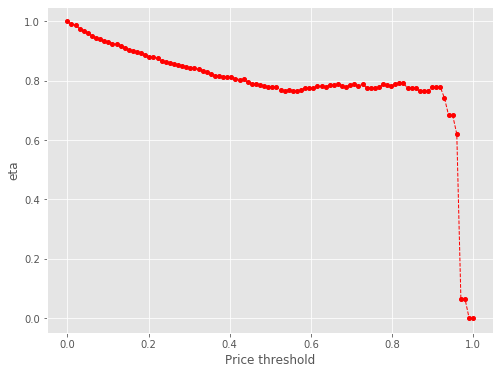

6230 675
Number of cells with price above 19.0th percentile:  675


eta =  1.0
eta =  0.9920181328660425
eta =  0.9813290074852393
eta =  0.9746413902959756
eta =  0.9674504192519225
eta =  0.9590398149825264
eta =  0.9507426686590464
eta =  0.9457960327298298
eta =  0.9417246202642602
eta =  0.9407748017921116
eta =  0.933278356044727
eta =  0.9285120705025994
eta =  0.9248882900663442
eta =  0.9177055353510205
eta =  0.9134607648085246
eta =  0.9094311611464332
eta =  0.9057546693850731
eta =  0.9010827218965183
eta =  0.8927378261178358
eta =  0.8910526728144361
eta =  0.8875644646732002
eta =  0.8840492551185739
eta =  0.8733136029098029
eta =  0.8732609031138988
eta =  0.8700931814431675
eta =  0.8666500966924766
eta =  0.8628743503505212
eta =  0.8597529207654817
eta =  0.8558671963120738
eta =  0.8519466465737375
eta =  0.8505191326276129
eta =  0.8468077441421401
eta =  0.841496792388208
eta =  0.8365013873399394
eta =  0.8319700707193984
eta =  0.8274556698875581
eta =  0.8240388173522044
eta =  0.821222333519572
eta =  0.8225943158837594
eta 

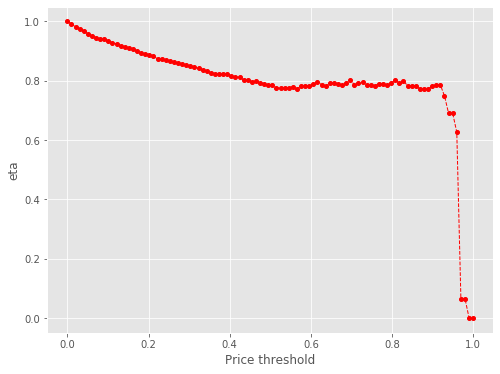

6230 662
Number of cells with price above 20.0th percentile:  662


eta =  1.0
eta =  0.988838543408247
eta =  0.9797512307511349
eta =  0.9727506870409195
eta =  0.9646506736758628
eta =  0.9555419567307215
eta =  0.952538990240838
eta =  0.9466618849958396
eta =  0.945707086824591
eta =  0.9401311870227922
eta =  0.9370461923044208
eta =  0.9297372854487883
eta =  0.9225168730565084
eta =  0.917486153232773
eta =  0.9134183658375981
eta =  0.9120482074749293
eta =  0.9064025448822295
eta =  0.9019565159577742
eta =  0.8957248269123065
eta =  0.893390795229159
eta =  0.889098989745206
eta =  0.8789262189878582
eta =  0.8787592096343987
eta =  0.8746548975600527
eta =  0.8713753919201396
eta =  0.8677679632401453
eta =  0.8637666556016952
eta =  0.8609988147368123
eta =  0.8594451446083909
eta =  0.8566939946454171
eta =  0.8504347595199446
eta =  0.8461929956851153
eta =  0.8407992716696887
eta =  0.8397007793669047
eta =  0.8329538135699538
eta =  0.8267788416431612
eta =  0.8258984682763795
eta =  0.8255819586170283
eta =  0.8255605721916344
eta =  

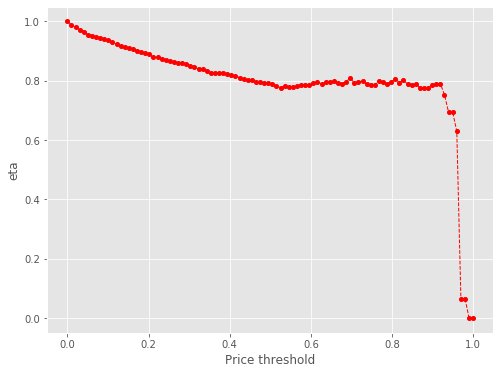

6230 644
Number of cells with price above 21.000000000000004th percentile:  644


eta =  1.0
eta =  0.9950383714282836
eta =  0.9882718662194023
eta =  0.9789492664472526
eta =  0.9713389038634596
eta =  0.9662851074160216
eta =  0.9621254946713235
eta =  0.9611550999851279
eta =  0.9554881185210258
eta =  0.9486267173198933
eta =  0.9449244337968885
eta =  0.9375860768240779
eta =  0.9332493504923196
eta =  0.9283389465682705
eta =  0.926946406831164
eta =  0.9211046426067017
eta =  0.9166898687293307
eta =  0.909798143907911
eta =  0.9079842279679816
eta =  0.9036223163501926
eta =  0.893283374588389
eta =  0.8931136371569378
eta =  0.8889422816313766
eta =  0.8865059681625388
eta =  0.8823675191572792
eta =  0.8779176970018592
eta =  0.8750631283139907
eta =  0.8734840791681914
eta =  0.8706879894966897
eta =  0.8661159734056233
eta =  0.8648486528347905
eta =  0.8597264000739888
eta =  0.8530439021782339
eta =  0.8490519681592812
eta =  0.8418876809307189
eta =  0.840338066394577
eta =  0.8395135834793687
eta =  0.8393073305536235
eta =  0.8388046663112422
eta =

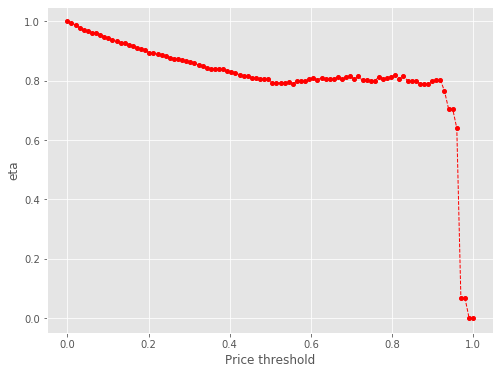

6230 634
Number of cells with price above 22.0th percentile:  634


eta =  1.0
eta =  0.9943946648015755
eta =  0.9845884488656673
eta =  0.9795922855680188
eta =  0.9740143303317425
eta =  0.9694523706544432
eta =  0.9678009154384555
eta =  0.9617114795973247
eta =  0.9561005821958113
eta =  0.9516356739706099
eta =  0.9450857389163857
eta =  0.9407143235220667
eta =  0.9365644946196279
eta =  0.9327783128880597
eta =  0.9284724712700771
eta =  0.9221070569122173
eta =  0.9170755329606907
eta =  0.9152471076792196
eta =  0.9108503055441559
eta =  0.9004286635679163
eta =  0.9002575684228517
eta =  0.896052846620122
eta =  0.8935970453109473
eta =  0.8894254932446537
eta =  0.8849400773839075
eta =  0.8820626752718793
eta =  0.880470995461746
eta =  0.8776525401341894
eta =  0.8732532843711978
eta =  0.8716214402634497
eta =  0.8666032699974753
eta =  0.859867319434931
eta =  0.8576630679314274
eta =  0.8486218606318982
eta =  0.8486375527442472
eta =  0.8460228971862899
eta =  0.8471806909408999
eta =  0.8470829965234031
eta =  0.8399402897465472
eta 

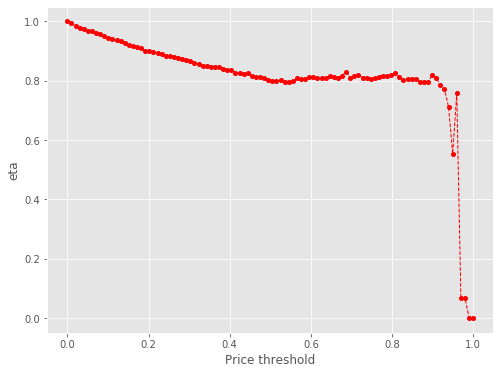

6230 609
Number of cells with price above 23.0th percentile:  609


eta =  1.0
eta =  0.9904948531197514
eta =  0.9868610649270109
eta =  0.9837272565620352
eta =  0.9790749588731337
eta =  0.9755673330867869
eta =  0.9714062603265204
eta =  0.9618833123554699
eta =  0.958252409049269
eta =  0.9536653452004177
eta =  0.948831313780687
eta =  0.9458079067906282
eta =  0.9419843573833684
eta =  0.9371255345679995
eta =  0.9284468475535012
eta =  0.9268982549722182
eta =  0.9242801281526584
eta =  0.9205543946535618
eta =  0.9093154335829611
eta =  0.9091426498163915
eta =  0.9048964295617022
eta =  0.9024163907506351
eta =  0.8982036676007022
eta =  0.8936739829813202
eta =  0.8907681823832764
eta =  0.8905906140691584
eta =  0.8858920566902605
eta =  0.8819789654675118
eta =  0.8802238977297752
eta =  0.8751562006918816
eta =  0.8683537697451558
eta =  0.8652484154024539
eta =  0.8588248318755167
eta =  0.8574119307212265
eta =  0.8540707746331524
eta =  0.8554976355363899
eta =  0.8569920728144547
eta =  0.8477375996923305
eta =  0.8465382568619374
eta

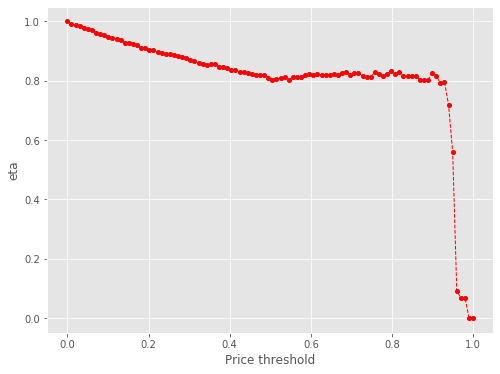

6230 596
Number of cells with price above 24.000000000000004th percentile:  596


eta =  1.0
eta =  0.9956295640682816
eta =  0.9880913662069176
eta =  0.9884705163175269
eta =  0.9827849058757676
eta =  0.9787480716778092
eta =  0.9711138925415271
eta =  0.9663322724134932
eta =  0.9627785265065518
eta =  0.9553332005421795
eta =  0.9548842215702856
eta =  0.9521199400029821
eta =  0.9427070905955655
eta =  0.9373565593290886
eta =  0.9355871826361732
eta =  0.9319246350372761
eta =  0.9289301461521365
eta =  0.9180415533901056
eta =  0.916680453157027
eta =  0.9135801430078706
eta =  0.9101546877341793
eta =  0.9068231548822687
eta =  0.9022500017708567
eta =  0.8993163160592234
eta =  0.8991370437353352
eta =  0.8943933973003246
eta =  0.8904427546388068
eta =  0.8886708446362372
eta =  0.8835545161445424
eta =  0.8766868066099596
eta =  0.8735516521637543
eta =  0.8688116231122602
eta =  0.864278654237492
eta =  0.8632616940239342
eta =  0.8637132293045882
eta =  0.8637121676620895
eta =  0.8568170467150695
eta =  0.8546619441742728
eta =  0.8537826133205504
eta

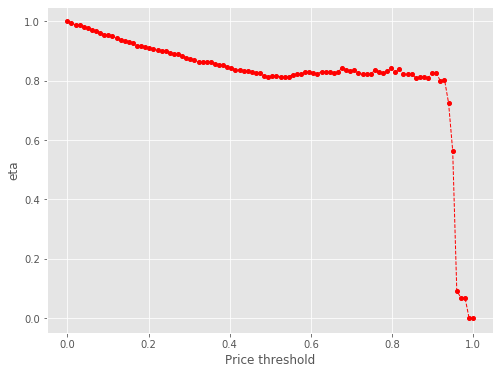

6230 583
Number of cells with price above 25.0th percentile:  583


eta =  1.0
eta =  0.9954816947409783
eta =  0.9936208177849183
eta =  0.9873689222516598
eta =  0.9817254866492259
eta =  0.9778940258364797
eta =  0.9702996244362198
eta =  0.9650083330808199
eta =  0.9615001188999825
eta =  0.958845184427319
eta =  0.9557089568241532
eta =  0.9486743215785294
eta =  0.9432637246965497
eta =  0.9396967234858071
eta =  0.938227554286163
eta =  0.928936619103505
eta =  0.9232097347776411
eta =  0.923967013603121
eta =  0.9199585865589192
eta =  0.9163181771772545
eta =  0.9137098896145084
eta =  0.9085063764243106
eta =  0.9055951722717005
eta =  0.9039610281317563
eta =  0.9010673794042302
eta =  0.8963358399693603
eta =  0.8948753761832041
eta =  0.889723326454875
eta =  0.8828076678728806
eta =  0.8805446092762449
eta =  0.8731201191904231
eta =  0.8712648275482819
eta =  0.8682869298460646
eta =  0.8703952979535089
eta =  0.8703191528991865
eta =  0.8627991810772009
eta =  0.8606290320185824
eta =  0.859743561843361
eta =  0.8526111337944181
eta =  

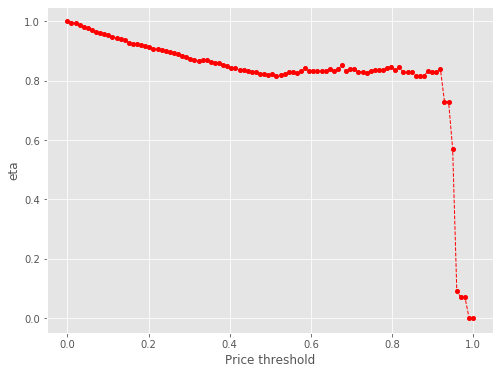

6230 569
Number of cells with price above 26.0th percentile:  569


eta =  1.0
eta =  0.9963074405992927
eta =  0.9918504051534274
eta =  0.986181355052107
eta =  0.9823325039552084
eta =  0.974703632987133
eta =  0.9693883254497337
eta =  0.9658641881407597
eta =  0.9648528145605374
eta =  0.9600467410632059
eta =  0.95330552181377
eta =  0.9473319951359362
eta =  0.9439618311919977
eta =  0.9424859937080886
eta =  0.9378533075047863
eta =  0.9274000111251246
eta =  0.9277044770686012
eta =  0.9241341065525971
eta =  0.9206690793482336
eta =  0.916857578504371
eta =  0.9126730759803813
eta =  0.9097054994138631
eta =  0.90952415608002
eta =  0.9047257095577622
eta =  0.9007294278366096
eta =  0.898937048175505
eta =  0.8937616142568836
eta =  0.8884559478298774
eta =  0.8836431940628785
eta =  0.8806318665804045
eta =  0.8731546585266282
eta =  0.8726195270990834
eta =  0.8722851124950198
eta =  0.8722625162399953
eta =  0.8720116220044228
eta =  0.8643735164077879
eta =  0.8632443256354448
eta =  0.8638130093890045
eta =  0.8527101639366009
eta =  0.

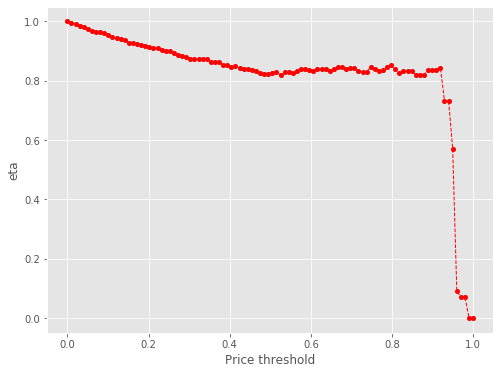

6230 562
Number of cells with price above 27.0th percentile:  562


eta =  1.0
eta =  0.9933482833220895
eta =  0.9859732688178279
eta =  0.9811184833347943
eta =  0.9775494861876225
eta =  0.9725943885169825
eta =  0.96949526159102
eta =  0.9661086745680098
eta =  0.9611187126836652
eta =  0.9565121548730342
eta =  0.9510568562895116
eta =  0.9474603849432176
eta =  0.9426847736741124
eta =  0.9349471536189505
eta =  0.9325893433735222
eta =  0.9316007180868607
eta =  0.9275591738998934
eta =  0.9238886878931867
eta =  0.9212588509718926
eta =  0.9160123469807394
eta =  0.9130770908091008
eta =  0.9114294455665581
eta =  0.9091185822783084
eta =  0.9039579508195131
eta =  0.9022687290529336
eta =  0.8970741137085894
eta =  0.8917487831822865
eta =  0.8869181921710381
eta =  0.8836838640717288
eta =  0.8763907835531305
eta =  0.8758536687974454
eta =  0.8755180147709509
eta =  0.8759918181323487
eta =  0.8752435106576097
eta =  0.8675770963708304
eta =  0.866443720540912
eta =  0.866153826271853
eta =  0.8558705166586771
eta =  0.856779756072484
eta = 

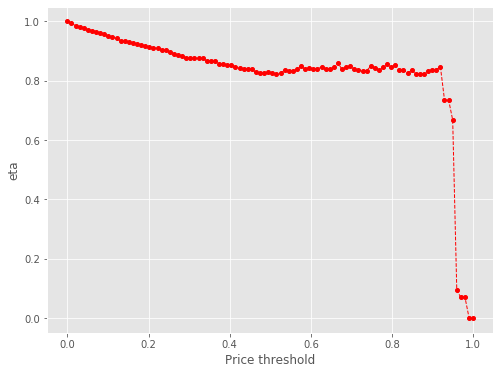

6230 551
Number of cells with price above 28.000000000000004th percentile:  551


eta =  1.0
eta =  0.9922000570349065
eta =  0.9864628812723353
eta =  0.9811787965979681
eta =  0.9760767128812924
eta =  0.975617985058591
eta =  0.9727936815965521
eta =  0.9646329500218402
eta =  0.9577097380352785
eta =  0.9553163596886278
eta =  0.9534116915112768
eta =  0.9488315485906824
eta =  0.9387450261963878
eta =  0.9370267708901641
eta =  0.9364453878943418
eta =  0.9317723779898773
eta =  0.9275963887440247
eta =  0.9256728502534419
eta =  0.9217973059337515
eta =  0.9195053678167753
eta =  0.9171854617911734
eta =  0.9142494806351025
eta =  0.9096667817735676
eta =  0.9079668919427264
eta =  0.9027394706688083
eta =  0.8973805086978994
eta =  0.8925194107062474
eta =  0.8892646566210257
eta =  0.8819255175841332
eta =  0.8813850107488271
eta =  0.8810472369422095
eta =  0.881524032548206
eta =  0.8807709992332096
eta =  0.873056168686418
eta =  0.8713482441533336
eta =  0.8716239101069592
eta =  0.8615931912134603
eta =  0.8613344227416491
eta =  0.8569637440724986
eta 

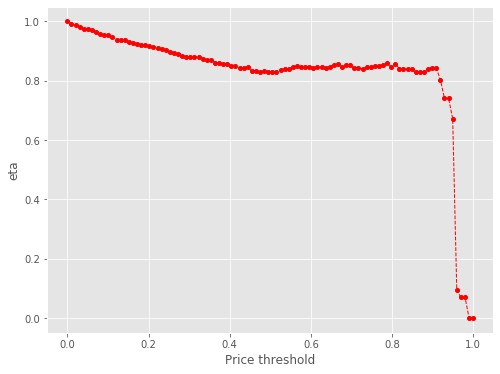

6230 545
Number of cells with price above 29.000000000000004th percentile:  545


eta =  1.0
eta =  0.9922339218774102
eta =  0.9876444264885224
eta =  0.9832354974022118
eta =  0.9822059340149167
eta =  0.9794485074315278
eta =  0.9707482282313793
eta =  0.9643699982660167
eta =  0.9634165362289526
eta =  0.9596450449270293
eta =  0.9565614839686924
eta =  0.9453490063739851
eta =  0.9443929822886501
eta =  0.9409648922681135
eta =  0.939344317130492
eta =  0.9337969128512811
eta =  0.9312251520175043
eta =  0.9295748794741577
eta =  0.9258731454590807
eta =  0.9209772198842181
eta =  0.9214366338248843
eta =  0.9165981346523153
eta =  0.9151046560671415
eta =  0.9098361406736436
eta =  0.9027641488225032
eta =  0.8995357381589505
eta =  0.896255397604498
eta =  0.8888585636849105
eta =  0.8883138077846524
eta =  0.8879733786502024
eta =  0.8887030193017293
eta =  0.8876949693646543
eta =  0.8814178412908528
eta =  0.8781981395539052
eta =  0.8781238304489448
eta =  0.868940324913635
eta =  0.8681055968850308
eta =  0.8637005591729672
eta =  0.862904429359888
eta =

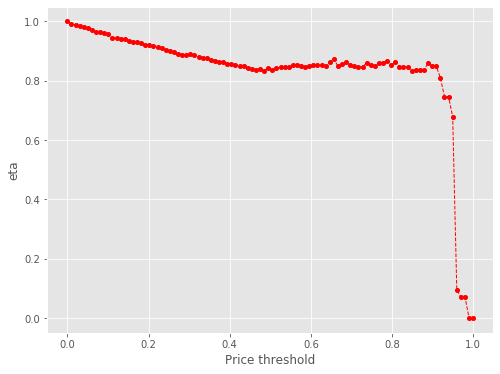

6230 531
Number of cells with price above 30.0th percentile:  531


eta =  1.0
eta =  0.9949311029869552
eta =  0.9917608011559461
eta =  0.9882964373862738
eta =  0.9853218462828133
eta =  0.9784795229174204
eta =  0.9728989373198585
eta =  0.9692198689994198
eta =  0.9677045418266965
eta =  0.9626086599030088
eta =  0.9534953096066039
eta =  0.9520816451778507
eta =  0.9488616044567852
eta =  0.9462610708172348
eta =  0.94184366887311
eta =  0.9371919308267082
eta =  0.9357958639494338
eta =  0.9333477590844093
eta =  0.92891350548131
eta =  0.9290413502028156
eta =  0.92381504976668
eta =  0.9231439400487433
eta =  0.9176764208706388
eta =  0.9105434879388081
eta =  0.9072872572722221
eta =  0.903978649222186
eta =  0.896518074978481
eta =  0.8959686247836066
eta =  0.8956252620881757
eta =  0.8963611902313676
eta =  0.8953444536818292
eta =  0.8894420613505237
eta =  0.8857657873695709
eta =  0.8856908379249075
eta =  0.8779207676869851
eta =  0.8755862747960216
eta =  0.8710648460451705
eta =  0.8696842725638823
eta =  0.8637966217443463
eta =  0.

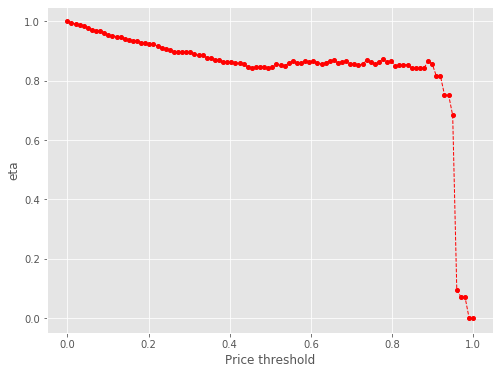

6230 519
Number of cells with price above 31.0th percentile:  519


eta =  1.0
eta =  0.9983241626058269
eta =  0.9966365028061688
eta =  0.988275754652858
eta =  0.981182857245107
eta =  0.9787308180610295
eta =  0.9767422975136916
eta =  0.9718889575083683
eta =  0.9639116275471582
eta =  0.9614807728166838
eta =  0.9604615201183773
eta =  0.9562947697090262
eta =  0.9527091565724293
eta =  0.94922185721968
eta =  0.9444348853978941
eta =  0.943182430729722
eta =  0.940006902743437
eta =  0.9363504272476874
eta =  0.9363051201774849
eta =  0.9298896903469763
eta =  0.9251762474496737
eta =  0.9248652885120074
eta =  0.917676477811526
eta =  0.914394738577062
eta =  0.9094330884964369
eta =  0.90387938086175
eta =  0.9029874385047629
eta =  0.9026413859843411
eta =  0.9033830792206472
eta =  0.9023583777890277
eta =  0.8964097474632917
eta =  0.8927046743910019
eta =  0.8926291378094946
eta =  0.8847981986146783
eta =  0.8824454178392043
eta =  0.8760536235174945
eta =  0.8764971806685824
eta =  0.8731775907565306
eta =  0.8714486743234635
eta =  0.86

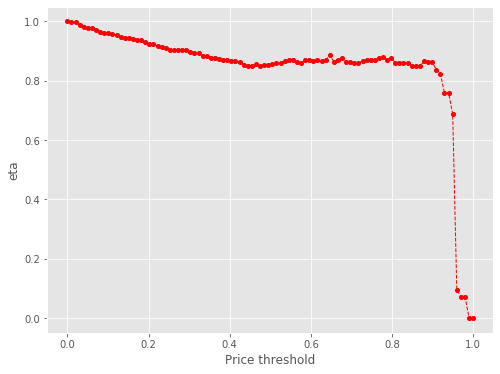

6230 511
Number of cells with price above 32.0th percentile:  511


eta =  1.0
eta =  0.9955626767695984
eta =  0.9883347214807567
eta =  0.9822965385292921
eta =  0.9808702053864004
eta =  0.9783149090829502
eta =  0.9736151323287491
eta =  0.9632651488672543
eta =  0.9615020125446601
eta =  0.9619713111583074
eta =  0.9577980108536176
eta =  0.9540078653890337
eta =  0.9512922946276618
eta =  0.9459194834769461
eta =  0.9446650600210649
eta =  0.9420806562155353
eta =  0.937822317017013
eta =  0.9377769387266657
eta =  0.930298059379104
eta =  0.9266305720420671
eta =  0.926319124294586
eta =  0.9191190131913751
eta =  0.9158321152489486
eta =  0.9108626657357818
eta =  0.9049615084807778
eta =  0.9044068835478667
eta =  0.9040602870525081
eta =  0.9043184336151008
eta =  0.9037768339843616
eta =  0.89729759139885
eta =  0.8960281332158417
eta =  0.8940323001913454
eta =  0.8876804455236637
eta =  0.8829962616143467
eta =  0.8775701097301895
eta =  0.8778749845286832
eta =  0.8816371228254959
eta =  0.8728185422179008
eta =  0.8697361223532579
eta = 

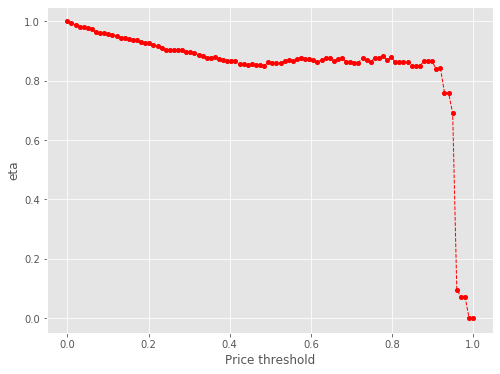

6230 497
Number of cells with price above 33.0th percentile:  497


eta =  1.0
eta =  0.9931442077661684
eta =  0.9895310992686236
eta =  0.9857891355560955
eta =  0.9842479031572738
eta =  0.9794099408830057
eta =  0.9697957574727024
eta =  0.9683579257899638
eta =  0.9652982700564322
eta =  0.9624378459908208
eta =  0.9579449264963018
eta =  0.9553066598571931
eta =  0.9536137112208478
eta =  0.9506992012640781
eta =  0.9483005934008265
eta =  0.9448144465906051
eta =  0.9406410881208468
eta =  0.9392552861151755
eta =  0.9327199770543853
eta =  0.9277269797348786
eta =  0.9265149176165325
eta =  0.9217757992799674
eta =  0.9139978695017746
eta =  0.9144400524947882
eta =  0.911927706716083
eta =  0.9109363944504864
eta =  0.9109127969468889
eta =  0.9106507854932174
eta =  0.9036944058560586
eta =  0.900908367404441
eta =  0.9008321366639989
eta =  0.8929292334445683
eta =  0.8905548313067742
eta =  0.8841042982779369
eta =  0.8845519315885945
eta =  0.8871765061704204
eta =  0.8794570309571905
eta =  0.8763511668042203
eta =  0.8738647477985985
eta

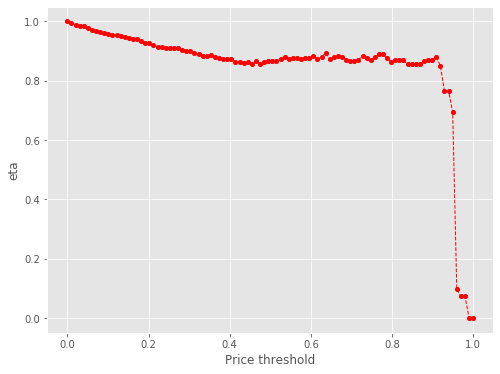

6230 488
Number of cells with price above 34.0th percentile:  488


eta =  1.0
eta =  0.9983320611348259
eta =  0.9954742791329606
eta =  0.9901233636569842
eta =  0.9823975423434916
eta =  0.9779989559802608
eta =  0.9781829307170344
eta =  0.9746346082666387
eta =  0.9719634388641014
eta =  0.9674260513324042
eta =  0.9626479626550681
eta =  0.9630519684644793
eta =  0.9592169226723979
eta =  0.9541446785031125
eta =  0.9546206374706664
eta =  0.9499509506565353
eta =  0.9480606240941034
eta =  0.9419514415102005
eta =  0.9369090267037558
eta =  0.9356849683714987
eta =  0.9308989452794313
eta =  0.9230440345379767
eta =  0.923490593974814
eta =  0.9209533826080145
eta =  0.919952258969048
eta =  0.9199284279124859
eta =  0.9196638232373964
eta =  0.9136011099706378
eta =  0.9098249809393045
eta =  0.9097479957158576
eta =  0.9033085317277338
eta =  0.898517960767547
eta =  0.8929964255836331
eta =  0.891640608436502
eta =  0.8971349304354302
eta =  0.8881613329142877
eta =  0.886827855940973
eta =  0.8818433431660282
eta =  0.8819169975198056
eta = 

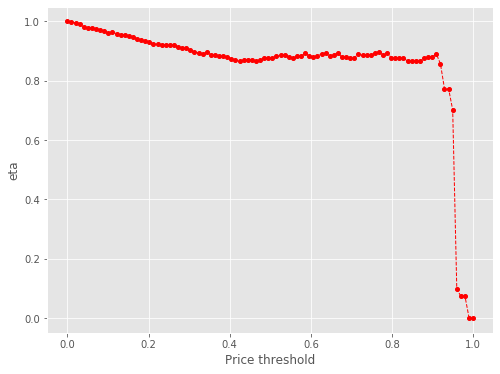

6230 478
Number of cells with price above 35.0th percentile:  478


eta =  1.0
eta =  0.9964656672765061
eta =  0.9895188321573755
eta =  0.9837760657867557
eta =  0.9823175067188192
eta =  0.9792137438316318
eta =  0.9775272946763973
eta =  0.9717543964976989
eta =  0.9708728554940017
eta =  0.9668080708573764
eta =  0.9637100456330135
eta =  0.9629300069736791
eta =  0.9585774257301564
eta =  0.9572860204273946
eta =  0.9508866474385727
eta =  0.9471379943017854
eta =  0.9468196538500679
eta =  0.9394601958364859
eta =  0.9361005549843565
eta =  0.9329104604456064
eta =  0.9254078653428773
eta =  0.9254672150026735
eta =  0.9243342765894343
eta =  0.9255513181621113
eta =  0.926170253814162
eta =  0.9220048662274862
eta =  0.9156869354731124
eta =  0.914490710440457
eta =  0.9141847406356336
eta =  0.9039636374834834
eta =  0.903392824272101
eta =  0.8987278056365268
eta =  0.8973033884062924
eta =  0.8999657981318221
eta =  0.8921350410918033
eta =  0.8889844036573401
eta =  0.8864621411207183
eta =  0.8858627680178697
eta =  0.8863343845963708
eta 

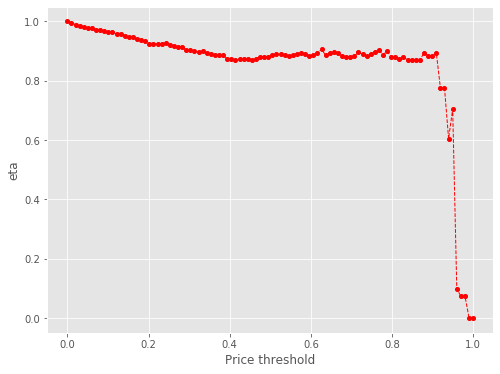

6230 466
Number of cells with price above 36.00000000000001th percentile:  466


eta =  1.0
eta =  0.9917965654782906
eta =  0.987436688012182
eta =  0.9877608640303323
eta =  0.9839593600460673
eta =  0.9812626344079642
eta =  0.976681835722896
eta =  0.9757776336722302
eta =  0.9717104289313397
eta =  0.9685966946645828
eta =  0.9684036117890004
eta =  0.9632945303951006
eta =  0.9618237210629895
eta =  0.9559698123409649
eta =  0.9519406120430762
eta =  0.9516206573941558
eta =  0.944223882047899
eta =  0.940847205588648
eta =  0.9376409351550227
eta =  0.930100296919653
eta =  0.9301599475215832
eta =  0.929021264359262
eta =  0.9302444771398137
eta =  0.9302497194813368
eta =  0.9272079731812133
eta =  0.9203300754888535
eta =  0.9185296709205795
eta =  0.9184519491461285
eta =  0.9103944692113217
eta =  0.9079736249910104
eta =  0.9015401094810208
eta =  0.9018533116470524
eta =  0.9057182092026836
eta =  0.896658757384204
eta =  0.8953125224586534
eta =  0.8902803206893166
eta =  0.8890256658681355
eta =  0.8900945030339491
eta =  0.8829307088256763
eta =  0

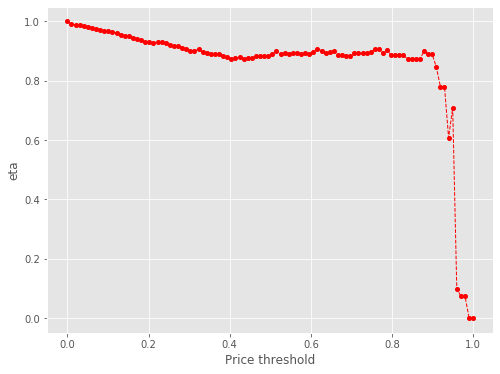

6230 449
Number of cells with price above 37.0th percentile:  449


eta =  1.0
eta =  0.9985173871182057
eta =  0.995362438553051
eta =  0.9930362034362141
eta =  0.9877800754591008
eta =  0.9875295077112507
eta =  0.982798652674343
eta =  0.9796030612538894
eta =  0.9788101585939628
eta =  0.9743857967956894
eta =  0.9743386493128506
eta =  0.9695870292052797
eta =  0.9680072120424076
eta =  0.9624341217255244
eta =  0.9566209921896798
eta =  0.955371180454573
eta =  0.9504844625038622
eta =  0.9424642894743759
eta =  0.9424671402434003
eta =  0.9389576100712229
eta =  0.9393074649288999
eta =  0.9395756760169897
eta =  0.9407552544660973
eta =  0.9322811077251858
eta =  0.9309621563623266
eta =  0.9297009689337888
eta =  0.9262662206136051
eta =  0.9182284678863738
eta =  0.9182911189749572
eta =  0.9136314243200067
eta =  0.9127892699328849
eta =  0.906967046134046
eta =  0.9068476781637657
eta =  0.9036450820201569
eta =  0.901081223613412
eta =  0.9004719659543844
eta =  0.8987344327681878
eta =  0.890671601007385
eta =  0.8886151077266303
eta =  

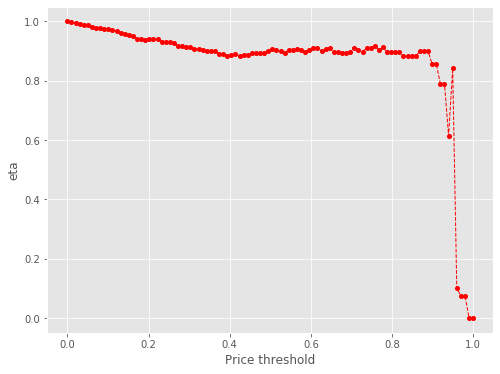

6230 438
Number of cells with price above 38.0th percentile:  438


eta =  1.0
eta =  0.9961513923838269
eta =  0.9934212521886588
eta =  0.9887836937958538
eta =  0.9878682879688033
eta =  0.983750687354121
eta =  0.9805983714645725
eta =  0.9798046631884277
eta =  0.9753758060872629
eta =  0.9753286107009693
eta =  0.969230804632992
eta =  0.9691519995444492
eta =  0.9634119877065036
eta =  0.957692853479868
eta =  0.9525050443380965
eta =  0.9486576974459331
eta =  0.9434218654228599
eta =  0.9434247190883631
eta =  0.939911623113512
eta =  0.9402618334356887
eta =  0.9405303170354162
eta =  0.9417110939765674
eta =  0.9342579308841894
eta =  0.931908045750219
eta =  0.9306455769121238
eta =  0.9311295037817608
eta =  0.9191614194113082
eta =  0.9192241341555402
eta =  0.914559705091468
eta =  0.9130279853032912
eta =  0.9157370518455114
eta =  0.9077690664171417
eta =  0.906406150579337
eta =  0.9013115958621113
eta =  0.9013868762661192
eta =  0.9011234757794737
eta =  0.8938709165122007
eta =  0.8893194669587612
eta =  0.8853792223697179
eta =  0

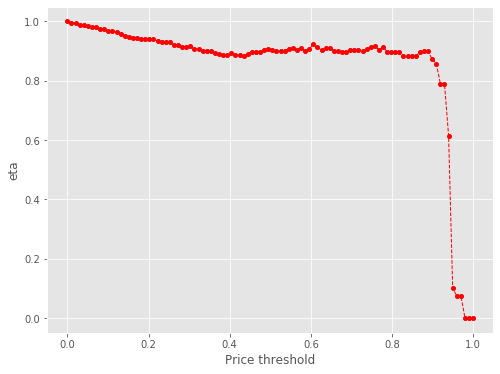

6230 428
Number of cells with price above 39.0th percentile:  428


eta =  1.0
eta =  0.9955182302625653
eta =  0.9949607494811035
eta =  0.9893413029245339
eta =  0.988029295974747
eta =  0.9847027765460402
eta =  0.9807048069704618
eta =  0.9811940150097846
eta =  0.9763943400665156
eta =  0.9749558644865329
eta =  0.9681721519120708
eta =  0.9629893735024303
eta =  0.9613105744592996
eta =  0.9578727936018979
eta =  0.9543797150753127
eta =  0.9469314086796629
eta =  0.946992138719962
eta =  0.945832849926584
eta =  0.9477944453047545
eta =  0.9455360928469633
eta =  0.9452641224816155
eta =  0.9390326439878911
eta =  0.9353502927722795
eta =  0.9361955127946786
eta =  0.9329018611863159
eta =  0.9243412639293899
eta =  0.9236017389743172
eta =  0.9197136170973815
eta =  0.9188658563517277
eta =  0.9119573503784855
eta =  0.9128847104412093
eta =  0.9096607940949292
eta =  0.9070798676663665
eta =  0.9064665540801513
eta =  0.904717453853336
eta =  0.8989082388681953
eta =  0.8952772030856696
eta =  0.8903686906117079
eta =  0.8928994437519094
eta =

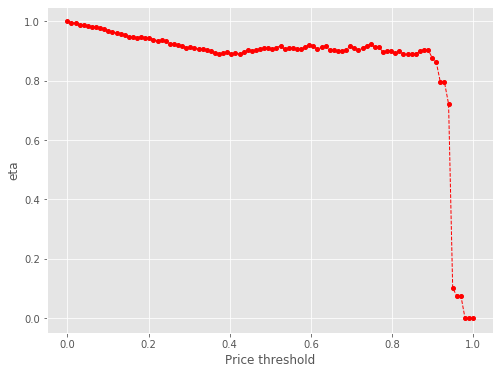

6230 421
Number of cells with price above 40.0th percentile:  421


eta =  1.0
eta =  0.9949569515436494
eta =  0.9935787592744428
eta =  0.9915144639234181
eta =  0.9899322676818701
eta =  0.9862930743276425
eta =  0.9849912667814743
eta =  0.9787934794890487
eta =  0.9746680825066154
eta =  0.9743404889779781
eta =  0.9685564795302894
eta =  0.9633098222741853
eta =  0.9594188328532395
eta =  0.9541236079664159
eta =  0.9545852033888489
eta =  0.9505735470872034
eta =  0.9509277300337611
eta =  0.9511992591876216
eta =  0.9541177616248966
eta =  0.944855721980664
eta =  0.9423028480996234
eta =  0.9410718528636187
eta =  0.9393927865867365
eta =  0.9321300303875198
eta =  0.9296513887953789
eta =  0.9230642738571474
eta =  0.9233534549976993
eta =  0.9240814758372589
eta =  0.9171337561549415
eta =  0.9166880039250277
eta =  0.9148241642757983
eta =  0.9142517854201467
eta =  0.9116117932788456
eta =  0.9120971181512629
eta =  0.8995803439623371
eta =  0.8996082526908831
eta =  0.8954225559392315
eta =  0.8979676740112671
eta =  0.8998650619844804
et

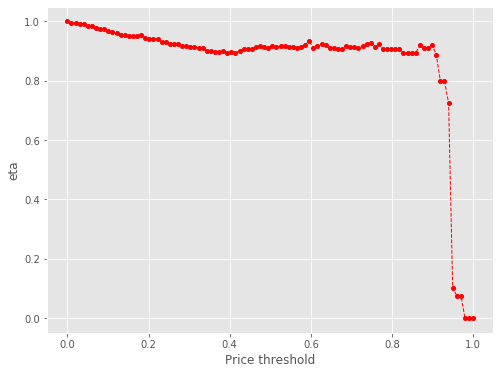

6230 413
Number of cells with price above 41.0th percentile:  413


eta =  1.0
eta =  0.9986738581054803
eta =  0.9953115003237184
eta =  0.9912704585075522
eta =  0.9917649370438033
eta =  0.9869135526640337
eta =  0.9854595796258814
eta =  0.9786027825282477
eta =  0.9733641673058567
eta =  0.9716672816727914
eta =  0.968192463784122
eta =  0.964281752456452
eta =  0.9589596881413999
eta =  0.9594236232108687
eta =  0.9556849487594454
eta =  0.9557476115508533
eta =  0.9560205169800171
eta =  0.9572207408975997
eta =  0.9496448268588359
eta =  0.9470790134564772
eta =  0.9458417787860778
eta =  0.9455253195578482
eta =  0.935261867173139
eta =  0.9343634288428754
eta =  0.9277429263899685
eta =  0.9280335732768547
eta =  0.9287652841699039
eta =  0.9217823492082072
eta =  0.9213343376342167
eta =  0.9194610509092608
eta =  0.9188857708885889
eta =  0.9162323976575107
eta =  0.9167201824522843
eta =  0.9062605026815345
eta =  0.9049224978672104
eta =  0.8999611033924704
eta =  0.9025191216746553
eta =  0.9054193911916156
eta =  0.9009506415586785
eta 

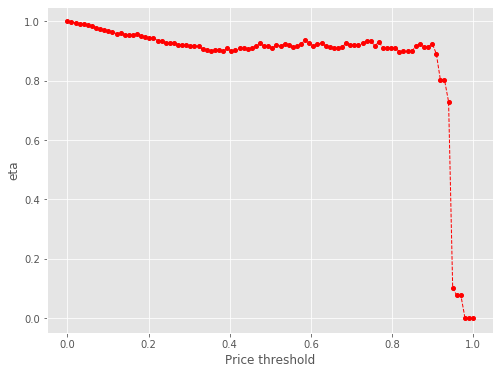

6230 406
Number of cells with price above 42.00000000000001th percentile:  406


eta =  1.0
eta =  0.998404263075208
eta =  0.9947339249342722
eta =  0.9932151122621389
eta =  0.9869000724409721
eta =  0.9871559214098047
eta =  0.9826790474871313
eta =  0.9768455375806784
eta =  0.9754675363364746
eta =  0.9704780256440095
eta =  0.9643411851261736
eta =  0.960021972820243
eta =  0.9605179166078103
eta =  0.9595755213461125
eta =  0.9606052050499873
eta =  0.9606106184877204
eta =  0.9587652193157667
eta =  0.9524447373440061
eta =  0.9505450652773078
eta =  0.9495670837379994
eta =  0.9450312136427524
eta =  0.937543522023508
eta =  0.9376074909858124
eta =  0.93276579167098
eta =  0.9312874267454747
eta =  0.9352784643707015
eta =  0.9259233359226525
eta =  0.9245331634373719
eta =  0.9218253074726593
eta =  0.9220760953929574
eta =  0.9194135097854267
eta =  0.9189498880489712
eta =  0.9072790934412615
eta =  0.9073072410170775
eta =  0.9030857224170473
eta =  0.9056526220081684
eta =  0.9085629611128864
eta =  0.904078696209271
eta =  0.9057995511674742
eta =  

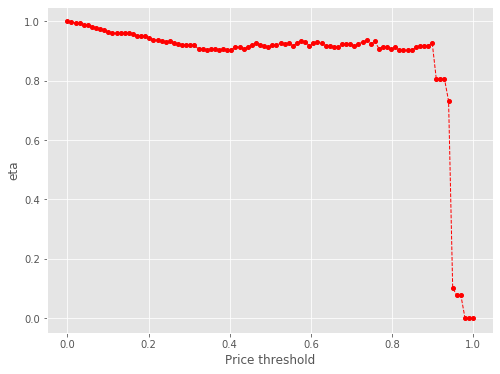

6230 397
Number of cells with price above 43.0th percentile:  397


eta =  1.0
eta =  0.9999516131259366
eta =  0.9930191821843302
eta =  0.9934537379606128
eta =  0.987734144822853
eta =  0.981768202426154
eta =  0.9800566658670177
eta =  0.9767961658400348
eta =  0.9729906508663153
eta =  0.9647614812047381
eta =  0.9665045526434142
eta =  0.9639363413451664
eta =  0.9639995451676882
eta =  0.9647916559146082
eta =  0.9654853935266837
eta =  0.9578440689768402
eta =  0.9552561023181054
eta =  0.9540081853522494
eta =  0.953306702100081
eta =  0.9465589167719253
eta =  0.9421950198323739
eta =  0.9362213200599795
eta =  0.938025565454222
eta =  0.9367842521254236
eta =  0.9308089763999507
eta =  0.9306864705396715
eta =  0.9273996860297365
eta =  0.9240659756342926
eta =  0.9227637073436474
eta =  0.9241431565562903
eta =  0.9221758431481399
eta =  0.9119463183502885
eta =  0.9119746107228577
eta =  0.907310772250844
eta =  0.910311480023214
eta =  0.9122349502149175
eta =  0.9059094664587483
eta =  0.9086201935350721
eta =  0.9071530162919879
eta =  

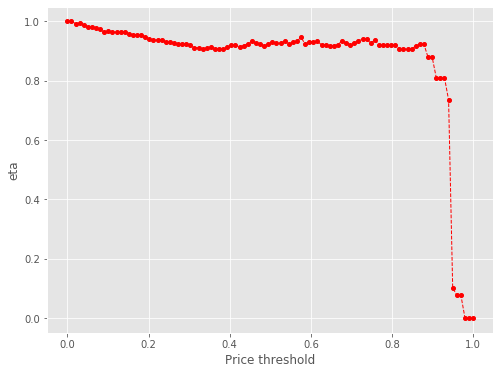

6230 386
Number of cells with price above 44.0th percentile:  386


eta =  1.0
eta =  0.998526747318215
eta =  0.9915790292742944
eta =  0.9922642545426084
eta =  0.9845515638628256
eta =  0.9810306699818068
eta =  0.9770681027264341
eta =  0.9716754679807809
eta =  0.9706167518742652
eta =  0.9687920702168673
eta =  0.9689353729487186
eta =  0.9699751003505114
eta =  0.9683957127225357
eta =  0.9681171671040418
eta =  0.9611766639388833
eta =  0.9598168323812708
eta =  0.9585165551203473
eta =  0.9588434792046273
eta =  0.9473512735332507
eta =  0.9467530629412204
eta =  0.9400447728027015
eta =  0.9403392736595411
eta =  0.9410806870194793
eta =  0.9340051585267889
eta =  0.9349549387791619
eta =  0.9316530798744282
eta =  0.9283040798649274
eta =  0.9269958388960347
eta =  0.9267687840350498
eta =  0.9265375981014662
eta =  0.9161288374039299
eta =  0.9161572595356582
eta =  0.9114720309961812
eta =  0.9145164028280746
eta =  0.9164187930397603
eta =  0.9100642983036666
eta =  0.9127874577648992
eta =  0.9113135515108516
eta =  0.9174314817749651
et

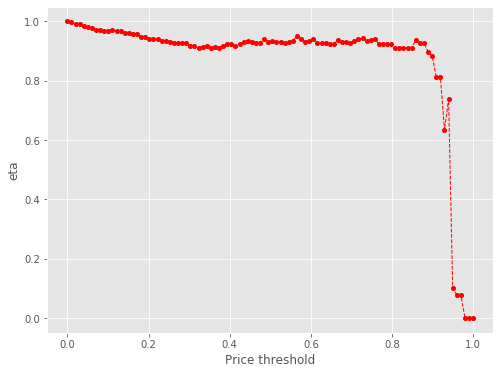

6230 367
Number of cells with price above 45.0th percentile:  367


eta =  1.0
eta =  0.9954648765959082
eta =  0.9895554657521564
eta =  0.9881595350644938
eta =  0.9851952902066868
eta =  0.9788546596541314
eta =  0.974278485946326
eta =  0.9740691260593336
eta =  0.9714808140560658
eta =  0.9715445125580533
eta =  0.9723428229445739
eta =  0.9730419902559544
eta =  0.965340859096412
eta =  0.9627326371127185
eta =  0.9608492821251466
eta =  0.9607679794589934
eta =  0.9568803304009094
eta =  0.9497420839907004
eta =  0.9507510484530898
eta =  0.9449872698136063
eta =  0.9434045894345227
eta =  0.9474475552301661
eta =  0.9379707053778262
eta =  0.9365624450866908
eta =  0.9346581960819503
eta =  0.9340734076498233
eta =  0.9313761786206662
eta =  0.9295790132669717
eta =  0.9236101615434388
eta =  0.9200540497442727
eta =  0.9167858585136006
eta =  0.916314317769758
eta =  0.9197892972045815
eta =  0.9194040751708541
eta =  0.9172701823217912
eta =  0.9157317215070658
eta =  0.9142530610589216
eta =  0.9203907251615104
eta =  0.9282580670234695
eta 

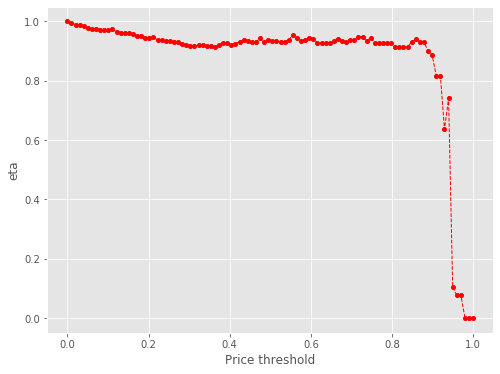

6230 359
Number of cells with price above 46.0th percentile:  359


eta =  1.0
eta =  0.9986935142074962
eta =  0.9956976699040543
eta =  0.9910594460707247
eta =  0.9833248784829639
eta =  0.985219564016583
eta =  0.9818369946827352
eta =  0.9819013722235495
eta =  0.9821817456319103
eta =  0.9851953096047438
eta =  0.9797089013371681
eta =  0.9729955604158581
eta =  0.9710921284857948
eta =  0.9721763692881663
eta =  0.9675324996803434
eta =  0.9598665253880468
eta =  0.9599320174576281
eta =  0.9531303468442219
eta =  0.9534289472002332
eta =  0.9541806811530811
eta =  0.9470066601687002
eta =  0.947969661514552
eta =  0.9446218402041728
eta =  0.9412262215772855
eta =  0.9398997696842348
eta =  0.9413048357774674
eta =  0.9408301751619202
eta =  0.9288814977880511
eta =  0.9289103155604125
eta =  0.9245882821877898
eta =  0.92721629991035
eta =  0.9300201091930437
eta =  0.9222602174614396
eta =  0.9285815842948089
eta =  0.9253765281657287
eta =  0.9259771046913026
eta =  0.9361974849407877
eta =  0.934937500010478
eta =  0.9366634475191901
eta = 

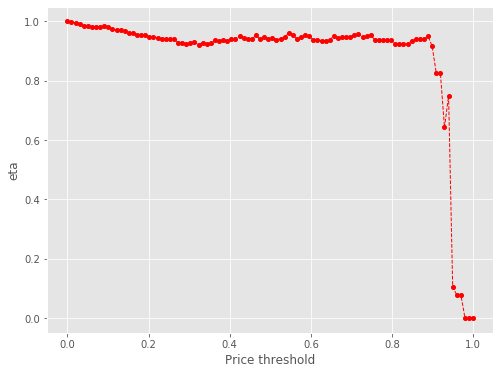

6230 354
Number of cells with price above 47.0th percentile:  354


eta =  1.0
eta =  0.9965921454465932
eta =  0.9904639046593727
eta =  0.9909430811525006
eta =  0.9867786304130959
eta =  0.9876708268118544
eta =  0.9887306585109102
eta =  0.9887362304480877
eta =  0.9868368000380615
eta =  0.9797620944477794
eta =  0.9783759690194708
eta =  0.9770505494370763
eta =  0.9765881835749054
eta =  0.9676326440718147
eta =  0.9648182258174003
eta =  0.9642217057875597
eta =  0.960162584469044
eta =  0.9585544882208595
eta =  0.9626623789949127
eta =  0.9530333427766338
eta =  0.951602467585047
eta =  0.9496676387209237
eta =  0.9490734593173542
eta =  0.9463329161605653
eta =  0.9460563816810774
eta =  0.9428029946889662
eta =  0.9336780972680456
eta =  0.9338721892890957
eta =  0.929096366592784
eta =  0.9321691248733889
eta =  0.934138779837286
eta =  0.930549116275257
eta =  0.9381994573261381
eta =  0.9289357439923208
eta =  0.931940274942716
eta =  0.9382862737138224
eta =  0.9399315685890619
eta =  0.940466719659675
eta =  0.942870715352804
eta =  0.

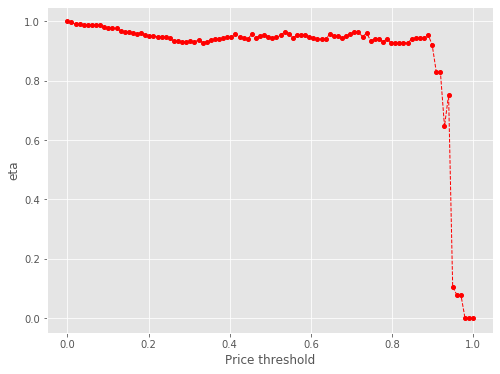

6230 340
Number of cells with price above 48.00000000000001th percentile:  340


eta =  1.0
eta =  1.0004837899603143
eta =  0.9962792442723652
eta =  0.9971800306559593
eta =  0.9982500663170977
eta =  0.9982556919003734
eta =  0.9963379739491278
eta =  0.9891951537443722
eta =  0.9877956828279784
eta =  0.9863206873891159
eta =  0.9855954447191956
eta =  0.9785930589836405
eta =  0.974107406921818
eta =  0.9753196634894293
eta =  0.9694069414869293
eta =  0.9677833626360296
eta =  0.9705545128517329
eta =  0.9612315935769442
eta =  0.9607644085851967
eta =  0.9588109513667951
eta =  0.9553643273448257
eta =  0.9540179508930138
eta =  0.9554441224044561
eta =  0.9549623319386854
eta =  0.9428341741587022
eta =  0.9428634248011901
eta =  0.9384764704100576
eta =  0.9414886397456961
eta =  0.9439898885811234
eta =  0.9431626445907532
eta =  0.9409736092393258
eta =  0.939395392642509
eta =  0.9378785217297231
eta =  0.9441747908707225
eta =  0.9505287004533445
eta =  0.9489811432475278
eta =  0.9487128144532397
eta =  0.9465805599532292
eta =  0.9565463319660393
eta

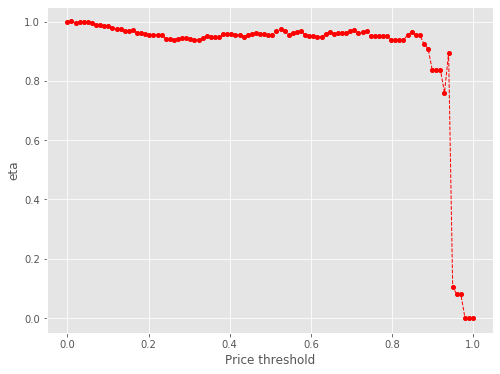

6230 329
Number of cells with price above 49.0th percentile:  329


eta =  1.0
eta =  0.9987758200454071
eta =  1.00009774167115
eta =  0.9990286686012786
eta =  1.0000273246894023
eta =  0.9921126183687289
eta =  0.9894320626695211
eta =  0.9874964766737241
eta =  0.9885990332085786
eta =  0.9846254125639524
eta =  0.9764411030357698
eta =  0.9761478414656658
eta =  0.9694865025460093
eta =  0.9715850731671624
eta =  0.970299349679658
eta =  0.9724448187278274
eta =  0.9639834092763904
eta =  0.9625360937591638
eta =  0.9605790342932591
eta =  0.9599780279470319
eta =  0.9572059967735438
eta =  0.9555430908912096
eta =  0.9553047270993421
eta =  0.9445727953159183
eta =  0.944602099897675
eta =  0.9402070558000709
eta =  0.9428794677839998
eta =  0.9457306409185635
eta =  0.9378396638222121
eta =  0.9442678154801273
eta =  0.9419541775277276
eta =  0.9396080044802109
eta =  0.945915884174837
eta =  0.9522815106021959
eta =  0.9507310996435414
eta =  0.9450247316011252
eta =  0.9483260895846861
eta =  0.9609698204743947
eta =  0.9615883162974367
eta = 

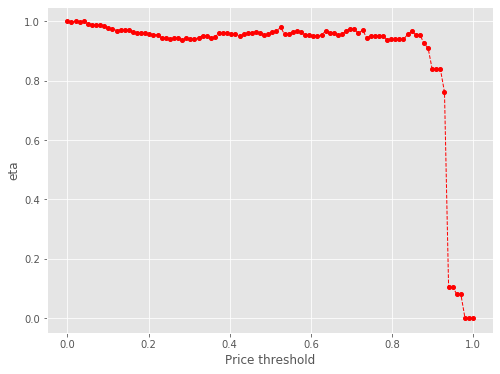

6230 321
Number of cells with price above 50.0th percentile:  321


eta =  1.0
eta =  1.0008216920338715
eta =  1.003354651978676
eta =  0.9977671169952472
eta =  0.9909300342584064
eta =  0.9911154665770648
eta =  0.9897727886194981
eta =  0.9893044022611599
eta =  0.9802322520917821
eta =  0.9773811871129863
eta =  0.9767768997567764
eta =  0.9726649243537772
eta =  0.9710358889790455
eta =  0.9738163524764449
eta =  0.9644621007343853
eta =  0.963993345627309
eta =  0.9620333232298516
eta =  0.9585751157938056
eta =  0.960549414015194
eta =  0.9586551790286738
eta =  0.9591655489096742
eta =  0.9506617037150418
eta =  0.9458210844411438
eta =  0.9436375242341964
eta =  0.9431521725722319
eta =  0.9443378368689387
eta =  0.9463022620578455
eta =  0.9426658572515207
eta =  0.950415813894177
eta =  0.9410314771424433
eta =  0.9461397554807978
eta =  0.9534536883482871
eta =  0.9554457413169761
eta =  0.953928239654135
eta =  0.946455471772323
eta =  0.9524378883458174
eta =  0.9595411951457241
eta =  0.9630441332578566
eta =  0.9625877073899007
eta =  

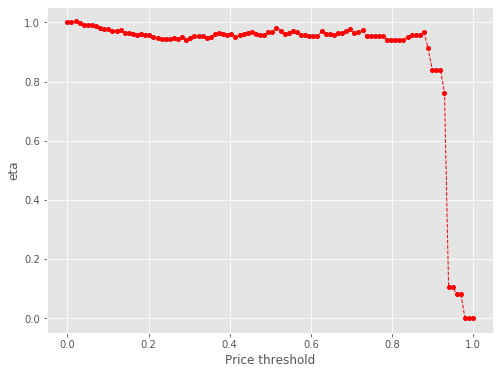

6230 309
Number of cells with price above 51.0th percentile:  309


eta =  1.0
eta =  0.9902925613412134
eta =  0.9876169231928437
eta =  0.9878017355304282
eta =  0.9864635467305668
eta =  0.985996726392001
eta =  0.9769549083753237
eta =  0.9741133757495732
eta =  0.973511108789413
eta =  0.9694128815126568
eta =  0.9677892927133034
eta =  0.9705604599091859
eta =  0.9612374835083565
eta =  0.9622149560322952
eta =  0.9607702956539403
eta =  0.9570784200612192
eta =  0.9582169226816858
eta =  0.9554499768732302
eta =  0.9536063591868
eta =  0.9518860478047084
eta =  0.9434953733444301
eta =  0.9428692021819383
eta =  0.9380473687586071
eta =  0.9411497302827652
eta =  0.9439956728642606
eta =  0.9431684238049659
eta =  0.9425355310180596
eta =  0.9394011487729449
eta =  0.9378842685655564
eta =  0.9409186755902412
eta =  0.9473258123130036
eta =  0.9489869581144991
eta =  0.9495272648810813
eta =  0.951954420895819
eta =  0.9555680129110734
eta =  0.9563330306521737
eta =  0.9615406075396911
eta =  0.9593693570778983
eta =  0.9551925686338794
eta =  

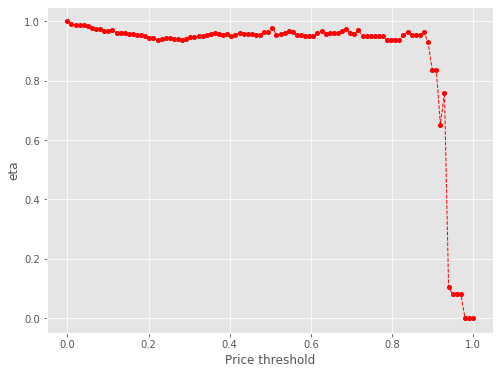

6230 300
Number of cells with price above 52.0th percentile:  300


eta =  1.0
eta =  0.9980054779115103
eta =  0.9966534659594112
eta =  0.9957824982777177
eta =  0.9887077363162904
eta =  0.9843547717402988
eta =  0.9844219346525354
eta =  0.9774467388862226
eta =  0.9777529571754416
eta =  0.978523869467925
eta =  0.974083105664006
eta =  0.9721543934451133
eta =  0.9706948100900126
eta =  0.9687211620586209
eta =  0.9659726671632763
eta =  0.9638786214283849
eta =  0.9653195337603623
eta =  0.9648327635381356
eta =  0.952579249869453
eta =  0.9534037062690381
eta =  0.9517236052560072
eta =  0.9497087538972842
eta =  0.9509026606649428
eta =  0.9528807420949976
eta =  0.9492190578220747
eta =  0.9564704316810896
eta =  0.9489848609817447
eta =  0.9496007594979524
eta =  0.9539337231128929
eta =  0.9603533063119779
eta =  0.9587897536505967
eta =  0.9585186514264868
eta =  0.956364358075842
eta =  0.9664331356918034
eta =  0.9662117092617576
eta =  0.9746162397762931
eta =  0.9692794001723971
eta =  0.9638815959805646
eta =  0.9712924152718115
eta =

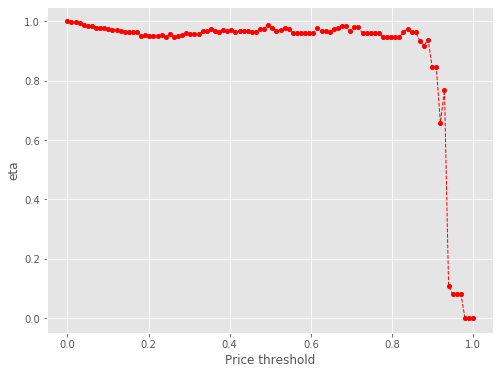

6230 291
Number of cells with price above 53.0th percentile:  291


eta =  1.0
eta =  0.9995267738578755
eta =  0.9903608821767844
eta =  0.9874803574628523
eta =  0.9887092563914668
eta =  0.9805730174172635
eta =  0.9810360276369728
eta =  0.9818095284763456
eta =  0.9755470591519176
eta =  0.9754186652120713
eta =  0.9739541809104031
eta =  0.9719739058210151
eta =  0.969216182109395
eta =  0.9671151050485977
eta =  0.9685608556341238
eta =  0.9680724509489927
eta =  0.9580194393352477
eta =  0.9555941477845065
eta =  0.9533880250944768
eta =  0.9509194453941807
eta =  0.9540643781536732
eta =  0.9585722405362445
eta =  0.9489647895030474
eta =  0.9554691951282968
eta =  0.9547678311243459
eta =  0.9507541071071338
eta =  0.9538301528817007
eta =  0.9603252096367095
eta =  0.9620091500184915
eta =  0.9625568709843325
eta =  0.961754445743901
eta =  0.9622793223829135
eta =  0.9694560268564868
eta =  0.9729951604358392
eta =  0.9725340183705047
eta =  0.9682999151865989
eta =  0.9671180895886422
eta =  0.9618183513789946
eta =  0.980622895661389
eta 

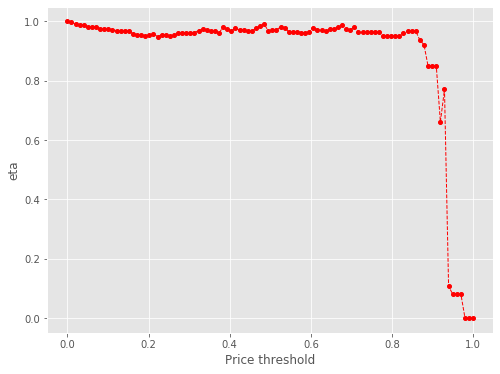

6230 276
Number of cells with price above 54.0th percentile:  276


eta =  1.0
eta =  0.9958576419461366
eta =  0.9956387442259627
eta =  0.9884270595787685
eta =  0.9888937783461557
eta =  0.989673474652971
eta =  0.9851821114056672
eta =  0.9832314228401292
eta =  0.9817552085385061
eta =  0.9797590721478511
eta =  0.9762371462155353
eta =  0.9782478214664054
eta =  0.9763186846392192
eta =  0.9768384582364397
eta =  0.9681779271754055
eta =  0.9632628816289857
eta =  0.9634631237038986
eta =  0.9589803230457669
eta =  0.9597232210409858
eta =  0.9641726913414564
eta =  0.9637688808533895
eta =  0.9570555518595664
eta =  0.9694942219476348
eta =  0.9583702608259018
eta =  0.9635726607056234
eta =  0.9710213549524557
eta =  0.973050112087104
eta =  0.9697145021848194
eta =  0.9694403109376842
eta =  0.9672614708988472
eta =  0.9764392987917092
eta =  0.9772210258656487
eta =  0.9825423453905255
eta =  0.9803236710002481
eta =  0.9760556541512384
eta =  0.979704411185348
eta =  0.9695221753158767
eta =  0.9768075361821459
eta =  0.9756366243967585
eta 

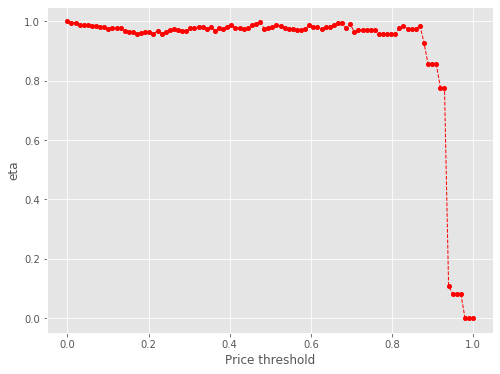

6230 264
Number of cells with price above 55.00000000000001th percentile:  264


eta =  1.0
eta =  0.9939376573406241
eta =  0.9922391454263316
eta =  0.9930214793979948
eta =  0.986687494676051
eta =  0.9865576345184602
eta =  0.9850764262742762
eta =  0.9830735370764795
eta =  0.9795396966844605
eta =  0.981557173926546
eta =  0.9796215109476374
eta =  0.9801430429071
eta =  0.9759674195105943
eta =  0.9666924696109346
eta =  0.9667224604371046
eta =  0.962224494738928
eta =  0.96377944495632
eta =  0.9674344284985178
eta =  0.9669984286837574
eta =  0.9632824936440089
eta =  0.9706413023780893
eta =  0.9630448269910928
eta =  0.9616114150454508
eta =  0.968067010453497
eta =  0.9745817048870012
eta =  0.9729949869485154
eta =  0.9735489627126748
eta =  0.9727373740325403
eta =  0.9732682445949624
eta =  0.9805269047391655
eta =  0.9841064540925004
eta =  0.9836400459322112
eta =  0.9794961930257784
eta =  0.9781622689751821
eta =  0.9856828854524754
eta =  0.9836470235522039
eta =  0.9847488795046111
eta =  0.9859090214832449
eta =  0.9833300225578723
eta =  0.9

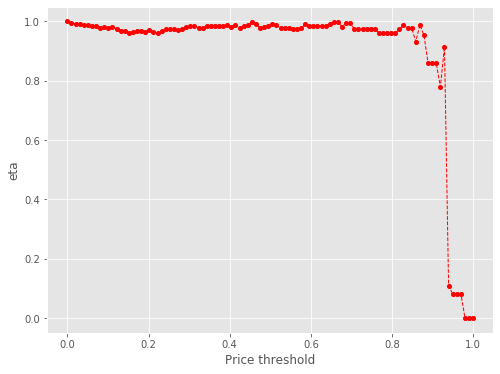

6230 254
Number of cells with price above 56.00000000000001th percentile:  254


eta =  1.0
eta =  1.000788453041053
eta =  0.9944049266995051
eta =  0.99427405083335
eta =  0.9927812572351418
eta =  0.9907627023262482
eta =  0.987201221801812
eta =  0.9886361758786792
eta =  0.9872836759798739
eta =  0.9853786326069943
eta =  0.9836010038600664
eta =  0.9742535094153935
eta =  0.974283734816506
eta =  0.9697505880253219
eta =  0.9713177003737505
eta =  0.9725387723826837
eta =  0.9756321508871828
eta =  0.9701988026751998
eta =  0.9739389463909301
eta =  0.9707001327431346
eta =  0.9691327130943608
eta =  0.9722682205455766
eta =  0.9787547540531286
eta =  0.9806053222486524
eta =  0.9824155751403654
eta =  0.9747196466089252
eta =  0.9781247410783726
eta =  0.9884226159577781
eta =  0.9881961513601302
eta =  0.9935772343858281
eta =  0.9913336421630233
eta =  0.9870176914082844
eta =  0.9907074274689278
eta =  0.9804108353652741
eta =  0.9995788819534193
eta =  0.9924511485398994
eta =  0.9879489522473439
eta =  0.9955017436543638
eta =  0.9898660567072458
eta = 

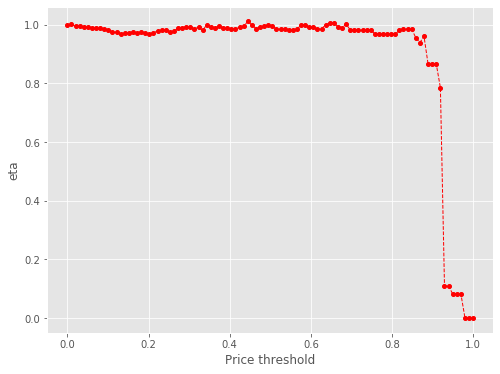

6230 245
Number of cells with price above 57.00000000000001th percentile:  245


eta =  1.0
eta =  0.9995139724964627
eta =  0.9974817284135019
eta =  0.9956732196585204
eta =  0.9968576331255351
eta =  0.9939791084571495
eta =  0.9939791084571495
eta =  0.9934778864114011
eta =  0.9831610503932889
eta =  0.9818959568533998
eta =  0.9808910059776518
eta =  0.9753263183145524
eta =  0.9770834530002424
eta =  0.9816134088353113
eta =  0.9811710188894804
eta =  0.9774006221019282
eta =  0.9848672835247999
eta =  0.9771594721423414
eta =  0.9757050517239874
eta =  0.9788618231532596
eta =  0.9855273317634498
eta =  0.9872554643321388
eta =  0.9890779937622958
eta =  0.9813298739801687
eta =  0.9847580606779731
eta =  0.9951257723505841
eta =  0.9948977719446787
eta =  1.0003153477018274
eta =  0.9980565401760657
eta =  0.9937113200658654
eta =  0.9943272595033843
eta =  0.9929612574509229
eta =  1.0018216573771064
eta =  0.9991816251128545
eta =  0.9946488964089875
eta =  0.9977419730153996
eta =  0.995144712007131
eta =  0.9964435295708363
eta =  1.004101681578772
eta

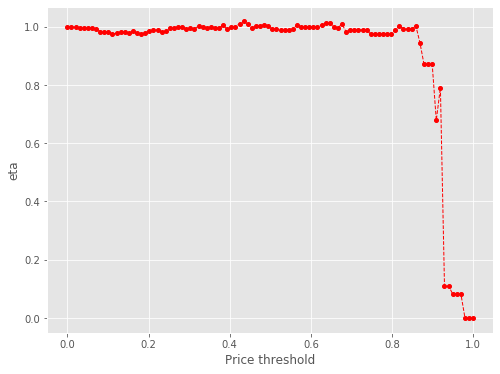

6230 243
Number of cells with price above 58.00000000000001th percentile:  243


eta =  1.0
eta =  0.9970711099700903
eta =  0.9973423689472866
eta =  0.994462444556439
eta =  0.994462444556439
eta =  0.9949918775481867
eta =  0.9861704004776177
eta =  0.9811640144623739
eta =  0.9813679778059564
eta =  0.9768018694531367
eta =  0.9783803766388919
eta =  0.9796103273455902
eta =  0.9827261985226045
eta =  0.9772533431756828
eta =  0.9810206823437756
eta =  0.9777583185308089
eta =  0.9761795018102565
eta =  0.9814795504268827
eta =  0.9890666700897575
eta =  0.9893462871434578
eta =  0.9877355309664095
eta =  0.9882978992754906
eta =  0.9874740153021383
eta =  0.9880129283735128
eta =  0.9953815547568042
eta =  0.9990153330686794
eta =  1.0065134194928396
eta =  0.9967904104060639
eta =  0.994194525949343
eta =  0.9967369755984204
eta =  0.9875396299237973
eta =  0.9949603808430765
eta =  0.9996674910078764
eta =  0.995132558201939
eta =  1.002740267706905
eta =  0.9956286148972798
eta =  0.9971253436347449
eta =  1.0045899399193496
eta =  0.9935441488518213
eta = 

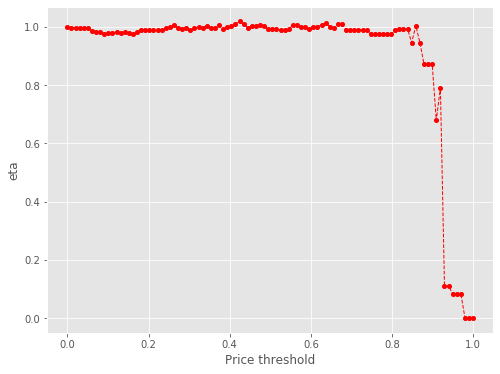

6230 234
Number of cells with price above 59.0th percentile:  234


eta =  1.0
eta =  0.9971124014375451
eta =  0.995380168163529
eta =  0.9966095994033399
eta =  0.9839525153882338
eta =  0.9849911604476312
eta =  0.9839830416929028
eta =  0.9794047659723605
eta =  0.9825483003030094
eta =  0.9847077217612036
eta =  0.984263937281725
eta =  0.9804816551761744
eta =  0.9836348207880321
eta =  0.9803637637122055
eta =  0.9787807398984083
eta =  0.9840949116228288
eta =  0.9917022487811641
eta =  0.9919826109340278
eta =  0.9903675625542538
eta =  0.9909314294134094
eta =  0.9901053500258247
eta =  0.9906456991457997
eta =  0.9961029576681076
eta =  1.001677422090429
eta =  1.0067152951290186
eta =  1.0012026863322214
eta =  0.9968437689042869
eta =  0.9974616499507387
eta =  0.9901711394916108
eta =  1.0049796722085653
eta =  1.002331317843284
eta =  1.0035121738589967
eta =  1.0024681633473724
eta =  1.0091475298970505
eta =  1.0005120796059697
eta =  0.998926556170073
eta =  0.9948512757047003
eta =  0.997260693204912
eta =  1.0051110597042432
eta =  

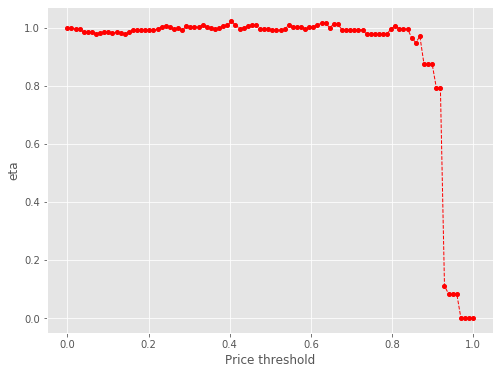

6230 226
Number of cells with price above 60.0th percentile:  226


eta =  1.0
eta =  0.99819599422181
eta =  0.9887097986261714
eta =  0.9895655259800075
eta =  0.9862376897813021
eta =  0.9836840534059975
eta =  0.9869373470677594
eta =  0.9894686563243456
eta =  0.9890227262042669
eta =  0.9852221572535886
eta =  0.9883905680136391
eta =  0.9876650380124796
eta =  0.9835130182702946
eta =  0.9866950513969114
eta =  0.9964970009784184
eta =  0.9967787186460549
eta =  0.9951558617161067
eta =  0.9957224547986475
eta =  0.9948923814239929
eta =  0.9954353430621241
eta =  1.0058730067165371
eta =  1.0065204029613617
eta =  1.0083202552882062
eta =  1.0060433719171218
eta =  1.001663379686805
eta =  1.0004408334445887
eta =  1.008132739026311
eta =  1.006050508458964
eta =  1.0018942984742059
eta =  1.0058299110869982
eta =  1.0073149673500805
eta =  1.0110730644598513
eta =  1.004554009952884
eta =  1.0046162150438518
eta =  0.9996612530401243
eta =  1.0010081166526896
eta =  1.0054173263111168
eta =  1.009139599552033
eta =  1.0185051194547872
eta =  1

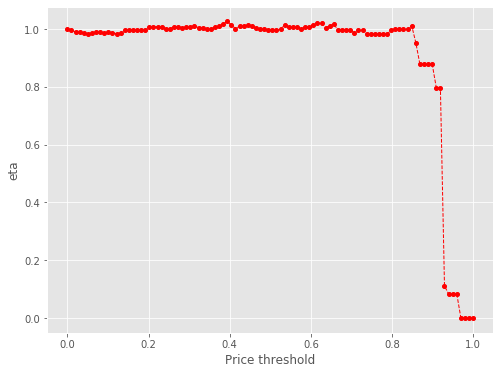

6230 215
Number of cells with price above 61.0th percentile:  215


eta =  1.0
eta =  0.9993363283168287
eta =  0.9946866168332675
eta =  0.9962940256859193
eta =  0.9975138796353074
eta =  1.0005302617627652
eta =  0.9996534699070062
eta =  0.9933116912552548
eta =  1.0039669364464836
eta =  0.9955346242546609
eta =  0.9940528539541387
eta =  0.997268987398364
eta =  1.0052295249713177
eta =  1.0092802748310006
eta =  1.0058204681498362
eta =  1.0063931331377596
eta =  1.0055541642662362
eta =  1.0061029445629335
eta =  1.0138387746384725
eta =  1.0136064867623438
eta =  1.0191259381922517
eta =  1.0168246545578696
eta =  1.0123977240587687
eta =  1.0111620763768467
eta =  1.0189364124088234
eta =  1.0088921951374126
eta =  1.013177601367623
eta =  1.0119630923162608
eta =  1.0133529312067011
eta =  1.021099934018624
eta =  1.0138580704488303
eta =  1.0151813118358517
eta =  1.0229834727922311
eta =  1.0103741415843743
eta =  1.01282115371367
eta =  1.0207940110709328
eta =  1.023269816294695
eta =  1.0370562439271558
eta =  1.0254745633713565
eta =  

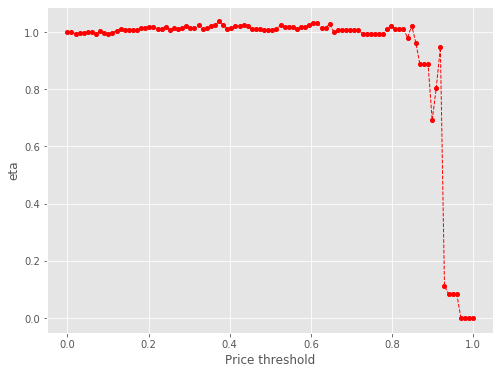

6230 200
Number of cells with price above 62.0th percentile:  200


eta =  1.0
eta =  1.0033072546520372
eta =  1.0058805496524204
eta =  1.0054272230801997
eta =  1.0015636157181418
eta =  1.0047845795520882
eta =  1.0014431893947204
eta =  0.999827119547295
eta =  1.0019663662818472
eta =  1.0065382705953914
eta =  1.0133118608507654
eta =  1.0116620862871448
eta =  1.013529671721964
eta =  1.0055900053369398
eta =  1.0110395139196502
eta =  1.0150493373613445
eta =  1.019493324647097
eta =  1.0232151263165175
eta =  1.0279532818053043
eta =  1.022730182962411
eta =  1.0182775416746406
eta =  1.017034717580885
eta =  1.024854205510052
eta =  1.0227374378750198
eta =  1.0185122906131856
eta =  1.0178403856718392
eta =  1.0192382964879634
eta =  1.0270302924508201
eta =  1.0197463694848254
eta =  1.021077296011622
eta =  1.0289247704671758
eta =  1.01624220660974
eta =  1.0187034305301947
eta =  1.0267225927595685
eta =  1.0258777664005996
eta =  1.0387057338970274
eta =  1.0430792736384897
eta =  1.0332922667588216
eta =  1.0180218567033468
eta =  1.0

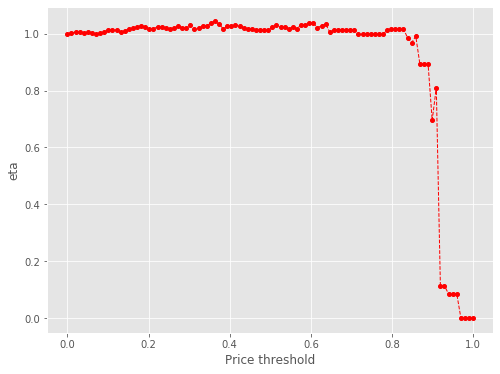

6230 193
Number of cells with price above 63.0th percentile:  193


eta =  1.0
eta =  0.9991236728270325
eta =  0.9927852551957873
eta =  1.0028556024336954
eta =  0.9960068298229526
eta =  0.9935260250927199
eta =  0.998920254560876
eta =  1.0035075658989396
eta =  1.0069267816862417
eta =  1.0052874026796055
eta =  1.0071432200879082
eta =  0.9992535831166972
eta =  1.002744384662848
eta =  1.0086533100124613
eta =  1.013069294852252
eta =  1.016767644710624
eta =  1.0214759441412133
eta =  1.0162857570808466
eta =  1.0118611727696223
eta =  1.0106261799571659
eta =  1.018396395740824
eta =  1.0083575017110575
eta =  1.0126406367585277
eta =  1.0174313913718287
eta =  1.012815873676169
eta =  1.0159654444410697
eta =  1.020601961833466
eta =  1.0155847463971808
eta =  1.013975337126294
eta =  1.0098386627549534
eta =  1.0111992385953092
eta =  1.0156533377931438
eta =  1.0194135069710368
eta =  1.0227275030061223
eta =  1.036506624097544
eta =  1.0249310816093093
eta =  1.0116070989200827
eta =  1.014291501800775
eta =  1.0194279690411554
eta =  1.02

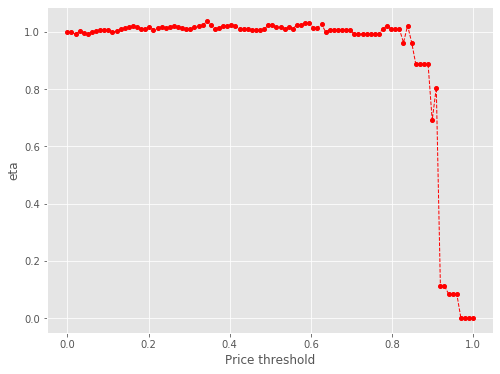

6230 180
Number of cells with price above 64.0th percentile:  180


eta =  1.0
eta =  0.9966745208621163
eta =  0.9950651595622296
eta =  0.997195206487447
eta =  1.001745340323679
eta =  1.0050823349754994
eta =  1.0068447574485293
eta =  1.0087034498218257
eta =  1.0074180056166897
eta =  1.006578182371186
eta =  1.0071275215248592
eta =  1.0148712294754403
eta =  1.0146387050461758
eta =  1.0201637772754344
eta =  1.0178601501013504
eta =  1.016074817122726
eta =  1.0134287113846505
eta =  1.0172171789003157
eta =  1.012663765897999
eta =  1.017654595400879
eta =  1.0136623424965547
eta =  1.0129936370297115
eta =  1.0143848912792017
eta =  1.0221397833440564
eta =  1.0148905449359173
eta =  1.0171580534373685
eta =  1.0155461509280346
eta =  1.0114030681708506
eta =  1.0127657517659319
eta =  1.0172267510926336
eta =  1.0209927453881849
eta =  1.0243118753456848
eta =  1.0381123425515473
eta =  1.0265188676528905
eta =  1.013174243933122
eta =  1.0158628053933576
eta =  1.021007229862418
eta =  1.0226601314805444
eta =  1.026329824567997
eta =  1.0

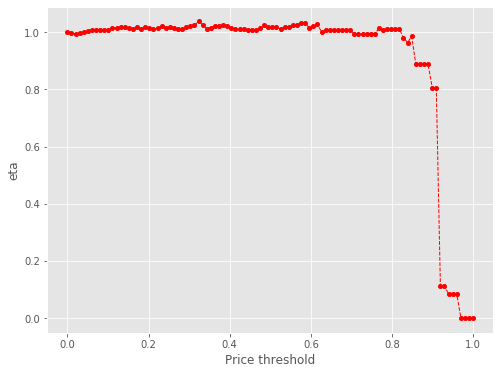

6230 167
Number of cells with price above 65.0th percentile:  167


eta =  1.0
eta =  1.00323537469002
eta =  1.0100668537301383
eta =  1.0153185223665828
eta =  1.0118380166093666
eta =  1.0124141076951128
eta =  1.005764879710567
eta =  1.0092784278793985
eta =  1.018854932253596
eta =  1.0196706168393608
eta =  1.0233930657384993
eta =  1.0285401562289729
eta =  1.0229080380516482
eta =  1.018454622439499
eta =  1.0172115822158259
eta =  1.0210591123354276
eta =  1.0116373352364747
eta =  1.0314158922175338
eta =  1.0240611374793909
eta =  1.0226909989010133
eta =  1.024200949695253
eta =  1.0272088953388117
eta =  1.0199237056821582
eta =  1.022202459469949
eta =  1.0247876966465097
eta =  1.0164189334252327
eta =  1.0188805853580871
eta =  1.0222714978184482
eta =  1.0260561688617074
eta =  1.0293917594264097
eta =  1.0432606674805656
eta =  1.0316096969011543
eta =  1.0181988930040111
eta =  1.0209007878843608
eta =  1.0260707251689942
eta =  1.0260084845265685
eta =  1.0314197162922698
eta =  1.0281379405890227
eta =  1.0203363198550701
eta =  1

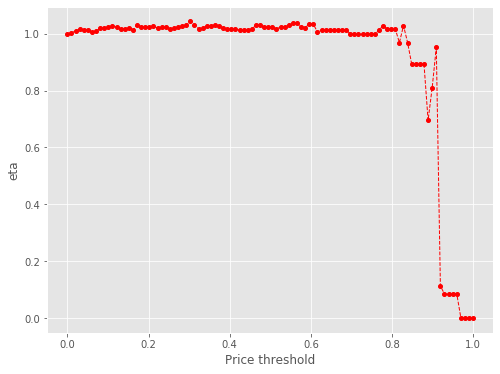

6230 156
Number of cells with price above 66.0th percentile:  156


eta =  1.0
eta =  0.9983718984970379
eta =  1.0002149494934518
eta =  0.9923795863720154
eta =  0.9977575048522502
eta =  0.9986522830405573
eta =  1.00415364814732
eta =  1.0061002580105416
eta =  1.0115788353284954
eta =  1.0092945937726794
eta =  1.007524284832664
eta =  1.0049004467585192
eta =  1.00865703334054
eta =  1.004141938485913
eta =  1.0063763331261886
eta =  1.0056745487121888
eta =  1.0104323470947862
eta =  1.0058485801520396
eta =  1.010570298609843
eta =  1.0143405407302564
eta =  1.0078004186499792
eta =  1.0076634207699264
eta =  1.0154078030857172
eta =  1.0028918498560893
eta =  1.0053207407193503
eta =  1.0086665249803846
eta =  1.0124008274602492
eta =  1.0217966138344563
eta =  1.0293763587872464
eta =  1.01788044597733
eta =  1.0046481207163873
eta =  1.0073140572368133
eta =  1.0124151900438865
eta =  1.0123537777354714
eta =  1.0176929937388728
eta =  1.0144548937806686
eta =  1.0017012036672506
eta =  1.0023783853695047
eta =  1.0023783853695047
eta =  1.0

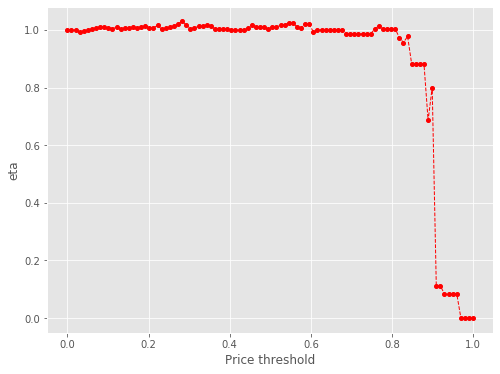

6230 152
Number of cells with price above 67.0th percentile:  152


eta =  1.0
eta =  0.999166360695539
eta =  0.9969027695368123
eta =  1.0073983429094937
eta =  1.0071675306468895
eta =  1.0108443352971261
eta =  1.0184312040233037
eta =  1.0103652549651112
eta =  1.005966446633323
eta =  1.0047386484287888
eta =  1.0085390005676593
eta =  0.9992327522377118
eta =  1.0101612138428309
eta =  1.0061983574296376
eta =  1.0055345758979248
eta =  1.0069155858081444
eta =  1.0100468083474134
eta =  1.0183828062597877
eta =  1.0096683281084662
eta =  1.0089319671383756
eta =  1.0164849491795973
eta =  1.0039557190083388
eta =  1.006387186442607
eta =  1.009736519916516
eta =  1.0134747837499543
eta =  1.016769473679055
eta =  1.0304683227455995
eta =  1.0189602150544332
eta =  1.0057138529233538
eta =  1.0083826174731692
eta =  1.0134891615694415
eta =  1.0134276841147591
eta =  1.0187725639663652
eta =  1.0187725639663652
eta =  1.0155310290269535
eta =  1.0034417098378705
eta =  1.0034417098378705
eta =  1.0034417098378705
eta =  1.0034417098378705
eta = 

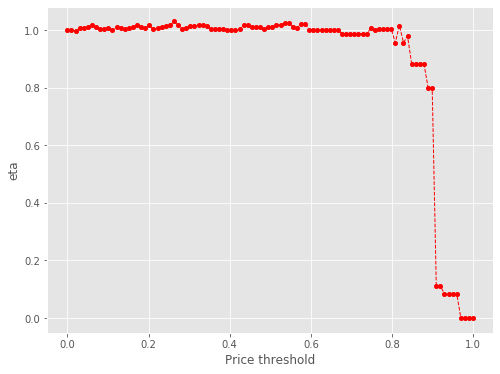

6230 139
Number of cells with price above 68.0th percentile:  139


eta =  1.0
eta =  0.9997708828248244
eta =  1.0034206849871126
eta =  1.010951835677976
eta =  1.0029451230255637
eta =  0.9985786195835551
eta =  0.997359838340588
eta =  1.001132280657591
eta =  0.9918943775029463
eta =  1.0067286821551271
eta =  0.9988088272247995
eta =  0.9981499205109013
eta =  0.9995207882713456
eta =  1.0042128024055463
eta =  1.0109037933480907
eta =  1.0014603477562773
eta =  1.0013242117296786
eta =  1.009019874148155
eta =  0.9965826587611689
eta =  0.9979253745220499
eta =  1.0023210054130818
eta =  1.006860298310193
eta =  1.0093023090970115
eta =  1.018611621545349
eta =  1.0229005536871112
eta =  1.011476961647115
eta =  0.9983278809241687
eta =  1.0009770460420184
eta =  1.0060460876303974
eta =  1.007674768757737
eta =  1.0112906886704036
eta =  1.0080729595940883
eta =  1.0080729595940883
eta =  0.996072424478885
eta =  0.996072424478885
eta =  0.996072424478885
eta =  0.9927676158415779
eta =  0.9927676158415779
eta =  0.9927676158415779
eta =  0.992

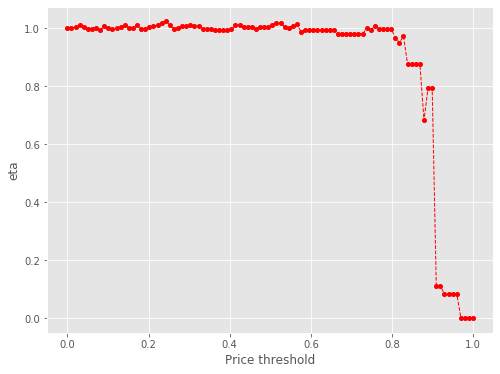

6230 131
Number of cells with price above 69.0th percentile:  131


eta =  1.0
eta =  0.9949189336370223
eta =  0.9907275653292086
eta =  0.9905873736657845
eta =  0.9942904541532454
eta =  0.9898396690348547
eta =  0.987157365275807
eta =  0.9913504498726949
eta =  0.9960404816260405
eta =  0.9955757140699102
eta =  0.9961764682597753
eta =  0.9991021096281115
eta =  0.9991443926675316
eta =  0.9942326612997375
eta =  0.9948686088938118
eta =  1.0009450708306171
eta =  0.9886073857607642
eta =  0.9910016812642838
eta =  0.9942998106010564
eta =  0.9961192977053894
eta =  1.0012252455597093
eta =  1.0147146685563577
eta =  1.0033824951903305
eta =  1.0033824951903305
eta =  0.9903386415727806
eta =  0.9929666064270574
eta =  0.9979950823983625
eta =  0.9996107298084214
eta =  1.0031977128855956
eta =  1.0000057340745485
eta =  1.0000057340745485
eta =  0.9881012346899024
eta =  0.9881012346899024
eta =  0.9881012346899024
eta =  0.9881012346899024
eta =  0.9848228731825599
eta =  0.9848228731825599
eta =  0.9848228731825599
eta =  0.9881746202650918
et

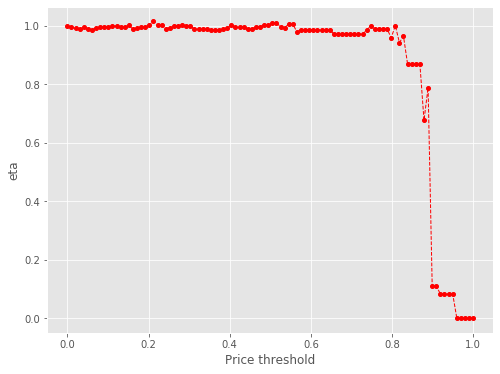

6230 124
Number of cells with price above 70.0th percentile:  124


eta =  1.0
eta =  1.0076885162266305
eta =  0.9945200712646148
eta =  1.0139639680181052
eta =  1.0038746324301286
eta =  1.0007921736367769
eta =  1.0021666702905874
eta =  1.0068711048926537
eta =  1.0106275460375354
eta =  1.002666233371453
eta =  1.0049064298336552
eta =  1.0033139426184965
eta =  0.9992207631092183
eta =  0.9992207631092183
eta =  1.0016407630147366
eta =  1.004974300028712
eta =  1.0086949330901396
eta =  1.0119740842746319
eta =  1.0256083254655792
eta =  1.014154493457462
eta =  1.014154493457462
eta =  1.0009706051380527
eta =  1.0036267829948404
eta =  1.0087092430995233
eta =  1.0086480555909323
eta =  1.013967727388135
eta =  1.013967727388135
eta =  1.0107414804984776
eta =  1.0021588503330117
eta =  0.9987091781599658
eta =  0.9987091781599658
eta =  0.9987091781599658
eta =  0.9953956211966077
eta =  0.9953956211966077
eta =  0.9953956211966077
eta =  0.9953956211966077
eta =  0.998783351579564
eta =  1.0128920092053777
eta =  1.0128920092053777
eta =  1

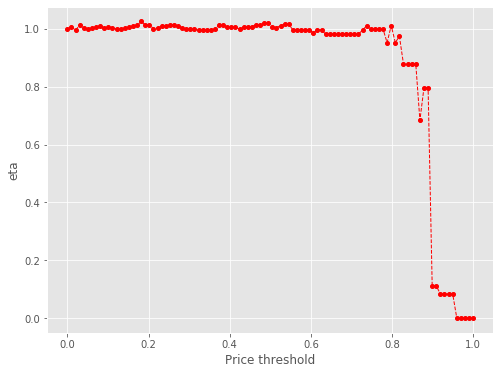

6230 110
Number of cells with price above 71.00000000000001th percentile:  110


eta =  1.0
eta =  0.9960770059680695
eta =  1.0013294921210438
eta =  0.9967870197447598
eta =  1.0014662008486557
eta =  1.0044073774770412
eta =  1.0044498850409092
eta =  0.9995120722043073
eta =  0.9987831182908133
eta =  1.0062601248692868
eta =  0.9938569262515187
eta =  0.9951959695784389
eta =  0.9995795780708119
eta =  1.0041064556422985
eta =  1.0032802387002349
eta =  1.0108968096735826
eta =  1.0201028396502345
eta =  1.0087104920393146
eta =  1.010531416114226
eta =  0.995597375093666
eta =  0.9998086139581416
eta =  1.0032944718932046
eta =  1.0049186984486553
eta =  1.0085247285339487
eta =  1.0085247285339487
eta =  1.005315800201529
eta =  0.9967792417648713
eta =  0.9933480875004117
eta =  0.9933480875004117
eta =  0.9933480875004117
eta =  0.9900523177764969
eta =  0.9900523177764969
eta =  0.9900523177764969
eta =  0.9900523177764969
eta =  0.9934218627556236
eta =  1.0004854199245141
eta =  1.0074547848277138
eta =  0.9998868967756868
eta =  0.9998868967756868
eta 

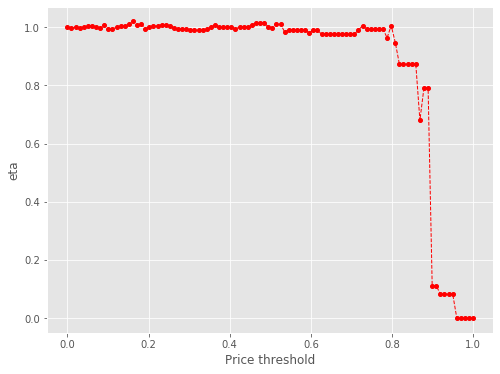

6230 97
Number of cells with price above 72.0th percentile:  97


eta =  1.0
eta =  1.0031097170243481
eta =  1.0113884625615759
eta =  1.0019404893902069
eta =  1.0018042880943496
eta =  1.001144791941221
eta =  0.9970604618286547
eta =  0.9970604618286547
eta =  0.9994752297283063
eta =  1.0028015596819941
eta =  1.012544924613169
eta =  1.009786210492513
eta =  1.019099986211413
eta =  1.0233909746451604
eta =  1.0119619056612594
eta =  0.9988065207235559
eta =  0.9988065207235559
eta =  1.0030313338291217
eta =  1.0065284278582511
eta =  1.006467372636196
eta =  1.0117755433775557
eta =  1.0117755433775557
eta =  1.0085562715884413
eta =  0.9999921969490629
eta =  0.9965499829188901
eta =  0.9965499829188901
eta =  0.9965499829188901
eta =  0.99324358981923
eta =  0.99324358981923
eta =  0.99324358981923
eta =  0.99324358981923
eta =  0.99324358981923
eta =  1.001357755786601
eta =  1.0107021508824279
eta =  1.0107021508824279
eta =  1.0031098689785514
eta =  1.0031098689785514
eta =  1.0031098689785514
eta =  0.9972038253476904
eta =  0.99720382

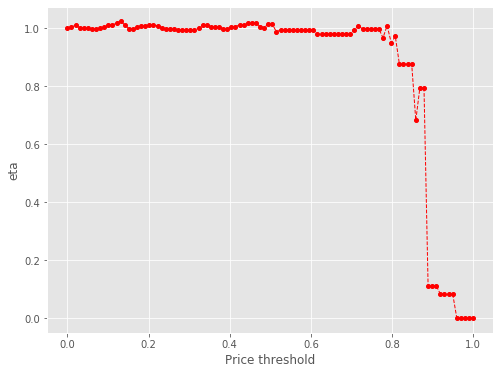

6230 88
Number of cells with price above 73.0th percentile:  88


eta =  1.0
eta =  0.9984152880627678
eta =  1.0067513468347586
eta =  0.9943420933973145
eta =  0.9967502777154494
eta =  1.0000675388205726
eta =  1.00459662625971
eta =  1.0037700059866383
eta =  1.0130856923129195
eta =  1.0206008191582085
eta =  1.0092029101906907
eta =  1.0092029101906907
eta =  0.996083391867386
eta =  0.9987266010040093
eta =  1.0037842461277688
eta =  1.0007643066454255
eta =  1.0054092655753766
eta =  1.0090170560019003
eta =  1.0090170560019003
eta =  1.0058065611798188
eta =  0.9972658354856996
eta =  0.9938330062484373
eta =  0.9938330062484373
eta =  0.9938330062484373
eta =  0.9905356276418474
eta =  0.9905356276418474
eta =  0.9905356276418474
eta =  0.9905356276418474
eta =  0.9905356276418474
eta =  0.9939068175182194
eta =  1.0079465899855415
eta =  1.0079465899855415
eta =  1.0003750075479858
eta =  1.0003750075479858
eta =  1.0003750075479858
eta =  1.0029849727260716
eta =  0.9944850660525267
eta =  1.0018955967029168
eta =  1.0018955967029168
eta 

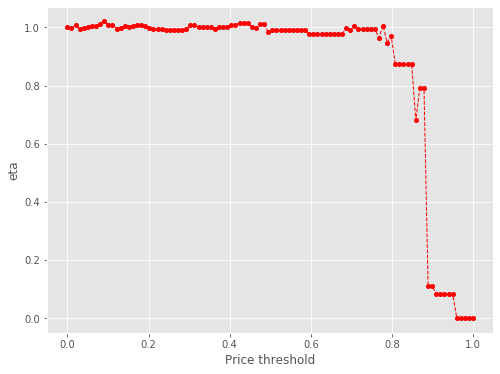

6230 81
Number of cells with price above 74.0th percentile:  81


eta =  1.0
eta =  1.0024218871293147
eta =  1.0057580237840442
eta =  1.0155301141478572
eta =  1.0127632667737307
eta =  1.0221045014084067
eta =  1.0264081405536973
eta =  1.014945376336832
eta =  1.0167775556242262
eta =  1.0017512066336467
eta =  1.0044094558963248
eta =  1.0094958795299451
eta =  1.0064587562879577
eta =  1.0111301455017856
eta =  1.0147584646189989
eta =  1.0147584646189989
eta =  1.011529701758209
eta =  1.0029403784751743
eta =  0.9994880160940005
eta =  0.9994880160940005
eta =  0.9994880160940005
eta =  0.9994880160940005
eta =  0.9961718750712225
eta =  0.9961718750712225
eta =  0.9961718750712225
eta =  0.9961718750712225
eta =  0.9995622473573376
eta =  1.0043099632594643
eta =  1.0136819075432533
eta =  1.0136819075432533
eta =  1.0060672420394665
eta =  1.0060672420394665
eta =  1.0060672420394665
eta =  1.0001437861840121
eta =  1.0001437861840121
eta =  1.0075964834997528
eta =  1.0014024006443316
eta =  1.0087568309748918
eta =  1.0143801810747521
eta

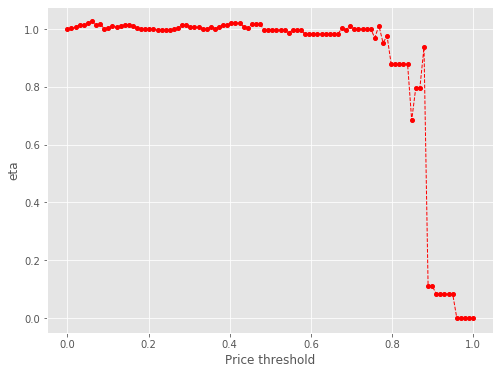

6230 73
Number of cells with price above 75.0th percentile:  73


eta =  1.0
eta =  1.0075916684885722
eta =  1.016767599222121
eta =  1.0054124990502302
eta =  1.0054124990502302
eta =  0.9923422556228935
eta =  0.9949755372719353
eta =  1.0032221932548313
eta =  1.0000141866573473
eta =  0.9999535265840351
eta =  1.00522734290123
eta =  1.00522734290123
eta =  1.0020289062046426
eta =  0.9894314351561327
eta =  0.9901003221067223
eta =  0.9901003221067223
eta =  0.9901003221067223
eta =  0.9901003221067223
eta =  0.9901003221067223
eta =  0.9868153279477777
eta =  0.9868153279477777
eta =  0.9868153279477777
eta =  0.9868153279477777
eta =  0.9901738561527108
eta =  0.9948769791199449
eta =  1.0041608973908298
eta =  1.0041608973908298
eta =  0.9966177526540897
eta =  0.9966177526540897
eta =  0.9966177526540897
eta =  0.9992179152037969
eta =  0.9907499328743288
eta =  0.9981326307096822
eta =  0.9981326307096822
eta =  0.9992820796179147
eta =  1.0048526123862307
eta =  1.0048526123862307
eta =  1.01166653142872
eta =  1.0112960126825137
eta =  1

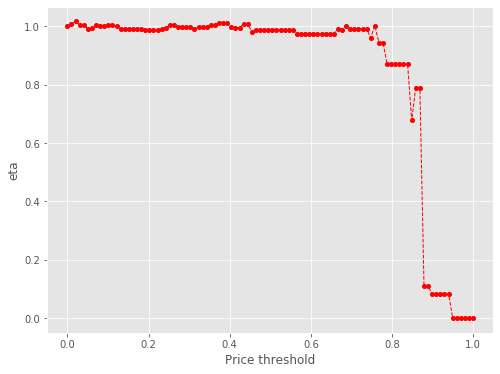

6230 67
Number of cells with price above 76.0th percentile:  67


eta =  1.0
eta =  0.9870001184193714
eta =  0.9896192241610738
eta =  0.9946307486748152
eta =  0.9946307486748152
eta =  0.9945704151566128
eta =  0.9998158406135041
eta =  0.9998158406135041
eta =  0.9966346222582433
eta =  0.9966346222582433
eta =  0.9881717793473905
eta =  0.9847702540420248
eta =  0.9847702540420248
eta =  0.9847702540420248
eta =  0.9847702540420248
eta =  0.9815029441945267
eta =  0.9815029441945267
eta =  0.9815029441945267
eta =  0.9815029441945267
eta =  0.9815029441945267
eta =  0.984843392227653
eta =  0.9918459536410968
eta =  0.9987551361649246
eta =  0.9987551361649246
eta =  0.9912525989039837
eta =  0.9912525989039837
eta =  0.9912525989039837
eta =  0.9938387638384393
eta =  0.9854163677199632
eta =  0.9927593218232068
eta =  0.9927593218232068
eta =  0.9939025828323135
eta =  0.9994431274083736
eta =  0.9994431274083736
eta =  0.9994431274083736
eta =  1.0058518405508599
eta =  1.0058518405508599
eta =  1.0057225705511825
eta =  0.9940499599900247
et

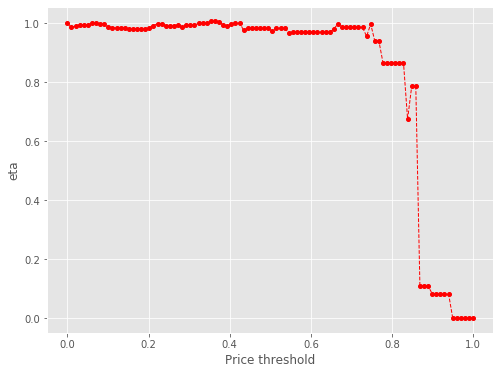

6230 61
Number of cells with price above 77.0th percentile:  61


eta =  1.0
eta =  1.0016188931574455
eta =  1.0052130822876704
eta =  1.0052130822876704
eta =  1.0020146909655647
eta =  1.0020146909655647
eta =  0.9935061636330567
eta =  0.990086276091979
eta =  0.990086276091979
eta =  0.990086276091979
eta =  0.990086276091979
eta =  0.9868013285354599
eta =  0.9868013285354599
eta =  0.9868013285354599
eta =  0.9868013285354599
eta =  0.9868013285354599
eta =  0.99015980909478
eta =  0.9948628653413667
eta =  1.0041466519063527
eta =  1.0041466519063527
eta =  0.9966036141801042
eta =  0.9966036141801042
eta =  0.9966036141801042
eta =  0.9966036141801042
eta =  0.9907358776439109
eta =  0.9907358776439109
eta =  0.9981184707449456
eta =  0.9981184707449456
eta =  0.9992679033465718
eta =  1.0048383570887691
eta =  1.0048383570887691
eta =  1.0048383570887691
eta =  1.0112816659760369
eta =  1.0112816659760369
eta =  1.0111516981464181
eta =  0.9994160760809333
eta =  0.9955428897442515
eta =  0.9955428897442515
eta =  1.0076231481761548
eta =  

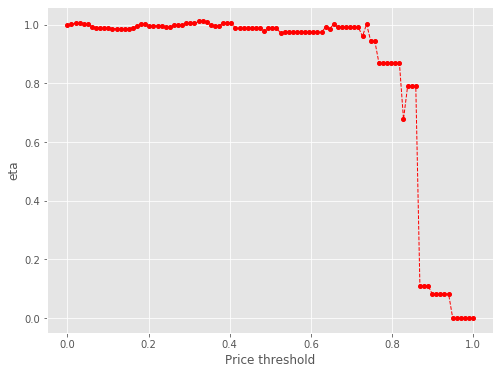

6230 57
Number of cells with price above 78.0th percentile:  57


eta =  1.0
eta =  0.9968181956856086
eta =  0.98835379397573
eta =  0.9849516421321679
eta =  0.9849516421321679
eta =  0.9849516421321679
eta =  0.9849516421321679
eta =  0.9849516421321679
eta =  0.9816837304680627
eta =  0.9816837304680627
eta =  0.9816837304680627
eta =  0.9816837304680627
eta =  0.9816837304680627
eta =  0.9850247937893605
eta =  0.9897034597652186
eta =  0.9989391001767599
eta =  0.9989391001767599
eta =  0.9914351809986668
eta =  0.9914351809986668
eta =  0.9914351809986668
eta =  0.9914351809986668
eta =  0.9940218222873952
eta =  0.9855978748199217
eta =  0.9929421814461677
eta =  0.9929421814461677
eta =  0.994085653036301
eta =  0.994085653036301
eta =  0.9996272181435916
eta =  0.9996272181435916
eta =  1.0064057037176344
eta =  1.0060371117281477
eta =  1.0059078179178018
eta =  0.9942330573398982
eta =  0.9942330573398982
eta =  0.9903799575295903
eta =  0.9903799575295903
eta =  1.0023975671735186
eta =  1.0023975671735186
eta =  0.9759974107689581
eta =

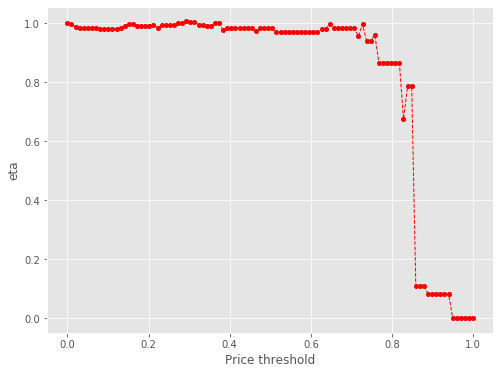

6230 51
Number of cells with price above 79.0th percentile:  51


eta =  1.0
eta =  0.9966821602966912
eta =  0.9966821602966912
eta =  0.9966821602966912
eta =  0.9966821602966912
eta =  0.9966821602966912
eta =  1.0000742692880173
eta =  1.0048244171894207
eta =  1.0142011622157538
eta =  1.0142011622157538
eta =  1.0142011622157538
eta =  1.0065825961287436
eta =  1.0065825961287436
eta =  1.0065825961287436
eta =  1.009208756823424
eta =  1.000656106005727
eta =  1.000656106005727
eta =  1.0081126209371076
eta =  1.0081126209371076
eta =  1.008138548456513
eta =  1.009273562795794
eta =  1.014899793435193
eta =  1.014899793435193
eta =  1.014899793435193
eta =  1.0214076191094368
eta =  1.0214076191094368
eta =  1.0212763499132496
eta =  1.0094232191822519
eta =  1.0055112506698007
eta =  1.0055112506698007
eta =  1.0124306529079266
eta =  1.0177124686076817
eta =  1.0177124686076817
eta =  0.9909089634656314
eta =  0.9978951754208844
eta =  0.9978951754208844
eta =  0.9978951754208844
eta =  0.9978951754208844
eta =  0.9978951754208844
eta =  0.

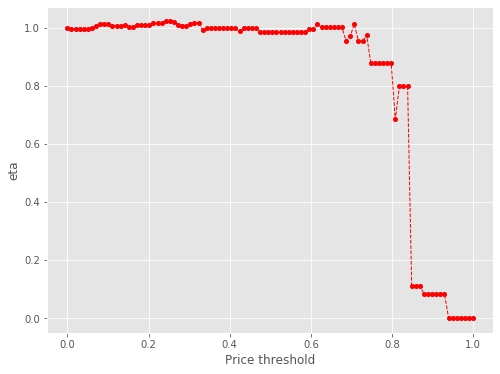

6230 50
Number of cells with price above 80.0th percentile:  50


eta =  1.0
eta =  1.003403400930058
eta =  1.0105379301282262
eta =  1.0175773206513976
eta =  1.0175773206513976
eta =  1.0099333932385277
eta =  1.0099333932385277
eta =  1.0099333932385277
eta =  1.0099333932385277
eta =  1.012568296118598
eta =  1.0039871745149456
eta =  1.0039871745149456
eta =  1.0114685113226203
eta =  1.0114685113226203
eta =  1.0114945251517409
eta =  1.012633317822559
eta =  1.0182782775334105
eta =  1.0182782775334105
eta =  1.0182782775334105
eta =  1.0251832361913387
eta =  1.024807767007072
eta =  1.0246760608309045
eta =  1.0246760608309045
eta =  1.0127834723978284
eta =  1.008858481394391
eta =  1.008858481394391
eta =  1.021100315776426
eta =  1.021100315776426
eta =  1.021100315776426
eta =  0.994207584864024
eta =  1.001217053111327
eta =  1.001217053111327
eta =  1.001217053111327
eta =  1.001217053111327
eta =  1.001217053111327
eta =  1.0008901873473997
eta =  1.0008901873473997
eta =  1.0008901873473997
eta =  0.9910844456233171
eta =  1.0011829

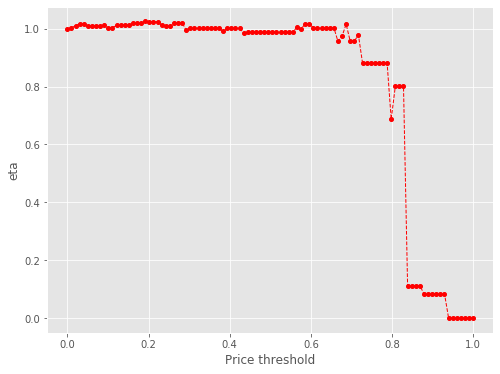

6230 49
Number of cells with price above 81.0th percentile:  49


eta =  1.0
eta =  1.0071103298947912
eta =  1.014125843811374
eta =  1.014125843811374
eta =  1.0065078435078225
eta =  1.0065078435078225
eta =  1.0065078435078225
eta =  1.0065078435078225
eta =  1.0091338091739026
eta =  1.0005817935083203
eta =  1.0005817935083203
eta =  1.0080377546907722
eta =  1.0080377546907722
eta =  1.0080636802847023
eta =  1.0091986103335364
eta =  1.0148244231478234
eta =  1.0148244231478234
eta =  1.0148244231478234
eta =  1.0217059611728372
eta =  1.0213317655263818
eta =  1.0212005060787404
eta =  1.0212005060787404
eta =  1.0093482556059465
eta =  1.0054365776110352
eta =  1.0054365776110352
eta =  1.0123554659882472
eta =  1.017636889440443
eta =  1.017636889440443
eta =  1.017636889440443
eta =  0.9908353748278007
eta =  0.9978210679605983
eta =  0.9978210679605983
eta =  0.9978210679605983
eta =  0.9978210679605983
eta =  0.9978210679605983
eta =  0.9974953108786266
eta =  0.9974953108786266
eta =  0.9974953108786266
eta =  0.9977870377413256
eta = 

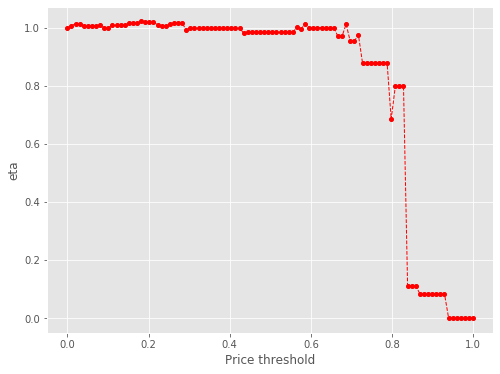

6230 43
Number of cells with price above 82.0th percentile:  43


eta =  1.0
eta =  1.0026089867883476
eta =  0.994112266449063
eta =  0.994112266449063
eta =  1.0015200191362819
eta =  1.0015200191362819
eta =  1.002673368958891
eta =  1.002673368958891
eta =  1.0082628065877923
eta =  1.0082628065877923
eta =  1.0082628065877923
eta =  1.0150998502029027
eta =  1.0147280740176807
eta =  1.0147280740176807
eta =  1.0145976632628235
eta =  1.0028220466600886
eta =  1.0028220466600886
eta =  0.9989356606570955
eta =  0.9989356606570955
eta =  1.0110570881333962
eta =  1.0110570881333962
eta =  1.0110570881333962
eta =  1.0110570881333962
eta =  0.9844288658244321
eta =  0.9913693911048428
eta =  0.9913693911048428
eta =  0.9913693911048428
eta =  0.9913693911048428
eta =  0.9913693911048428
eta =  0.9910457402917141
eta =  0.9910457402917141
eta =  0.9910457402917141
eta =  0.9910457402917141
eta =  0.9913355809169816
eta =  0.9913355809169816
eta =  0.9913355809169816
eta =  0.9913355809169816
eta =  0.9913355809169816
eta =  0.9762846009109369
eta =

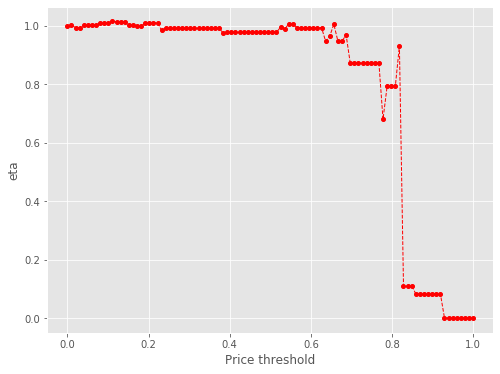

6230 41
Number of cells with price above 83.0th percentile:  41


eta =  1.0
eta =  1.0074516258748913
eta =  1.0074516258748913
eta =  1.008611806532081
eta =  1.008611806532081
eta =  1.0142343481881322
eta =  1.0142343481881322
eta =  1.0142343481881322
eta =  1.0211118849069296
eta =  1.0207379068384868
eta =  1.0207379068384868
eta =  1.0206067237123364
eta =  1.008761364792466
eta =  1.008761364792466
eta =  1.0048519612631495
eta =  1.0048519612631495
eta =  1.0117668266165878
eta =  1.0170451791575408
eta =  1.0170451791575408
eta =  1.0170451791575408
eta =  0.9902592484255126
eta =  0.9972408796905627
eta =  0.9972408796905627
eta =  0.9972408796905627
eta =  0.9972408796905627
eta =  0.9972408796905627
eta =  0.9972408796905627
eta =  0.9969153120217473
eta =  0.9969153120217473
eta =  0.9969153120217473
eta =  0.9871485122328757
eta =  0.9972068692583388
eta =  0.9972068692583388
eta =  0.9972068692583388
eta =  0.9972068692583388
eta =  0.9972068692583388
eta =  0.982066748253891
eta =  0.9835310881247794
eta =  0.9835310881247794
eta = 

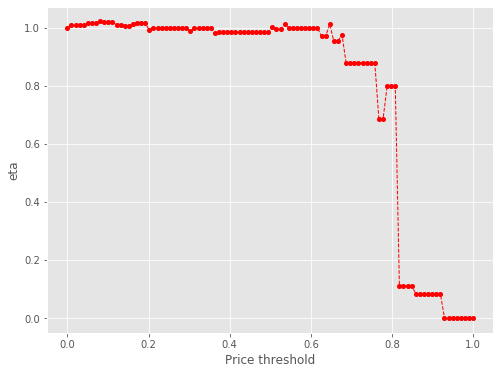

6230 35
Number of cells with price above 84.00000000000001th percentile:  35


eta =  1.0
eta =  1.0067810134128112
eta =  1.0064122839676775
eta =  1.0062829419409707
eta =  1.0062829419409707
eta =  0.9946038276011424
eta =  0.9946038276011424
eta =  0.9907492908894834
eta =  0.9907492908894834
eta =  0.9907492908894834
eta =  1.00277138215091
eta =  1.00277138215091
eta =  1.00277138215091
eta =  0.9763613805769351
eta =  0.9763613805769351
eta =  0.9832450276132659
eta =  0.9832450276132659
eta =  0.9832450276132659
eta =  0.9832450276132659
eta =  0.9832450276132659
eta =  0.9832450276132659
eta =  0.9829240291483677
eta =  0.9829240291483677
eta =  0.9829240291483677
eta =  0.9829240291483677
eta =  0.9832114945030092
eta =  0.9832114945030092
eta =  0.9832114945030092
eta =  0.9832114945030092
eta =  0.9832114945030092
eta =  0.9832114945030092
eta =  0.9682838586647093
eta =  0.9697276471476219
eta =  0.9697276471476219
eta =  0.9697276471476219
eta =  0.9697276471476219
eta =  0.9697276471476219
eta =  0.9697276471476219
eta =  0.9697276471476219
eta =  

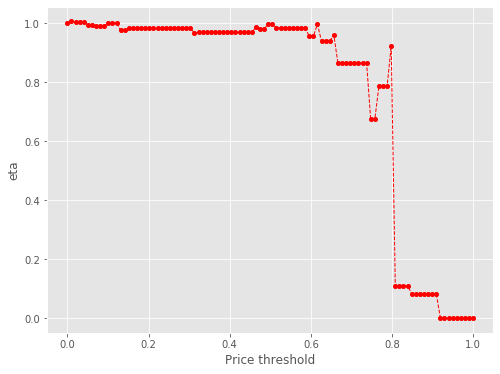

6230 32
Number of cells with price above 85.0th percentile:  32


eta =  1.0
eta =  0.9883938066988386
eta =  0.9845633366083647
eta =  0.9845633366083647
eta =  0.9845633366083647
eta =  0.9965103653816417
eta =  0.9965103653816417
eta =  0.9965103653816417
eta =  0.9965103653816417
eta =  0.9702652602792596
eta =  0.9702652602792596
eta =  0.9771059277987282
eta =  0.9771059277987282
eta =  0.9771059277987282
eta =  0.9771059277987282
eta =  0.9771059277987282
eta =  0.9771059277987282
eta =  0.9767869335561357
eta =  0.9767869335561357
eta =  0.9767869335561357
eta =  0.9767869335561357
eta =  0.9672173319045357
eta =  0.9770726040595896
eta =  0.9770726040595896
eta =  0.9770726040595896
eta =  0.9770726040595896
eta =  0.9770726040595896
eta =  0.9622381720960441
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
eta =  0.9636729459779583
e

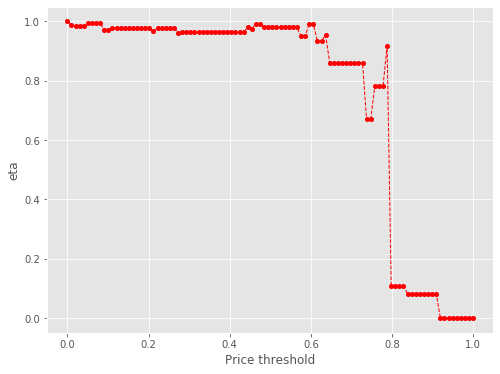

6230 28
Number of cells with price above 86.0th percentile:  28


eta =  1.0
eta =  0.9736629883500201
eta =  0.9805276108939599
eta =  0.9805276108939599
eta =  0.9805276108939599
eta =  0.9805276108939599
eta =  0.9805276108939599
eta =  0.9805276108939599
eta =  0.9805276108939599
eta =  0.9802074995798439
eta =  0.9802074995798439
eta =  0.9802074995798439
eta =  0.9802074995798439
eta =  0.97060438657265
eta =  0.980494170459925
eta =  0.980494170459925
eta =  0.980494170459925
eta =  0.980494170459925
eta =  0.980494170459925
eta =  0.980494170459925
eta =  0.9656077904694226
eta =  0.9656077904694226
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9670475887211595
eta =  0.9666581351424748
eta =  0.9853382680567687
eta =  0.

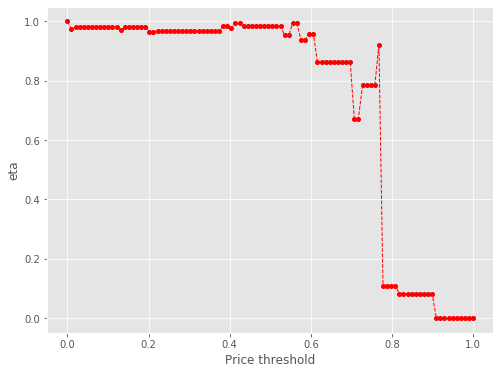

6230 26
Number of cells with price above 87.0th percentile:  26


eta =  1.0
eta =  0.9996735315654965
eta =  0.9996735315654965
eta =  0.9996735315654965
eta =  0.9996735315654965
eta =  0.9898797094431
eta =  0.9999658954692726
eta =  0.9999658954692726
eta =  0.9999658954692726
eta =  0.9999658954692726
eta =  0.9999658954692726
eta =  0.9999658954692726
eta =  0.9999658954692726
eta =  0.9847838854727052
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.98625227681196
eta =  0.9858550890384004
eta =  1.0049061924512488
eta =  1.0042637631658746
eta =  0.9982171032853974
eta =  0.9982171032853974
eta =  1.0148119408887988
eta =  1.0148119408887988
eta =  1.0030223450934146
eta =  1.0030223450934146
eta =  1.003

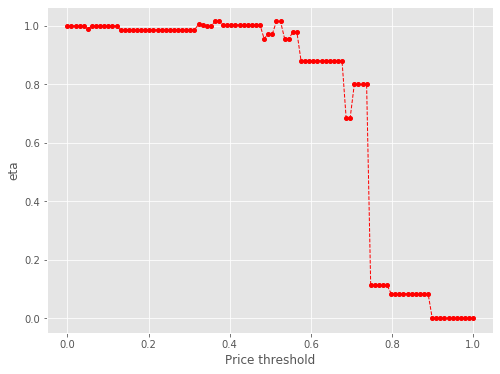

6230 25
Number of cells with price above 88.0th percentile:  25


eta =  1.0
eta =  1.0002924593825329
eta =  1.0002924593825329
eta =  1.0002924593825329
eta =  1.0002924593825329
eta =  1.0002924593825329
eta =  1.0002924593825329
eta =  1.0002924593825329
eta =  0.9851054913202772
eta =  0.9851054913202772
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9865743621995086
eta =  0.9861770447143315
eta =  1.0052343697422474
eta =  1.0045917306554968
eta =  0.9985430960867611
eta =  0.9985430960867611
eta =  1.0151433531500984
eta =  1.0151433531500984
eta =  1.0033499071668666
eta =  1.0033499071668666
eta =  1.0033499071668666
eta =  1.0033499071668666
e

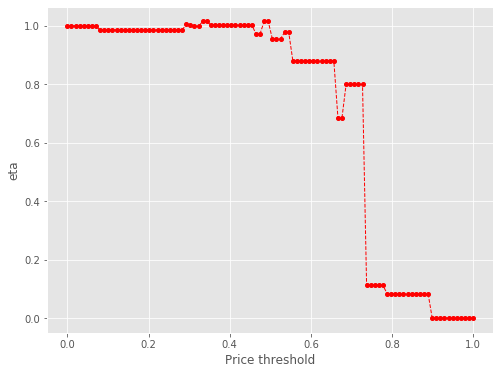

6230 23
Number of cells with price above 89.0th percentile:  23


eta =  1.0
eta =  0.9848174722104471
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9862859136302073
eta =  0.9858887123102832
eta =  0.9858887123102832
eta =  1.0049404654742327
eta =  1.004298014278362
eta =  0.9982511481723538
eta =  0.9982511481723538
eta =  1.0148465517542067
eta =  1.0148465517542067
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
eta =  1.0030565538664773
et

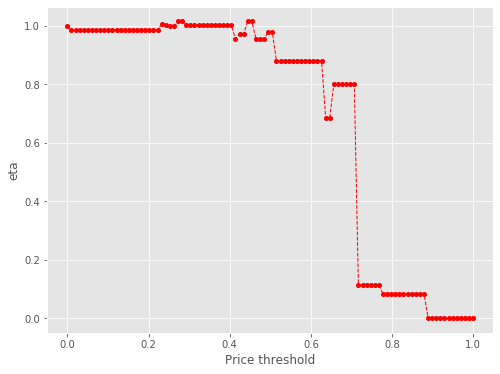

6230 21
Number of cells with price above 90.0th percentile:  21


eta =  1.0
eta =  0.9995972756840232
eta =  1.0189139392403606
eta =  1.0189139392403606
eta =  1.0182625549034334
eta =  1.012131608468488
eta =  1.012131608468488
eta =  1.0289577674478556
eta =  1.0289577674478556
eta =  1.0289577674478556
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  0.968916793838242
eta =  0.9859449353108424
eta =  0.9859449353108424
eta =  1.0288714068300526
eta =  1.0288714068300526
eta =  1.0288714068300526
eta =  0.969220330636554
eta =  0.969220330636554
eta =  0.969220330636554
eta =  0.969220330636554
eta =  0.9912741052231103
eta =  0.9912741052231103
eta =  0.8932058305241283
eta =  0.893205830524128

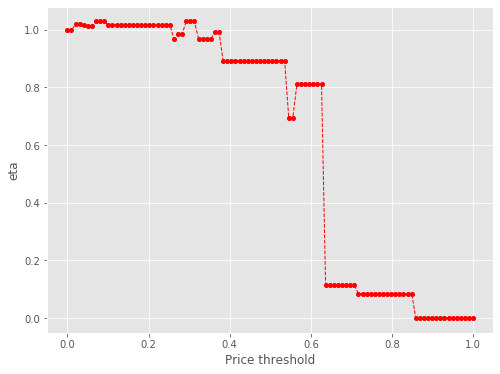

6230 21
Number of cells with price above 91.0th percentile:  21


eta =  1.0
eta =  0.9995972756840232
eta =  1.0189139392403606
eta =  1.0189139392403606
eta =  1.0182625549034334
eta =  1.012131608468488
eta =  1.012131608468488
eta =  1.0289577674478556
eta =  1.0289577674478556
eta =  1.0289577674478556
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  1.017003832260508
eta =  0.968916793838242
eta =  0.9859449353108424
eta =  0.9859449353108424
eta =  1.0288714068300526
eta =  1.0288714068300526
eta =  1.0288714068300526
eta =  0.969220330636554
eta =  0.969220330636554
eta =  0.969220330636554
eta =  0.969220330636554
eta =  0.9912741052231103
eta =  0.9912741052231103
eta =  0.8932058305241283
eta =  0.893205830524128

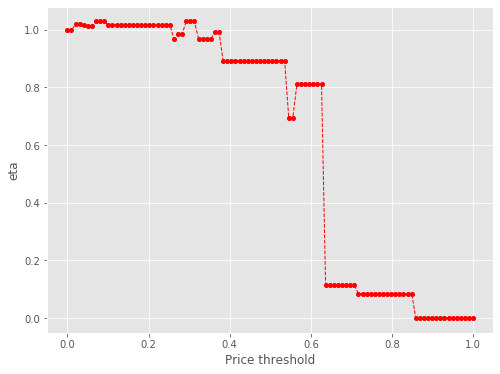

6230 16
Number of cells with price above 92.0th percentile:  16


eta =  1.0
eta =  1.016624477329414
eta =  1.016624477329414
eta =  1.016624477329414
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  1.0048138243596527
eta =  0.9573031666349828
eta =  0.9741272054557509
eta =  0.9741272054557509
eta =  0.9741272054557509
eta =  1.0165391518469566
eta =  1.0165391518469566
eta =  1.0165391518469566
eta =  0.9576030651815476
eta =  0.9576030651815476
eta =  0.9576030651815476
eta =  0.9576030651815476
eta =  0.9793924988896078
eta =  0.9793924988896078
eta =  0.9793924988896078
eta =  0.8824996898137459
eta =  0.8824996898137459
eta =  0.8824996898137459
eta =  0.8824996898137459
eta =  0.8824996898137459
eta 

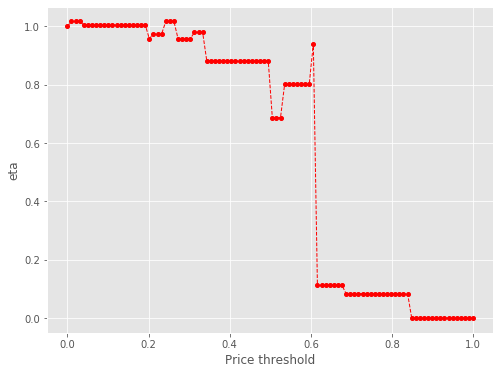

6230 13
Number of cells with price above 93.0th percentile:  13


eta =  1.0
eta =  0.9527169545513097
eta =  0.9694603933982918
eta =  0.9694603933982918
eta =  0.9694603933982918
eta =  1.0116691542284226
eta =  1.0116691542284226
eta =  1.0116691542284226
eta =  1.0116691542284226
eta =  0.9530154163551725
eta =  0.9530154163551725
eta =  0.9530154163551725
eta =  0.9530154163551725
eta =  0.9530154163551725
eta =  0.9747004620619691
eta =  0.9747004620619691
eta =  0.9747004620619691
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.8782718434194962
eta =  0.6839732592771712
e

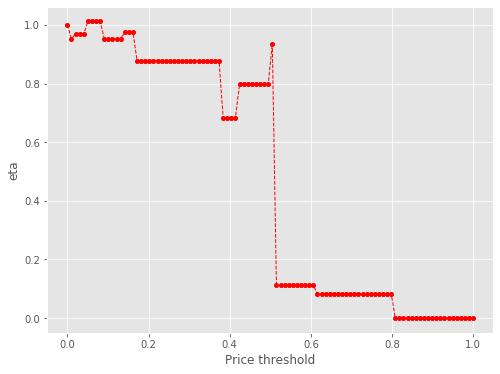

6230 10
Number of cells with price above 94.0th percentile:  10


eta =  1.0
eta =  0.9420228069343639
eta =  0.9420228069343639
eta =  0.9420228069343639
eta =  0.9420228069343639
eta =  0.9420228069343639
eta =  0.9634577252731911
eta =  0.9634577252731911
eta =  0.9634577252731911
eta =  0.9634577252731911
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.868141367905335
eta =  0.6760839316078806
eta =  0.6760839316078806
eta =  0.6760839316078806
eta =  0.6760839316078806
eta =  0.7880062872581574
eta =  0.7880062872581574
eta =  0.7880062872581574
eta =  0.78800628725815

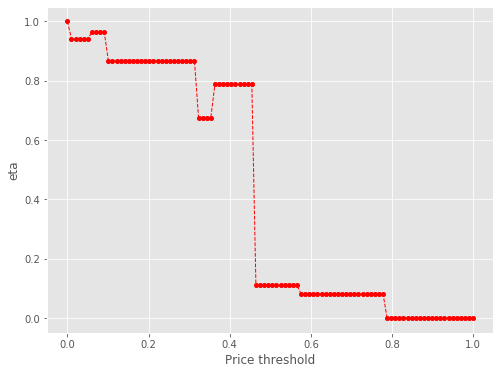

6230 7
Number of cells with price above 95.0th percentile:  7


eta =  1.0
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  1.066118137350669
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.09463747069821167
eta =  0.09

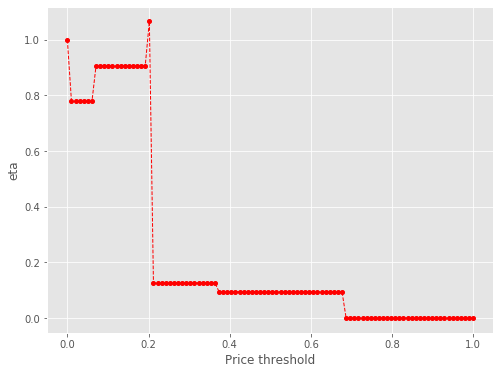

6230 7
Number of cells with price above 96.00000000000001th percentile:  7


eta =  1.0
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.7787717030915672
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  0.9076935121286424
eta =  1.066118137350669
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.12618329426425723
eta =  0.09463747069821167
eta =  0.09

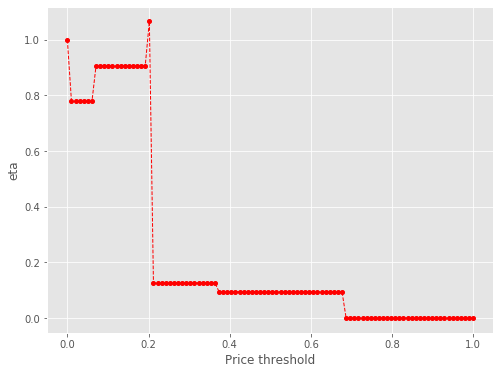

6230 3
Number of cells with price above 97.0th percentile:  3


eta =  1.0
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
eta =  0.7500000000001484
e

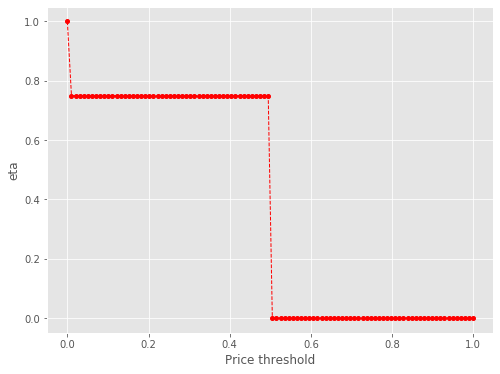

6230 2
Number of cells with price above 98.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

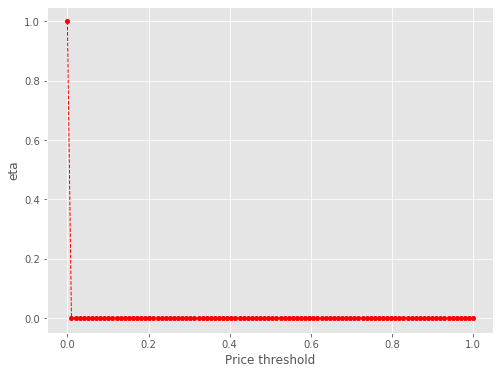

6230 1
Number of cells with price above 99.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning:

invalid value encountered in true_divide



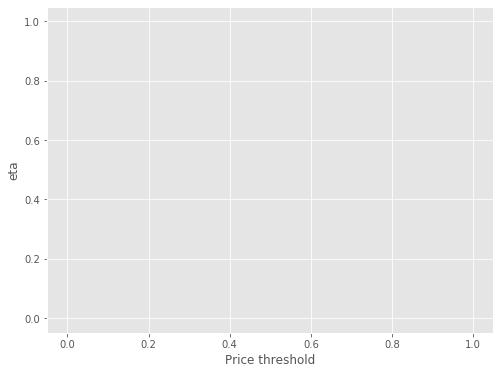

6230 1
Number of cells with price above 100.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

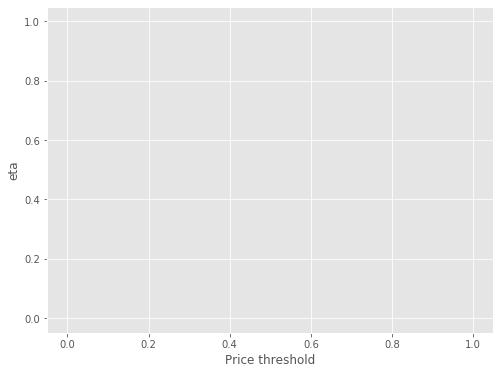


time: 2min 11s


In [30]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
#keys = np.array(keys)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_2d = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    etas = []
    lval = np.linspace(min(vals_cut), max(vals_cut), 100)
    for k in tqdm_notebook(lval):
        loubar_keys = keys[vals_cut>=k]
        dist_mat = mat[keys.reshape(-1,1), keys]

        total_dist = dist_mat.sum()
        dist_corr = dist_mat[dist_mat>0]

        loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

        loubar_dist = loubar_dist_mat.sum()

        loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
        eta = loubar_dist_corr.mean()/dist_corr.mean()
        etas.append(eta)
        print('eta = ', eta)
    etas_array = np.array(etas)
    etas_array = np.where(np.isnan(etas_array), 0, etas_array)
    lval = (lval - lval.min())/(lval - lval.min()).max()
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(lval, etas_array, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
    plt.xlabel("Price threshold")
    plt.ylabel("eta")
    plt.show()
    etas_2d.append(etas)
etas_2d = np.array(etas_2d)
etas_2d = np.where(np.isnan(etas_2d), 0, etas_2d)
lval = lval/lval.max()

In [ ]:
X,Y = np.meshgrid(np.linspace(0,1, 100),np.linspace(0,1, 100))
etas_surface = etas_2d
fig, ax = plt.subplots(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
# Plot a 3D surface
ax.plot_surface(X, Y, etas_surface)
ax.set_xlabel('Price treshold')
ax.set_ylabel('CCity boundary cutoff threshold')
ax.view_init(45, 45)
plt.show()

In [32]:
pickle_in = open("etas_surface_dict.pickle","rb")
etas_surface_dict = pickle.load(pickle_in)
#etas_surface_dict = {}
etas_surface_dict['Berlin'] = etas_surface


pickle_out = open("etas_surface_dict.pickle","wb")
pickle.dump(etas_surface_dict, pickle_out)
pickle_out.close()

etas_surface_dict

{'NY': array([[1.        , 0.40697941, 0.38848337, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.95418349, 0.92471336, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.96911482, 0.94572765, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]]),
 'Boston': array([[1.        , 0.49308111, 0.46754658, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.94621367, 0.92299712, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.97340556, 0.95206791, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.       

time: 18 ms


6230 857
Number of cells with price above 5th percentile:  857
total number of cells:  6230
number of cells within urban airbnb territory:  857



Mean travel times in minutes:  13.601257836273364
Mean travel times in minutes:  22.667079998627223
Mean travel times in minutes:  30.190810350744734
Mean travel times in minutes:  37.997421488548746
Mean travel times in minutes:  44.493454326538085
Mean travel times in minutes:  48.70508962523165


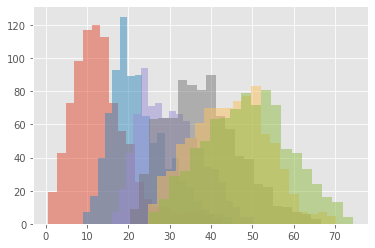

time: 59min 34s


In [33]:
from tqdm import tqdm_notebook

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.1*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.1*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

print('total number of cells: ', len(polylist))

times_names = ['times_{}'.format(c) for c in range(1, len(centers)+1)]
times_dict = {name:[] for name in times_names}

plist = poly_prices[poly_prices.index.isin(keys)].geometry.tolist()
print('number of cells within urban airbnb territory: ', len(plist))
for poly in tqdm_notebook(plist):
    origin = ox.get_nearest_node(G, poly.centroid.coords[0][::-1])
    dists_to_centers = []
    for node, target in centers.items():
        try:
            if origin!=target:
                path = nx.shortest_path(G, origin, target, weight='length')
                edges = [ tuple( path[i:i+2] ) for i in range( len(path) - 1 ) ]
                dist = np.sum([G.get_edge_data(*edge)[0]['length'] for edge in edges])
                dists_to_centers.append(dist)
        except:
            pass
    if len(dists_to_centers) != 0:
        dists_to_centers = sorted(dists_to_centers)
        #print('distance list length equal to # of centers: ', len(dists_to_centers)==len(centers))
        if len(dists_to_centers)==len(centers):
            for n, dist in enumerate(dists_to_centers):
                time = (dist/3.4)/60
                times_dict['times_{}'.format(n+1)].append(time)
                #print(times_dict['times_{}'.format(n+1)][-1])
        else:
            print('Distance list length NOT equal to # of centers')

#print(distances_dict)
for center in range(1, len(centers)+1):
    print("Mean travel times in minutes: ", np.mean(times_dict['times_{}'.format(center)]))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=0.5)
plt.show()

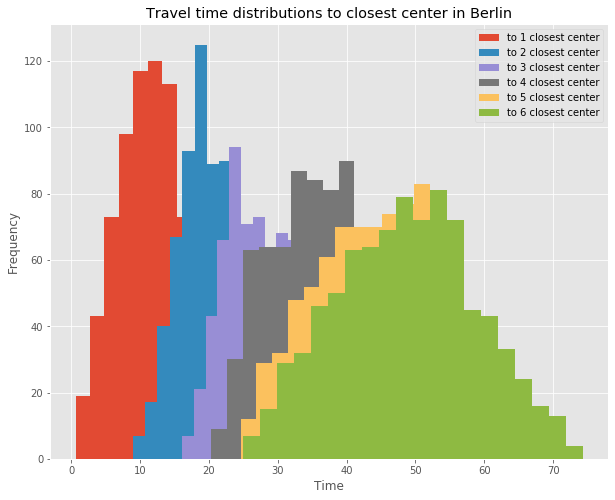

time: 481 ms


In [34]:
for center in range(1, len(centers)+1):
    times_dict['times_{}'.format(center)] = np.array(times_dict['times_{}'.format(center)])

fig, ax = plt.subplots(figsize=(10,8))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=1, label='to {} closest center'.format(center))
plt.title('Travel time distributions to closest center in Berlin')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [35]:
pickle_in = open("City_Accessibility.pickle","rb")
access_dict = pickle.load(pickle_in)
#access_dict = {}
access_dict['Berlin'] = times_dict


pickle_out = open("City_Accessibility.pickle","wb")
pickle.dump(access_dict, pickle_out)
pickle_out.close()

access_dict

{'Paris': {'times_1': array([ 4.73219737,  4.40047807,  7.81577632,  7.07926754,  6.7129386 ,
          7.48037281, 10.85755263,  8.41227193, 14.20045614, 15.15502193,
         16.00692982, 15.80582895, 14.35941228, 14.10681579, 12.26687281,
         13.89203947, 14.31310965, 15.99389474, 16.77728947, 17.82112281,
         20.19769737, 20.40849561, 21.93033333, 22.03087719, 20.6584386 ,
         20.62538596, 19.53197368, 20.61141228, 21.70609211, 23.22407018,
         21.70395614, 23.12607456, 22.79396053, 23.95434211, 21.49400439,
         21.55605702, 22.35374123, 22.36948246, 22.44162719, 21.54410965,
         21.93589912, 21.86757456, 21.86757456, 21.41060088, 21.92571491,
         22.93862281, 23.57200877, 25.13889474, 24.49192982, 26.04400877,
         26.815     , 38.90660088, 38.56507018, 37.89241228, 36.57546491,
         29.87379386, 27.54254825, 25.54755702, 26.98263158, 25.76562281,
         25.03485526, 25.37799123, 25.69687719, 26.07382018, 23.81846491,
         24.034649

time: 557 ms


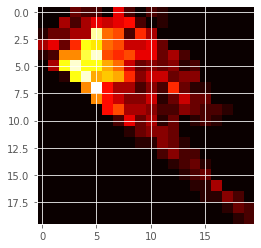

time: 143 ms


In [36]:
x = times_dict['times_{}'.format(1)]
y = times_dict['times_{}'.format(2)]
c_xy = np.histogram2d(x, y, 20)[0]
c_xx = np.histogram2d(x, x, 20)[0]
plt.imshow(c_xy, cmap='hot', interpolation='nearest')
plt.show()

In [37]:
from sklearn.metrics import mutual_info_score

def calc_MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

mi_list = []
for center in range(1, len(centers)+1):
    mi_list.append(times_dict['times_{}'.format(center)])

mis = []
for pair in combinations_with_replacement(mi_list, 2):
    MI = calc_MI(pair[0], pair[1], 20)
    print(MI)
    mis.append(MI)
mis = np.array(mis)
avg_mi = np.mean(mis)
print('average mutual information = ', avg_mi)

2.545345808287553
0.48444409128889465
0.4565569344301547
0.5805789243716251
0.5149033511936615
0.5339982736511071
2.6665566610742197
0.5976338918520857
0.6589276266771316
0.6057663454426484
0.5941244000644619
2.771382661479787
0.6509665363389745
0.6202932837240911
0.753743869315225
2.7218247591298588
0.9110195324717736
1.155096500331991
2.772227295756362
1.304469752526061
2.810879761568441
average mutual information =  1.2719400124274334
time: 53 ms


In [38]:
pickle_in = open("Time_distribution_mutual_information.pickle","rb")
MI_dict = pickle.load(pickle_in)
#MI_dict = {}
MI_dict['Berlin'] = avg_mi


pickle_out = open("Time_distribution_mutual_information.pickle","wb")
pickle.dump(MI_dict, pickle_out)
pickle_out.close()

MI_dict

{'Beijing': 1.629373608642793,
 'Florence': 2.0836399429599792,
 'Palermo': 1.8596013030930105,
 'Los_Angeles': 1.5602500680599918,
 'Moscow': 1.5631970905638934,
 'Porto': 1.6277816420571996,
 'Prague': 2.176480497902222,
 'Reykjavik': 1.3730161847793374,
 'Riga': 2.240374487910287,
 'Rome': 1.6095563575725969,
 'Seoul': 1.2910685865906735,
 'Siena': 2.7660068415344448,
 'Sydney': 1.2791891753795948,
 'Tallin': 2.3884073435187867,
 'Treviso': 2.631909071373147,
 'Valencia': 2.1872520197930965,
 'Venezia': 2.719891808939249,
 'Verona': 2.7080241467515376,
 'Vicenza': 2.6192607829416756,
 'Vienna': 1.4481542925032476,
 'Wellington': 2.1855226822614866,
 'Zurich': 2.462051055806955,
 'Aarhus': 2.2910468431831847,
 'Milan': 1.6107461389394335,
 'Busan': 1.903641833377143,
 'Barcelona': 1.6449937230537024,
 'Bologna': 2.7317991260148045,
 'Bremen': 1.9447717965210316,
 'Brno': 2.4300669174144036,
 'Budapest': 2.219525897631017,
 'Dublin': 1.830502368836079,
 'Boston': 1.1451275682586615,
 

time: 7.98 ms
